In [1]:
# Identify whether a CUDA-enabled GPU is available
from pathlib import Path
import torch
import pickle
import os
import subprocess
import sys

sys.path.append("../..")


PREFER_CUDA = True
REQUIRE_CUDA_FOR_TRAINING = False  # Keep False so the notebook can open/load data when CUDA is broken.


def _nvidia_smi_summary():
    try:
        result = subprocess.run(
            ["nvidia-smi"],
            text=True,
            capture_output=True,
            timeout=10,
        )
    except Exception as exc:
        return f"nvidia-smi could not be executed: {type(exc).__name__}: {exc}"

    output = (result.stdout or result.stderr).strip()
    if result.returncode != 0:
        return f"nvidia-smi failed with exit code {result.returncode}:\n{output}"

    return "\n".join(output.splitlines()[:8])


def choose_torch_device(prefer_cuda=True, require_cuda=False):
    if not prefer_cuda:
        print("PREFER_CUDA=False. Using CPU.")
        return torch.device("cpu")

    cuda_error = None
    try:
        cuda_available = torch.cuda.is_available()
    except Exception as exc:
        cuda_available = False
        cuda_error = f"torch.cuda.is_available() failed: {type(exc).__name__}: {exc}"

    if cuda_available:
        try:
            device = torch.device("cuda")
            _ = torch.empty(1, device=device)
            print(f"Using CUDA device: {torch.cuda.get_device_name(0)}")
            return device
        except Exception as exc:
            cuda_error = f"CUDA tensor allocation failed: {type(exc).__name__}: {exc}"

    diagnostic = _nvidia_smi_summary()
    message = (
        "CUDA is not usable in this environment.\n"
        f"PyTorch: {torch.__version__}, torch.version.cuda: {torch.version.cuda}\n"
        f"CUDA error: {cuda_error or 'torch.cuda.is_available() returned False'}\n"
        f"nvidia-smi diagnostic:\n{diagnostic}\n\n"
        "For real scratch training, fix the NVIDIA driver/CUDA stack first. "
        "The notebook will use CPU fallback only for inspection/smoke tests."
    )
    if require_cuda:
        raise RuntimeError(message)

    print(message)
    print("Falling back to CPU.")
    return torch.device("cpu")


device = choose_torch_device(
    prefer_cuda=PREFER_CUDA,
    require_cuda=REQUIRE_CUDA_FOR_TRAINING,
)

DATA_HOME = Path("../../data")
NEW_VALIDATION_HOME = DATA_HOME / "new_validation"

TRAIN_5SEC_PATH = NEW_VALIDATION_HOME / "r1_r8_train_5sec.pkl"
TRAIN_2SEC_PATH = NEW_VALIDATION_HOME / "r1_r8_train.pkl"
VALID_2SEC_PATH = NEW_VALIDATION_HOME / "r9_r10_val.pkl"
VALID_5SEC_PATH = NEW_VALIDATION_HOME / "r9_r10_val_5sec.pkl"
TEST_2SEC_PATH = NEW_VALIDATION_HOME / "r11_test.pkl"

required_paths = [
    TRAIN_5SEC_PATH,
    TRAIN_2SEC_PATH,
    VALID_2SEC_PATH,
    VALID_5SEC_PATH,
    TEST_2SEC_PATH,
]
missing_paths = [path for path in required_paths if not path.exists()]
if missing_paths:
    missing = "\n".join(str(path) for path in missing_paths)
    raise FileNotFoundError(f"Missing new-validation pickle files:\n{missing}")

# Training uses 5-second windows because TrainCroppingDataset samples jittered 2-second crops from them.
with TRAIN_5SEC_PATH.open("rb") as f:
    train_dataset = pickle.load(f)

# Fixed 2-second windows are used for validation/test metrics, matching valid_model(win_offset=0.5).
with VALID_2SEC_PATH.open("rb") as f:
    valid_dataset = pickle.load(f)

with TEST_2SEC_PATH.open("rb") as f:
    test_dataset = pickle.load(f)

meta_information = train_dataset.get_metadata()
SFREQ = 100

print(f"Train dataset: {TRAIN_5SEC_PATH.relative_to(DATA_HOME)} | windows={len(train_dataset):,}")
print(f"Valid dataset: {VALID_2SEC_PATH.relative_to(DATA_HOME)} | windows={len(valid_dataset):,}")
print(f"Holdout test dataset: {TEST_2SEC_PATH.relative_to(DATA_HOME)} | windows={len(test_dataset):,}")


Using CUDA device: NVIDIA GeForce RTX 5090


/home/qdata/miniconda3/envs/ayana/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Train dataset: new_validation/r1_r8_train_5sec.pkl | windows=75,157
Valid dataset: new_validation/r9_r10_val.pkl | windows=17,867
Holdout test dataset: new_validation/r11_test.pkl | windows=15,751


/home/qdata/miniconda3/envs/ayana/lib/python3.12/site-packages/braindecode/datasets/base.py:1322: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  return pd.concat(all_dfs)


In [2]:
meta_information_valid = valid_dataset.get_metadata()
meta_information_test = test_dataset.get_metadata()

def summarize_split_metadata(name, metadata):
    return {
        "split": name,
        "n_windows": len(metadata),
        "n_subjects": metadata["subject"].nunique() if "subject" in metadata else None,
        "target_std": metadata["target"].std(),
        "target_min": metadata["target"].min(),
        "target_max": metadata["target"].max(),
    }

split_summary = [
    summarize_split_metadata("r1_r8_train_5sec", meta_information),
    summarize_split_metadata("r9_r10_val", meta_information_valid),
    summarize_split_metadata("r11_test", meta_information_test),
]

default_rmse_train = meta_information["target"].std()
default_rmse_valid = meta_information_valid["target"].std()
default_rmse_test = meta_information_test["target"].std()

print(f"Default std on train: {default_rmse_train:.4f}, on valid: {default_rmse_valid:.4f}, on holdout test: {default_rmse_test:.4f}")
split_summary


/home/qdata/miniconda3/envs/ayana/lib/python3.12/site-packages/braindecode/datasets/base.py:1322: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  return pd.concat(all_dfs)


Default std on train: 0.4019, on valid: 0.4134, on holdout test: 0.4297


/home/qdata/miniconda3/envs/ayana/lib/python3.12/site-packages/braindecode/datasets/base.py:1322: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  return pd.concat(all_dfs)


[{'split': 'r1_r8_train_5sec',
  'n_windows': 75157,
  'n_subjects': 1228,
  'target_std': np.float64(0.4019324994727534),
  'target_min': np.float64(0.0),
  'target_max': np.float64(2.4980000000000047)},
 {'split': 'r9_r10_val',
  'n_windows': 17867,
  'n_subjects': 308,
  'target_std': np.float64(0.4133507372575732),
  'target_min': np.float64(0.0),
  'target_max': np.float64(2.410000000000025)},
 {'split': 'r11_test',
  'n_windows': 15751,
  'n_subjects': 292,
  'target_std': np.float64(0.4296951339802988),
  'target_min': np.float64(0.0),
  'target_max': np.float64(2.420000000000016)}]

### Convert regression target to segmentation

In [3]:
import torch

def soft_label_1d(
    y_sec: torch.Tensor,
    T: int,
    dt: float,
    sigma: float | torch.Tensor = 0.12,
    density: bool = True,
    eps: float = 1e-8,
) -> torch.Tensor:
    y_sec = y_sec.to(torch.float32).view(-1)                 # (B,)
    B = y_sec.numel()
    device = y_sec.device
    u_star = (y_sec / dt).clamp(0.0, T - 1e-6).unsqueeze(1)  # (B,1)
    grid = torch.arange(T, device=device, dtype=torch.float32).unsqueeze(0)  # (1,T)
    rel_sec = (grid - u_star) * dt                           # (B,T)
    if not torch.is_tensor(sigma):
        sigma = torch.tensor(float(sigma), device=device, dtype=torch.float32)
    sigma = sigma.to(torch.float32)
    sigma = sigma.view(-1, 1) if sigma.numel() > 1 else sigma.view(1, 1)
    if sigma.numel() == 1:
        sigma = sigma.expand(B, 1)                           # (B,1)
    q = torch.exp(-0.5 * (rel_sec / sigma).pow(2))           # (B,T)
    if density:
        q = q / (q.sum(dim=1, keepdim=True) + eps)
    else:
        q = q / q.amax(dim=1, keepdim=True).clamp_min(eps)
        idx = u_star.round().long().clamp_(0, T - 1).squeeze(1)
        q[torch.arange(B, device=device), idx] = 1.0
        q.clamp_(0, 1)
    return q

### `TrainCroppingDataset`

This dataset generates training samples for predicting **reaction time** from EEG.  

- Each item yields a cropped 2-second EEG segment (`X_crop`), a soft temporal label (`q`), and a scalar target (`y_rel_sec`). 
- The crop starts around **0.5 s after stimulus** with random jitter ±`cropping_offset`.  
- Optional augmentations include time-scaling, channel dropout, cutout, and Gaussian noise.  
- The soft label `q` is a 1-D Gaussian density centered at `y_rel_sec`, enabling smooth supervision.  
- Supports channel selection, crop probability, and end-time trimming.  
- Designed to train models robust to small temporal shifts in stimulus-locked EEG.


In [4]:
from torch.utils.data import Dataset
import random
import numpy as np
from torch.nn import functional as F

class TrainCroppingDataset(Dataset):
    """
    base[i] -> (X_full, y_abs), X_full: (C, T_full), y_abs: seconds from stimulus.
    Returns: X_crop (C,T_crop), q (T_crop,), y_rel_sec (scalar)
    """
    def __init__(
        self,
        base: Dataset,
        sfreq: float,
        crop_sec: float = 2.0,
        sigma: float = 0.12,
        cropping_offset: float = 0.2,
        crop_proba: float = 1.,
        dropout_range: float = 0.2,
        dropout_proba: float = 0.5,
        use_channels: list | None = None,
        end_time: float | None = None,
        use_augmentation: bool = False,
        
    ):
        self.base = base
        self.sfreq = float(sfreq)
        self.crop_sec = float(crop_sec)
        self.T_crop = int(round(self.crop_sec * self.sfreq))
        self.sigma = float(sigma)
        self.cropping_offset = cropping_offset
        self.crop_proba = crop_proba
        self.dropout_proba = dropout_proba
        self.dropout_range = dropout_range
        self.use_channels = use_channels
        self.end_time = end_time
        self.use_augmentation = use_augmentation
        self.dt = 1.0 / self.sfreq

    def __len__(self):
        return len(self.base)

    def _crop_segment(self, X_full, y_abs):
        """
        Crops a 2-second window that starts around the default 0.5 s offset
        with a random shift in [−cropping_offset, +cropping_offset] seconds.
        """
        if torch.rand((), device=X_full.device) < self.crop_proba:
            start_second = 0.5 + random.uniform(-self.cropping_offset, self.cropping_offset)  # e.g. −0.2…+0.2 s     
            start_second = max(start_second, y_abs - 2.)
            start_second = min(start_second, y_abs - self.cropping_offset) 
            start_second = np.clip(start_second, 0.5 - self.cropping_offset, 0.5 + self.cropping_offset)
            start_second = np.clip(start_second, 0, self.end_time - self.crop_sec)
        else:
            start_second = 0.5      
        start_point = int(round(start_second * self.sfreq))
        end_point = start_point + self.T_crop

        X_crop = X_full[:, start_point:end_point].contiguous().to(torch.float32)
        y_rel_sec = y_abs - start_second #target position in seconds from crop start
        return X_crop, y_rel_sec
    
    
    def _augment_segment(self, X: torch.Tensor, y_rel_sec: float):
        # X: (C,T), y_rel_sec: float in [0, crop_sec]
        C, T = X.shape

        # time scaling
        if torch.rand((), device=X.device) < 0.2:  # вероятность применить
            min_scale, max_scale = 0.8, 1.2        # ±20%
            eps = 1e-6

            lb = max(min_scale, (y_rel_sec / self.crop_sec) + eps)
            ub = max_scale
            scale = 1.0 if lb > ub else float(torch.empty((), device=X.device).uniform_(lb, ub))
            new_T = int(round(T * scale))

            X = F.interpolate(X.unsqueeze(0), size=new_T, mode='linear', align_corners=False).squeeze(0)

            if new_T > T:
                X = X[:, :T]
            elif new_T < T:
                X = F.pad(X, (0, T - new_T))
            y_rel_sec = y_rel_sec / scale

        # channel dropout
        if torch.rand((), device=X.device) < self.dropout_proba:
            # drop up to dropout_range% of channels
            drop = torch.rand((), device=X.device).item() * self.dropout_range
            if drop > 0:
                ch_mask = (torch.rand(C, device=X.device) > drop).to(X.dtype).unsqueeze(-1)  # (C,1)
                X = X * ch_mask

        # cutout
        if torch.rand((), device=X.device) < 0.25:
            seg_len = int(torch.randint(10, min(60, T) + 1, (1,), device=X.device))
            start = int(torch.randint(0, T - seg_len + 1, (1,), device=X.device))
            X[:, start:start + seg_len] = 0

        # gaussian noise
        if torch.rand((), device=X.device) < 0.2:
            noise_std = 0.03 * torch.randn((), device=X.device).abs().item() + 0.01
            X = X + torch.randn_like(X) * noise_std

        return X.contiguous(), y_rel_sec  # y_rel_sec не меняем (нет аугов по времени)

    def __getitem__(self, idx: int):
        batch = self.base[idx]              # expect (X_full, y_abs)
        X_full, y_abs = batch[0], batch[1]

        # to tensors
        X_full = torch.as_tensor(X_full)    # (C, T_full)
        y_abs = float(y_abs.item())

        # channel subset on (C,T)
        if self.use_channels is not None:
            X_full = X_full[self.use_channels, :]

        # optional truncate by end_time (sec)
        if self.end_time is not None:
            t_end = min(X_full.shape[1], int(round(self.end_time * self.sfreq)))
            X_full = X_full[:, :t_end]

        X_crop, y_rel_sec = self._crop_segment(X_full, y_abs)
        if self.use_augmentation:
            X_crop, y_rel_sec = self._augment_segment(X_crop, y_rel_sec)

        q = soft_label_1d(
            torch.tensor([y_rel_sec], dtype=torch.float32),
            T=self.T_crop, dt=self.dt, sigma=self.sigma, density=True
        ).squeeze(0)                         # (T_crop,)

        return X_crop, q, torch.tensor(y_rel_sec, dtype=torch.float32)

### `train_one_epoch` — single-epoch training loop for time-distribution targets

**Inputs.**  
`dataloader` yields `(X, q, y_rel)` where `X:(B,C,T)`, `q:(B,T)` is a soft time distribution, `y_rel:(B,)` is the target time (s).  
`model(X) → logits (B,1,T)`. Optimizer, device, and loss weights (`lambda_*`) control objectives.

**Losses (weighted).**  
- **CE** on soft labels `q` (optionally **focal**).  
- **Time RMSE** via expected time `t_hat = softmax(z/τ)·t_grid`.  
- Optional **KL**(q‖p), **Wasserstein-1** (CDF distance) and **entropy** regularization.  
- Optional **hazard** head: converts logits to discrete-time hazard, forms normalized event-time distribution with its own CE/RMSE/KL/WASS/entropy, scaled by `lambda_hazard`.

**Regularization.**  
Optional **mixup** over samples with bin-wise pairing by target time.

**Optimization.**  
Gradient accumulation (`grad_accum`), tqdm progress with per-batch metrics; returns `avg_loss`, dataset **NRMSE**, and a dict of averaged loss components.


In [5]:
from typing import Optional
import torch
import torch.nn.functional as F
from torch.utils.data import DataLoader
from torch.nn import Module
from tqdm import tqdm

def train_one_epoch(
    dataloader: DataLoader,
    model: Module,
    optimizer,
    epoch: int,
    device,
    print_batch_stats: bool = True,
    temperature: float = 1.0,
    lambda_time: float = 1.0,
    lambda_ce: float = 1.0,
    lambda_kl: float = 0.0,
    lambda_wass: float = 0.0,
    lambda_entropy: float = 0.0, 
    lambda_focal: float = 0.0,   
    lambda_hazard: float = 0.0,
    mixup_p: float = 0.5,
    mixup_alpha: float = 0.4,
    grad_accum: int = 1,
    plot_last_batch: bool = False,
    plot_save_path = None,
    plot_title_prefix: str = None,
    plot_show: bool = True,
):
    """Dataset must yield: X (B,C,T), q (B,T), y_rel (B,) seconds from crop start. model(X)->logits (B,1,T)."""
    model.train()

    total_loss = total_ce = total_rmse = total_kl = total_wass = 0.0
    sse, n_samples = 0.0, 0
    sum_y, sum_y2 = 0.0, 0.0
    last_plot_payload = None

    n_batches = len(dataloader)
    progress = tqdm(enumerate(dataloader), total=n_batches, disable=not print_batch_stats)

    for i, (X, q, y_rel) in progress:
        X     = X.to(device).float()              # (B,C,T)
        q     = q.to(device).float()              # (B,T) soft distribution over T
        y_rel = y_rel.to(device).float().view(-1) # (B,)

        B, C, T = X.shape
        dt = 1.0 / float(model.sfreq)

        if mixup_p>0 and torch.rand((),device=X.device)<mixup_p:
            bins=50
            b=torch.clamp((y_rel/(T*dt)*bins).long(),0,bins-1)
            partner=torch.arange(B,device=X.device)
            valid=torch.zeros(B,dtype=torch.bool,device=X.device)
            for k in range(bins):
                g=torch.where(b==k)[0]
                if g.numel()>=2:
                    p=g[torch.randperm(g.numel(),device=X.device)]
                    partner[p]=p.roll(1)
                    valid[p]=True
            if valid.any():
                lam=torch.distributions.Beta(mixup_alpha,mixup_alpha).sample((B,)).to(X.device)
                lam=torch.where(valid,lam,torch.ones_like(lam))
                X=lam.view(-1,1,1)*X+(1-lam).view(-1,1,1)*X[partner]
                q=lam.view(-1,1)*q+(1-lam).view(-1,1)*q[partner]
                y_rel=lam*y_rel+(1-lam)*y_rel[partner]

        z = model(X).squeeze(1)                    # (B,T)

        log_p = F.log_softmax(z / temperature, dim=-1)
        p = torch.softmax(z / temperature, dim=-1)
        entropy = -(p * log_p).sum(dim=-1).mean()   # H(p)

        # focal-weighted CE
        if lambda_ce:
            if lambda_focal > 0:
                focal_weight = (1.0 - p.detach()).pow(lambda_focal)  # detach to avoid 2nd order grads
                ce = -((focal_weight * q) * log_p).sum(dim=-1).mean()
            else:
                ce = -(q * log_p).sum(dim=-1).mean()
        else:
            ce = torch.tensor(0.0, device=device)

        # RMSE (time), KL, WASS
        t_grid = (torch.arange(T, device=device, dtype=z.dtype) * dt)[None, :]
        t_hat = (torch.softmax(z / temperature, dim=-1) * t_grid).sum(dim=-1)
        # ce   = -(q * log_p).sum(dim=-1).mean() if lambda_ce else torch.tensor(0.0, device=device)
        rmse = F.mse_loss(t_hat, y_rel).sqrt()
        kl   = (q * (torch.log(q + 1e-8) - log_p)).sum(dim=-1).mean() if lambda_kl else torch.tensor(0.0, device=device)
        if lambda_wass>0:
            wass = (torch.abs(torch.cumsum(p, -1) - torch.cumsum(q, -1)).sum(-1).mean()) * dt
        else:
            wass = torch.tensor(0.0, device=device)

        base_loss = lambda_ce * ce + lambda_time * rmse + lambda_kl * kl + lambda_wass * wass + lambda_entropy * entropy

        haz_loss = torch.tensor(0.0, device=device)
        t_hat_haz = None
        if lambda_hazard > 0.0:
            x = z / temperature
            log_h   = F.logsigmoid(x)    # log σ(x_t)
            log1m_h = F.logsigmoid(-x)   # log (1-σ(x_t)) = log σ(-x_t)
            log_surv_prev = torch.cumsum(log1m_h, dim=-1) - log1m_h
            log_p_haz = log_h + log_surv_prev
            log_p_haz = log_p_haz - torch.logsumexp(log_p_haz, dim=-1, keepdim=True)
            p_haz = log_p_haz.exp()
            if lambda_ce:
                if lambda_focal > 0:
                    focal_w_h = (1.0 - p_haz.detach()).pow(lambda_focal)
                    ce_haz = -((focal_w_h * q) * log_p_haz).sum(dim=-1).mean()
                else:
                    ce_haz = -(q * log_p_haz).sum(dim=-1).mean()
            else:
                ce_haz = torch.tensor(0.0, device=device)

            t_hat_haz = (p_haz * t_grid).sum(dim=-1)
            rmse_haz  = F.mse_loss(t_hat_haz, y_rel).sqrt()
            kl_haz    = (q * (torch.log(q + 1e-8) - log_p_haz)).sum(dim=-1).mean() if lambda_kl else torch.tensor(0.0, device=device)
            wass_haz  = ((torch.abs(torch.cumsum(p_haz, -1) - torch.cumsum(q, -1)).sum(-1).mean()) * dt) if lambda_wass>0 else torch.tensor(0.0, device=device)
            entropy_haz = -(p_haz * log_p_haz).sum(dim=-1).mean()

            haz_loss = (lambda_ce * ce_haz + lambda_time * rmse_haz + lambda_kl * kl_haz + lambda_wass * wass_haz + lambda_entropy * entropy_haz)
        loss = base_loss + lambda_hazard * haz_loss

        if plot_last_batch and i == n_batches - 1:
            last_plot_payload = {
                "X": X.detach().cpu(),
                "y": y_rel.detach().cpu(),
                "z": z.detach().cpu(),
                "t_hat_abs": t_hat.detach().cpu(),
                "q": q.detach().cpu(),
                "ce": float(ce.detach().cpu()),
                "rmse_time": float(rmse.detach().cpu()),
                "T": T,
                "dt": dt,
                "win_offset": 0.0,
                "temperature": temperature,
            }

        # Gradient accumulation
        loss = loss / grad_accum
        loss.backward()
        if (i + 1) % grad_accum == 0 or (i + 1) == n_batches:
            optimizer.step()
            optimizer.zero_grad()

        total_loss += float(loss)
        total_ce   += float(ce)
        total_rmse += float(rmse)
        total_kl   += float(kl)
        total_wass += float(wass)

        diff = (t_hat.detach() - y_rel.detach())
        sse += torch.sum(diff * diff).item()
        n_samples += y_rel.numel()
        sum_y  += y_rel.detach().sum().item()
        sum_y2 += torch.sum(y_rel.detach() * y_rel.detach()).item()

        if print_batch_stats:
            rmse_ds = (sse / max(n_samples, 1)) ** 0.5
            mean_y = sum_y / max(n_samples, 1)
            var_y  = max((sum_y2 / max(n_samples, 1)) - mean_y**2, 1e-12)
            std_y  = var_y ** 0.5
            nrmse  = rmse_ds / std_y
            progress.set_description(
                f"Epoch {epoch} [{i+1}/{n_batches}] "
                f"Loss {loss:.4f} CE {ce:.4f} " 
                f"RMSE {rmse:.4f} KL {kl:.4f} WASS {wass:.4f} "
                f"NRMSE {nrmse:.4f} Entropy {entropy:.3f}"
            )
    rmse_ds  = (sse / max(n_samples, 1)) ** 0.5
    mean_y = sum_y / max(n_samples, 1)
    var_y  = max((sum_y2 / max(n_samples, 1)) - mean_y**2, 1e-12)
    std_y  = var_y ** 0.5
    nrmse  = rmse_ds / std_y

    avg_loss = total_loss / n_batches
    loss_dict = {
        "ce": total_ce / n_batches,
        "rmse": total_rmse / n_batches,
        "kl": total_kl / n_batches,
        "wass": total_wass / n_batches,
        "total": avg_loss,
    }
    if plot_last_batch and last_plot_payload is not None:
        draw_batch(
            X=last_plot_payload["X"],
            y=last_plot_payload["y"],
            z=last_plot_payload["z"],
            t_hat_abs=last_plot_payload["t_hat_abs"],
            ce=last_plot_payload["ce"],
            rmse_time=last_plot_payload["rmse_time"],
            T=last_plot_payload["T"],
            dt=last_plot_payload["dt"],
            win_offset=last_plot_payload["win_offset"],
            q=last_plot_payload["q"],
            temperature=last_plot_payload["temperature"],
            save_path=plot_save_path,
            title_prefix=plot_title_prefix or f"Epoch {epoch} | train last batch",
            show=plot_show,
        )

    print(f"NRMSE: {nrmse:.4f}", f"Total loss: {total_loss:.4f}", f"Total CE: {total_ce:.4f}", f"Total RMSE: {total_rmse:.4f}", f"Total KL: {total_kl:.4f}", f"Total WASS: {total_wass:.4f}")
    return avg_loss, nrmse, loss_dict

In [6]:
import matplotlib.pyplot as plt
import numpy as np
import torch
from pathlib import Path


def draw_batch(
    X, y, z, t_hat_abs, ce, rmse_time, T, dt, win_offset, q, temperature,
    n_samples=4,
    rows=2,
    save_path=None,
    title_prefix=None,
    show=True,
    close=True,
):
    """
    Visualizes batch outputs: predicted distribution, actual value, groundtruth soft label, and losses.

    Args:
        X: Input batch (B, C, T)
        y: Groundtruth absolute/relative times matching win_offset frame (B,)
        z: logits.squeeze(1) (B, T)
        t_hat_abs: predicted times matching y frame (B,)
        ce: cross-entropy loss (float)
        rmse_time: regression loss (float)
        T: int, window size (time bins)
        dt: time step (float)
        win_offset: float, window offset added to the x-axis
        q: soft labels (B, T)
        temperature: softmax temperature
        n_samples: number of samples to plot from batch
        rows: number of rows in grid plot
        save_path: optional path where PNG figure should be saved
        title_prefix: optional figure-level title
        show: whether to render the plot inline
        close: whether to close the matplotlib figure after rendering/saving
    """
    b = min(n_samples, X.shape[0])
    if b == 0:
        return None

    idxs = np.random.choice(X.shape[0], size=b, replace=False)
    rows = min(rows, b)
    cols = int(np.ceil(b / rows))
    fig, axes = plt.subplots(rows, cols, figsize=(cols * 5, rows * 2), squeeze=False)
    axes = axes.ravel()
    t_grid = (np.arange(T) * dt) + win_offset

    for plot_idx, i in enumerate(idxs):
        ax = axes[plot_idx]
        p = torch.softmax(z[i] / temperature, dim=-1).detach().cpu().numpy()
        qi = q[i].detach().cpu().numpy()
        ax.plot(t_grid, p, label="Predicted p(t)", color="blue")
        ax.plot(t_grid, qi, label="Soft label $q(t)$", color="green", linestyle="--", alpha=0.8)
        ax.axvline(t_hat_abs[i].detach().cpu().item(), color="red", label="Predicted time", linestyle="--")
        ax.axvline(y[i].detach().cpu().item(), color="black", label="Actual time", linestyle="--")
        ax.set_title(f"Sample {i} | CE: {ce:.3f} | RMSE: {rmse_time:.3f}")
        ax.set_xlabel("Time (sec)")
        ax.set_ylabel("Probability / Weight")
        ax.legend()

    for ax in axes[b:]:
        ax.axis("off")

    if title_prefix:
        fig.suptitle(title_prefix, y=1.02)
    fig.tight_layout()

    if save_path is not None:
        save_path = Path(save_path)
        save_path.parent.mkdir(parents=True, exist_ok=True)
        fig.savefig(save_path, dpi=160, bbox_inches="tight")

    if show:
        plt.show()
    if close:
        plt.close(fig)
    return fig


In [7]:
import torch
import torch.nn.functional as F

from torch.utils.data import DataLoader
from torch.nn import Module
from tqdm import tqdm

@torch.no_grad()
def valid_model(
    dataloader: DataLoader,
    model: Module,
    device,
    print_batch_stats: bool = True,
    channels_list: list = None,
    default_rmse: float = None,
    sigma: float = 0.10,
    temperature: float = 1.0,
    lambda_time: float = 1.0,
    win_offset: float = 0.5,
    use_soft_argmax: bool = True,
    plot_last_batch: bool = True,
    plot_save_path = None,
    plot_title_prefix: str = None,
    plot_show: bool = True,
):
    """model(X)->logits (B,1,T); y is click time (sec) from stimulus onset."""
    model.eval()

    n_batches = len(dataloader)
    it = tqdm(enumerate(dataloader), total=n_batches, disable=not print_batch_stats)

    total_loss = total_ce = total_rmse = 0.0
    sse_abs = 0.0
    n_samples = 0
    preds_abs, targets_abs = [], []

    for i, batch in it:
        X = batch[0].to(device).float()
        y = batch[1].to(device).float().view(-1)             # absolute times (B,)
        if channels_list is not None:
            X = X[:, channels_list, :]
        
        B, C, T = X.shape
        dt = 1.0 / float(model.sfreq)
        win_sec = T * dt

        # build soft labels in window coords
        y_rel = (y - win_offset).clamp(0.0, win_sec)
        q = soft_label_1d(y_rel, T=T, dt=dt, sigma=sigma, density=True)  # (B,T)

        logits = model(X)                 # (B,1,T)
        z = logits.squeeze(1)             # (B,T)

        # segmentation loss
        log_p = F.log_softmax(z / temperature, dim=-1)
        ce = -(q * log_p).sum(dim=-1).mean()

        # soft-argmax prediction (window coords) -> absolute
        if use_soft_argmax:
            t_grid = (torch.arange(T, device=device, dtype=z.dtype) * dt)[None, :]
            p = torch.softmax(z / temperature, dim=-1)
            t_hat_rel = (p * t_grid).sum(dim=-1)          # (B,)
            t_hat_abs = t_hat_rel + win_offset            # (B,)
        else:
            t_hat_abs = z.argmax(dim=-1) * dt + win_offset  # (B,)
  
        # regression loss in SAME frame as y (absolute)
        rmse_time = F.mse_loss(t_hat_abs, y).sqrt()
        loss = ce + lambda_time * rmse_time

        # accumulate
        total_loss += float(loss)
        total_ce += float(ce)
        total_rmse += float(rmse_time)

        diff_abs = (t_hat_abs - y).detach()
        sse_abs += torch.sum(diff_abs * diff_abs).item()
        n_samples += y.numel()

        preds_abs.extend(t_hat_abs.cpu().numpy())
        targets_abs.extend(y.cpu().numpy())

        if print_batch_stats:
            rmse = (sse_abs / max(n_samples, 1)) ** 0.5
            nrmse = rmse / default_rmse if default_rmse else rmse
            it.set_description(
                f"Val [{i+1}/{n_batches}] Loss {loss:.4f} CE {ce:.4f} RMSE {rmse_time:.4f} NRMSE {nrmse:.4f}"
            )
    avg_loss = total_loss / n_batches if n_batches else float("nan")
    avg_ce   = total_ce   / n_batches if n_batches else float("nan")
    avg_rmse  = total_rmse  / n_batches if n_batches else float("nan")
    rmse = (sse_abs / max(n_samples, 1)) ** 0.5 * 1000
    nrmse = rmse / default_rmse if default_rmse else rmse

    print(f"Val NRMSE: {nrmse:.3f}, Val Loss: {avg_loss:.6f}, Val CE: {avg_ce:.6f}, Val RMSE: {avg_rmse:.6f}")
    bias = (t_hat_abs - y).mean().item()
    print("mean bias (s):", bias)
    # Visualization: Draw last batch distributions for n_samples=4, 2 rows
    if plot_last_batch:
        draw_batch(
            X=X.cpu(),
            y=y.cpu(),
            z=z.cpu(),
            t_hat_abs=t_hat_abs.cpu(),
            ce=float(ce),
            rmse_time= float(rmse_time),
            T= T,
            dt= dt,
            win_offset= win_offset,
            q= q.cpu(),
            temperature= temperature,
            save_path=plot_save_path,
            title_prefix=plot_title_prefix,
            show=plot_show,
        )

    return np.array(preds_abs), avg_loss, nrmse, avg_ce, avg_rmse


> **Disclaimer**

You can choose **any model** below for testing — all the scores mentioned in comments  
are **achievable using the same training code**, given enough runs and proper tuning.  

The provided setups represent **the most stable base configurations** for both  
initial training and fine-tuning modes.  

Exact leaderboard-level performance may require **multiple restarts and hyperparameter tweaks**  
for each model individually (learning rates, augmentations, schedulers, etc.).


In [8]:
from torch.utils.data import DataLoader
from neurosned.models.segmentation.factorization_unet import FactorizationSneddyUnet
from neurosned.models.segmentation.sneddy_unet import SneddySegUNet1D
from neurosned.models.segmentation.reccurent_unet import RecurrentSneddyUnet
from neurosned.models.segmentation.inception import EEGInceptionSeg1D
from neurosned.models.segmentation.attention_sneddy_unet import AttentionSneddyUnet



# attention_unet_v2 - 901.512
# attention_unet_v4 - 901.503
# model = AttentionSneddyUnet(
#     n_chans=128, n_times=200, sfreq=100,
#     c0=64, num_stages=5, widen=2.0, depth_per_stage=[2,2,2,1,1],
#     bottleneck_type="mhsa", bottleneck_depth=3,
#     attn_heads=4, attn_dropout=0.05, ffn_dropout=0.05,
#     drop_path=0.1, skip_gating=True, use_norm=True
# )

# model = SneddySegUNet1D(
#     n_chans=128, n_times=200, sfreq=100,
#     c0=64, widen=4, depth_per_stage=8, dropout=0.05, k=15,
#     out_channels=1
# ).to(device)

# unet_deeper_widen4_v0 - 903.4
# unet_deeper_widen4_v1 - 902.532
# unet_deeper_widen4_v2 - 902.365
# model = SneddySegUNet1D(
#     n_chans=128, n_times=200, sfreq=100,
#     c0=64, widen=4, depth_per_stage=5, dropout=0.05, k=15,
#     out_channels=1
# ).to(device)

# # unet_deeper_v0 - 903.320
# # unet_deeper_v1 - 901.810
# # unet_deeper_v3 - 899.418
# # unet_deeper_v4 - 898.943
# # unet_deeper_v5 - 898.406
# # unet_deeper_v6 - 897.811
# # unet_deeper_v7 - 898.393 (from v4) with only rmse loss
MODEL_CLASS = RecurrentSneddyUnet
MODEL_CONFIG = {
    "n_chans": 126,
    "n_times": 200,
    "sfreq": 100,
    "c0": 32,
    "widen": 1.5,
    "num_stages": 3,
    "depth_per_stage": [1, 1, 1],
    "k": 7,
    "dropout": 0.1,
    "drop_path": 0.0,
    "skip_gating": False,
    "out_channels": 1,
    "rnn_type": "gru",
    "bidirectional": True,
    "rnn_hidden_mult": 1.0,
    "rnn_layers_per_block": 1,
    "bottleneck_type": "rnn",
    "bottleneck_depth": 2,
    "bottleneck_rnn_layers": 1,
    "rnn_dropout": 0.05,
    "use_dwpos": True,
}
model = MODEL_CLASS(**MODEL_CONFIG).to(device)
MODEL_NAME = model.__class__.__name__
LOAD_INITIAL_CHECKPOINT = False
input_checkpoint_path = None
print("Training from scratch: no initial checkpoint will be loaded.")

# unet_depth10_v0 - 903.699
# model = SneddySegUNet1D(
#     n_chans=128, n_times=200, sfreq=100,
#     c0=128, widen=2, depth_per_stage=10, dropout=0.2, k=19,
#     out_channels=1
# ).to(device)

#№ 903.785
# model = SneddySegUNet1D(
#     n_chans=128, n_times=200, sfreq=100,
#     c0=96, widen=2, depth_per_stage=3, dropout=0.05, k=15,
#     out_channels=1, use_norm=True
# ).to(device)

## 917
# model = EEGInceptionSeg1D(
#     n_chans=128, n_times=200, sfreq=100,
#     branch_out=32,                  # ~n_filters в оригинале, но уже "после" spatial mix
#     scales_samples_s=(0.5, 0.25, 0.125),
#     pooling_sizes=(1, 1),           # оставь (1,1) для максимальной точности во времени
#     dropout=0.12,
#     out_channels=1
# ).to(device)

# 910.5
# model = FactorizationSneddyUnet( 
#     n_chans=128, n_times=200, sfreq=100, c0=96, widen=2, 
#     n_stages=4, 
#     depth_per_stage=2, dropout=0.1, k=7, out_channels=1, fm_factors_front=64, fm_dropout_front=0.05, 
#     use_stage_fm=True, 
#     fm_factors_stage=32, fm_dropout_stage=0.05).to(device)

# model_dilated - 910.779
# model = AttentionSneddyUnet(
#     n_chans=128, n_times=200, sfreq=100,
#     c0=64, widen=2.5, num_stages=5, depth_per_stage=[3,3,2,1,1],
#     bottleneck_type="dilated", bottleneck_depth=5,
#     dropout=0.1, drop_path=0.05, skip_gating=False,
# )
# channels_list = np.arange(128)

# rnn_v2 - 909.081 - tau 0.8
# model = RecurrentSneddyUnet(
#     n_chans=len(channels_list), n_times=200, sfreq=100,
#     c0=32, widen=1.5, num_stages=3, depth_per_stage=[1,1,1],
#     k=7, dropout=0.1, drop_path=0.0, skip_gating=False,
#     out_channels=1,
#     # reccurent parameters
#     rnn_type="gru", bidirectional=True,
#     rnn_hidden_mult=1.0, rnn_layers_per_block=1,
#     bottleneck_type="rnn", bottleneck_depth=2, bottleneck_rnn_layers=1,
#     rnn_dropout=0.05, use_dwpos=True
# )

# model = AttentionSneddyUnet(
#     n_chans=len(channels_list), n_times=200, sfreq=100,
#     c0=32, widen=1.5, num_stages=3, depth_per_stage=[1,1,1],
#     bottleneck_type="mhsa", bottleneck_depth=2,
#     attn_heads=4, attn_dropout=0.05, ffn_dropout=0.05,
#     dropout=0.1, drop_path=0.0, skip_gating=False,
# )

total_params = sum(p.numel() for p in model.parameters())
bytes_total = total_params * 4  # float32 = 4 байта
mb_total = bytes_total / 1024**2
gb_total = bytes_total / 1024**3

print(f"Total parameters: {total_params:,}")
print(f"Approximate model size: {mb_total:.2f} MB ({gb_total:.3f} GB)")

# Checkpoint loading is handled in the next setup cell.
# Active runs save only into a new artifacts/<RUN_NAME>/ directory.
model.to(device)



Training from scratch: no initial checkpoint will be loaded.
Total parameters: 185,873
Approximate model size: 0.71 MB (0.001 GB)


RecurrentSneddyUnet(
  (norm): StdPerSample()
  (c_squeeze): ChannelSqueeze(
    (proj): Conv1d(126, 32, kernel_size=(1,), stride=(1,), bias=False)
  )
  (encoder): RNNEncoder1D(
    (encoder_blocks): ModuleList(
      (0): Sequential(
        (0): RNNBlock1D(
          (pos): Conv1d(32, 32, kernel_size=(3,), stride=(1,), padding=(1,), groups=32)
          (ln): LayerNorm((32,), eps=1e-05, elementwise_affine=True, bias=True)
          (rnn): GRU(32, 16, batch_first=True, bidirectional=True)
          (proj): Linear(in_features=32, out_features=32, bias=True)
          (drop_path): DropPath()
          (act): GELU(approximate='none')
        )
        (1): ResBlock(
          (conv1): DSConv1d(
            (dw): Conv1d(32, 32, kernel_size=(7,), stride=(1,), padding=(3,), groups=32, bias=False)
            (pw): Conv1d(32, 32, kernel_size=(1,), stride=(1,), bias=False)
          )
          (gn1): GroupNorm(1, 32, eps=1e-05, affine=True, bias=True)
          (conv2): DSConv1d(
          

### Optional initial checkpoint loading (disabled by default)


In [9]:
CHANNELS_LIST_OVERRIDES = {
    # RecurrentSneddyUnet.forward() drops channels 9 and 121 when full 128-channel input is passed.
    # Use the same subset explicitly in datasets/loaders so n_chans=len(channels_list)=126.
    "RecurrentSneddyUnet": np.array([idx for idx in range(128) if idx not in (9, 121)]),
}
channels_list = CHANNELS_LIST_OVERRIDES.get(MODEL_NAME, np.arange(model.n_chans))
num_workers = 0 if device.type == "cpu" else 4
EVAL_BATCH_SIZE_OVERRIDES = {
    "AttentionSneddyUnet": 64,
}
eval_batch_size = 32 if device.type == "cpu" else EVAL_BATCH_SIZE_OVERRIDES.get(MODEL_NAME, 256)

valid_loader = DataLoader(valid_dataset, batch_size=eval_batch_size, shuffle=False, num_workers=num_workers)
test_loader = DataLoader(test_dataset, batch_size=eval_batch_size, shuffle=False, num_workers=num_workers)

best_rmse = float("inf")
epochs_no_improve = 0
best_epoch = None


In [10]:
if LOAD_INITIAL_CHECKPOINT and input_checkpoint_path is not None and Path(input_checkpoint_path).exists():
    print(f"Loading checkpoint: {input_checkpoint_path}")
    model.load_state_dict(torch.load(input_checkpoint_path, map_location=device))
    val_preds, val_loss, best_rmse, val_ce, val_mse = valid_model(
        valid_loader,
        model,
        device,
        channels_list=channels_list,
        default_rmse=default_rmse_valid,
        use_soft_argmax=True,
        temperature=0.8,
        sigma=0.1,
    )
else:
    print("LOAD_INITIAL_CHECKPOINT=False. Training starts from current model initialization.")


LOAD_INITIAL_CHECKPOINT=False. Training starts from current model initialization.


### How to tune (what to tweak and why)

Use the block below as a **baseline**; exact performance typically needs **per-model tuning**.  
Key knobs and quick guidance:

- **`n_epochs` / `early_stopping_patience`** — training horizon vs. restart cadence.  
  Larger models/Adam: 50–150 epochs; patience 8–20. Patience controls when we **halve LR and reload best**.

- **`use_augmentation`** — enables time/Channel noise in `TrainCroppingDataset`.  
  ✅ On for scratch. For fine-tune on small data, start **on**, reduce if validation oscillates.

- **`initial_lr`** — most impactful knob.  
  Adam: `1e-3` (scratch) → decay on plateau; Fine-tune: `1e-4` or `5e-5`.  
  SGD needs smaller LR unless momentum is set.

- **`weight_decay`** — L2 regularization.  
  0–`1e-4` for Adam; set >0 if you see overfit (train ≪ val).

- **`optimizer_module`** — Adam (stable) vs. SGD (can peak higher with momentum/WD).  
  Prefer **Adam** unless you manage momentum & warmups yourself.

- **`batch_size`** — tradeoff stability vs. generalization.  
  Increase until GPU RAM is near full. If gradients are noisy, increase; if underfitting, sometimes **decrease**.

- **`sigma`** — width of the soft time label (in seconds).  
  Larger `sigma` (0.12–0.20) = smoother targets → easier optimization, less precise timing.  
  Smaller for fine-grained timing, larger for noisy data.

- **`cropping_offset`** — jitter of crop start around +0.5 s.  
  0.1–0.3. More jitter improves robustness; too much can clip responses.

- **`crop_proba`** — probability to apply jitter; else exact 0.5 s start.  
  Scratch: 0.3–1.0. Fine-tune: 0.1–0.3.

- **`dropout_proba` / `dropout_range`** — channel dropout (data augmentation).  
  `dropout_proba` = chance to apply; `dropout_range` = max fraction of dropped channels.  
  Start `0.25 / 0.3` (scratch), lower for fine-tune.

- **`mixup_p`, `mixup_alpha`** — time-aware mixup by RT bins.  
  Stabilizes early training. Scratch: `p=0.2–0.6`, `α=0.2–0.6`; fine-tune: smaller or off.

- **`temperature`** — sharpness of logits before softmax.  
  Lower → sharper distributions (harder CE), higher → smoother. Typical 0.6–0.9.

- **Loss weights:**  
  - `lambda_time` — **RMSE of expected time**; main driver for timing accuracy (e.g., 1–5).  
  - `lambda_ce` — CE on soft labels; use with/without `lambda_focal` for class-imbalance over time.  
  - `lambda_kl` — match student to target distribution; adds stability when CE is low.  
  - `lambda_wass` — CDF distance; helps align shapes (costly).  
  - `lambda_entropy` — encourages peaky (`<0`) or smooth (`>0`) outputs; usually 0.  
  - `lambda_focal` — 0–2; down-weights easy time bins.  
  - `lambda_hazard` — enables hazard-based head; start 0, try 0.5–1.0 if events are late-skewed.

- **`grad_accum`** — effective batch size without extra memory.  
  Increase if you need larger batches but hit OOM.

- **Dataset knobs (`TrainCroppingDataset`):**  
  `end_time` to trim late tails; `use_channels` to use subsets; keep `sfreq` consistent (100 Hz).

#### Typical presets
- **From scratch (robust start):**  
  `Adam, lr=1e-3, lambda_time=3, lambda_ce=0–1, sigma=0.12–0.18, cropping_offset=0.2–0.25, mixup_p=0.2–0.4`
- **Fine-tune (stable):**  
  `Adam, lr=1e-4, lambda_time=1–2, lambda_ce=1, sigma=0.12–0.15, smaller jitter & dropout, mixup off/low`

#### Practical tips
- If NRMSE plateaus: manual hyperparameters tweaking required

Artifacts for this run: ../../artifacts/RecurrentSneddyUnet__ch126_c32_w1p5_st3_d1-1-1_k7_bnrnn_bd2_drop0p1_dp0p0_sg0_rnngru_bi1_hm1p0_rpb1_brl1_rdrop0p05_dwpos1__bs512__lr0p001__sig0p15__tau0p65__lt3p0_ce0__20260612_185612
Best checkpoint path: ../../artifacts/RecurrentSneddyUnet__ch126_c32_w1p5_st3_d1-1-1_k7_bnrnn_bd2_drop0p1_dp0p0_sg0_rnngru_bi1_hm1p0_rpb1_brl1_rdrop0p05_dwpos1__bs512__lr0p001__sig0p15__tau0p65__lt3p0_ce0__20260612_185612/best_model.pth
Epoch 1/120: 

  0%|          | 0/147 [00:00<?, ?it/s]/tmp/ipykernel_1509918/479418655.py:147: UserWarning: Converting a tensor with requires_grad=True to a scalar may lead to unexpected behavior.
Consider using tensor.detach() first. (Triggered internally at /pytorch/torch/csrc/autograd/generated/python_variable_methods.cpp:838.)
  total_loss += float(loss)
Epoch 1 [147/147] Loss 6.2553 CE 5.0458 RMSE 0.4032 KL 0.0000 WASS 0.0000 NRMSE 0.9776 Entropy 4.991: 100%|██████████| 147/147 [00:11<00:00, 12.72it/s]


NRMSE: 0.9776 Total loss: 920.5655 Total CE: 745.5321 Total RMSE: 58.3444 Total KL: 0.0000 Total WASS: 0.0000


Val [70/70] Loss 5.3798 CE 4.9530 RMSE 0.4268 NRMSE 0.9774: 100%|██████████| 70/70 [00:03<00:00, 21.68it/s]


Val NRMSE: 977.395, Val Loss: 5.375778, Val CE: 4.980135, Val RMSE: 0.395642
mean bias (s): 0.07857131958007812


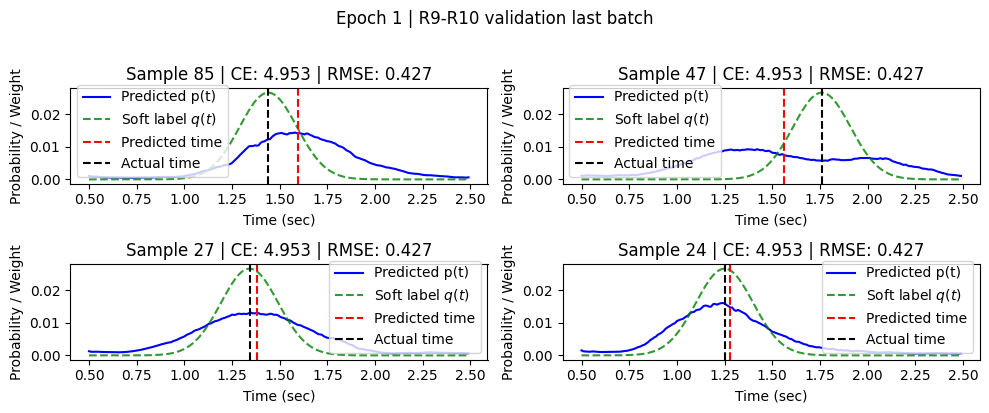

New best validation NRMSE: 977.395222 at epoch 1
Epoch 2/120: 

Epoch 2 [147/147] Loss 6.2290 CE 5.0187 RMSE 0.4034 KL 0.0000 WASS 0.0000 NRMSE 0.9642 Entropy 4.944: 100%|██████████| 147/147 [00:11<00:00, 12.71it/s]


NRMSE: 0.9642 Total loss: 911.7093 Total CE: 738.8019 Total RMSE: 57.6358 Total KL: 0.0000 Total WASS: 0.0000


Val [70/70] Loss 5.3339 CE 4.9101 RMSE 0.4238 NRMSE 0.9574: 100%|██████████| 70/70 [00:03<00:00, 21.25it/s]


Val NRMSE: 957.439, Val Loss: 5.322422, Val CE: 4.936629, Val RMSE: 0.385793
mean bias (s): 0.09757736325263977


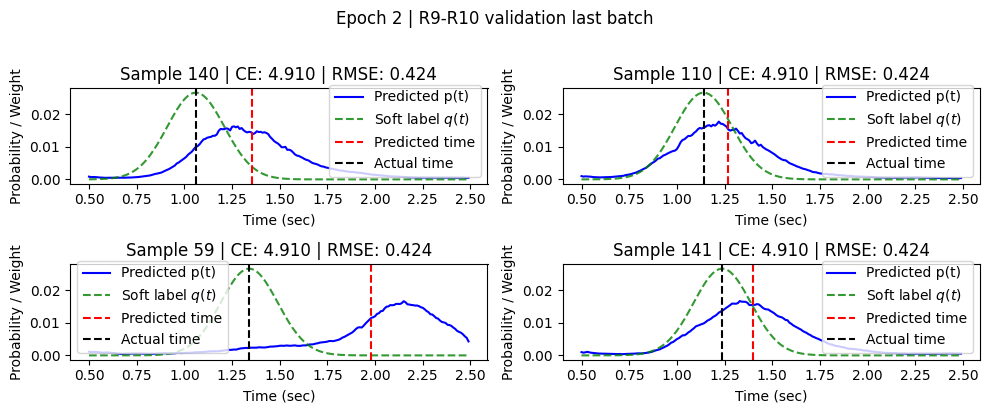

New best validation NRMSE: 957.439331 at epoch 2
Epoch 3/120: 

Epoch 3 [147/147] Loss 6.2481 CE 5.0360 RMSE 0.4041 KL 0.0000 WASS 0.0000 NRMSE 0.9571 Entropy 5.040: 100%|██████████| 147/147 [00:11<00:00, 12.70it/s]


NRMSE: 0.9571 Total loss: 907.6567 Total CE: 736.4857 Total RMSE: 57.0570 Total KL: 0.0000 Total WASS: 0.0000


Val [70/70] Loss 5.3300 CE 4.9065 RMSE 0.4234 NRMSE 0.9528: 100%|██████████| 70/70 [00:03<00:00, 21.43it/s]


Val NRMSE: 952.820, Val Loss: 5.311943, Val CE: 4.927728, Val RMSE: 0.384215
mean bias (s): 0.09835445880889893


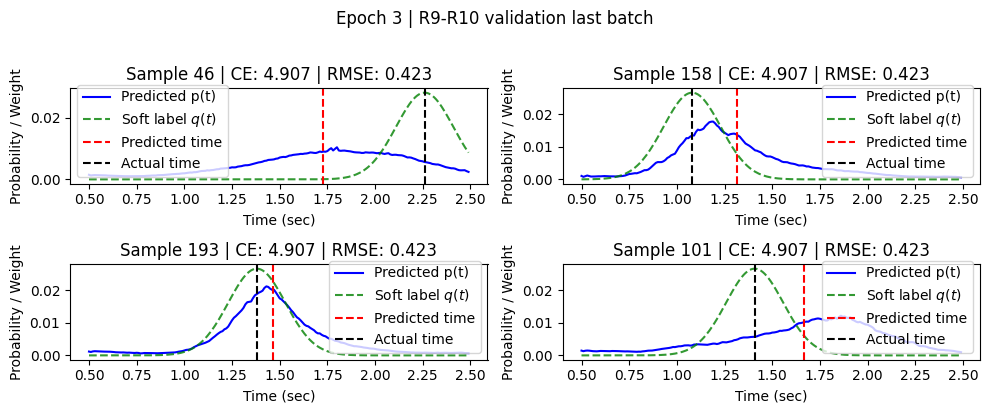

New best validation NRMSE: 952.820159 at epoch 3
Epoch 4/120: 

Epoch 4 [147/147] Loss 6.2344 CE 5.0198 RMSE 0.4049 KL 0.0000 WASS 0.0000 NRMSE 0.9511 Entropy 5.057: 100%|██████████| 147/147 [00:11<00:00, 12.73it/s]


NRMSE: 0.9511 Total loss: 905.2791 Total CE: 734.9468 Total RMSE: 56.7775 Total KL: 0.0000 Total WASS: 0.0000


Val [70/70] Loss 5.3327 CE 4.9101 RMSE 0.4226 NRMSE 0.9519: 100%|██████████| 70/70 [00:03<00:00, 21.38it/s]


Val NRMSE: 951.891, Val Loss: 5.306406, Val CE: 4.922627, Val RMSE: 0.383779
mean bias (s): 0.09804752469062805


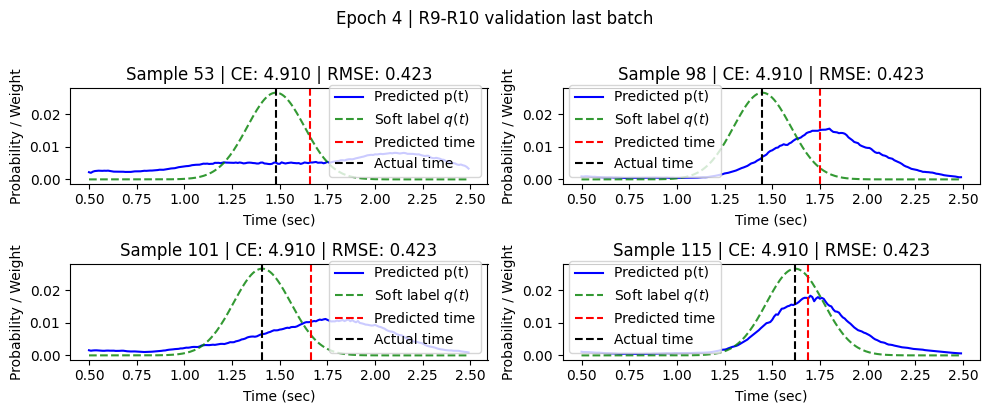

New best validation NRMSE: 951.891047 at epoch 4
Epoch 5/120: 

Epoch 5 [147/147] Loss 6.1643 CE 5.0073 RMSE 0.3857 KL 0.0000 WASS 0.0000 NRMSE 0.9475 Entropy 4.996: 100%|██████████| 147/147 [00:11<00:00, 12.69it/s]


NRMSE: 0.9475 Total loss: 903.1650 Total CE: 733.5753 Total RMSE: 56.5299 Total KL: 0.0000 Total WASS: 0.0000


Val [70/70] Loss 5.2768 CE 4.8690 RMSE 0.4079 NRMSE 0.9546: 100%|██████████| 70/70 [00:03<00:00, 21.13it/s]


Val NRMSE: 954.621, Val Loss: 5.305918, Val CE: 4.920731, Val RMSE: 0.385188
mean bias (s): 0.06358927488327026


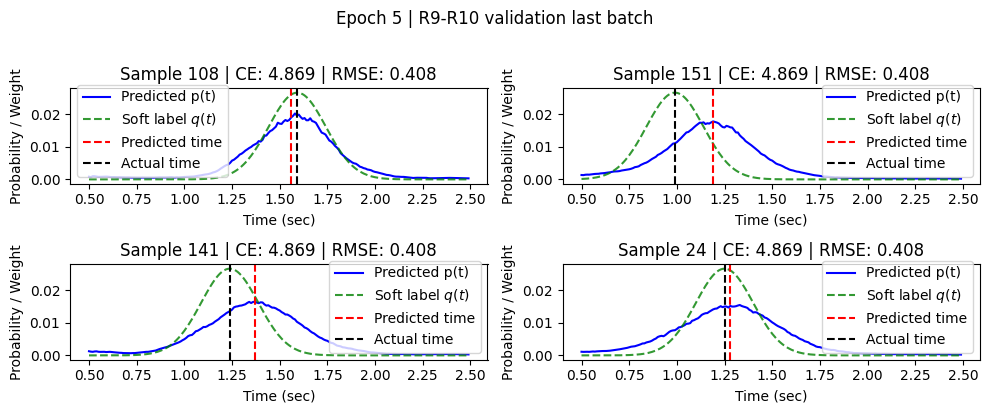

Epoch 6/120: 

Epoch 6 [147/147] Loss 6.1958 CE 5.0064 RMSE 0.3965 KL 0.0000 WASS 0.0000 NRMSE 0.9428 Entropy 5.000: 100%|██████████| 147/147 [00:11<00:00, 12.55it/s]


NRMSE: 0.9428 Total loss: 900.9899 Total CE: 732.3272 Total RMSE: 56.2209 Total KL: 0.0000 Total WASS: 0.0000


Val [70/70] Loss 5.2625 CE 4.8523 RMSE 0.4102 NRMSE 0.9465: 100%|██████████| 70/70 [00:03<00:00, 21.12it/s]


Val NRMSE: 946.452, Val Loss: 5.287313, Val CE: 4.906022, Val RMSE: 0.381291
mean bias (s): 0.08081016689538956


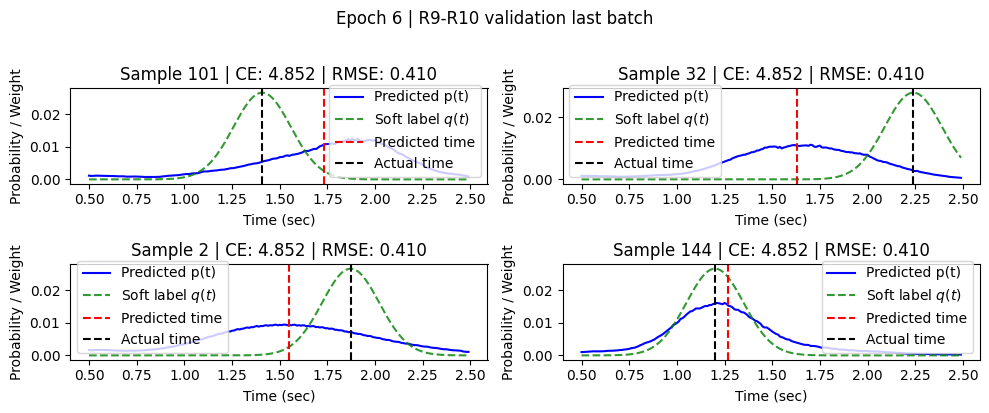

New best validation NRMSE: 946.452477 at epoch 6
Epoch 7/120: 

Epoch 7 [147/147] Loss 6.1505 CE 4.9848 RMSE 0.3886 KL 0.0000 WASS 0.0000 NRMSE 0.9411 Entropy 4.940: 100%|██████████| 147/147 [00:11<00:00, 12.56it/s]


NRMSE: 0.9411 Total loss: 900.5850 Total CE: 731.9740 Total RMSE: 56.2037 Total KL: 0.0000 Total WASS: 0.0000


Val [70/70] Loss 5.2650 CE 4.8511 RMSE 0.4140 NRMSE 0.9404: 100%|██████████| 70/70 [00:03<00:00, 21.35it/s]


Val NRMSE: 940.368, Val Loss: 5.262222, Val CE: 4.884622, Val RMSE: 0.377599
mean bias (s): 0.11194847524166107


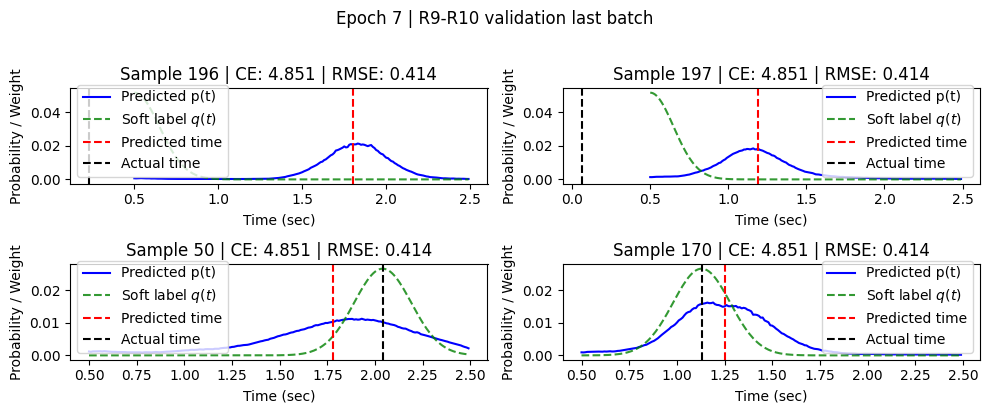

New best validation NRMSE: 940.367915 at epoch 7
Epoch 8/120: 

Epoch 8 [147/147] Loss 6.0979 CE 4.9753 RMSE 0.3742 KL 0.0000 WASS 0.0000 NRMSE 0.9389 Entropy 4.990: 100%|██████████| 147/147 [00:11<00:00, 12.68it/s]


NRMSE: 0.9389 Total loss: 899.6980 Total CE: 731.5153 Total RMSE: 56.0609 Total KL: 0.0000 Total WASS: 0.0000


Val [70/70] Loss 5.3171 CE 4.8928 RMSE 0.4243 NRMSE 0.9424: 100%|██████████| 70/70 [00:03<00:00, 21.31it/s]


Val NRMSE: 942.442, Val Loss: 5.273681, Val CE: 4.894996, Val RMSE: 0.378685
mean bias (s): 0.10483892261981964


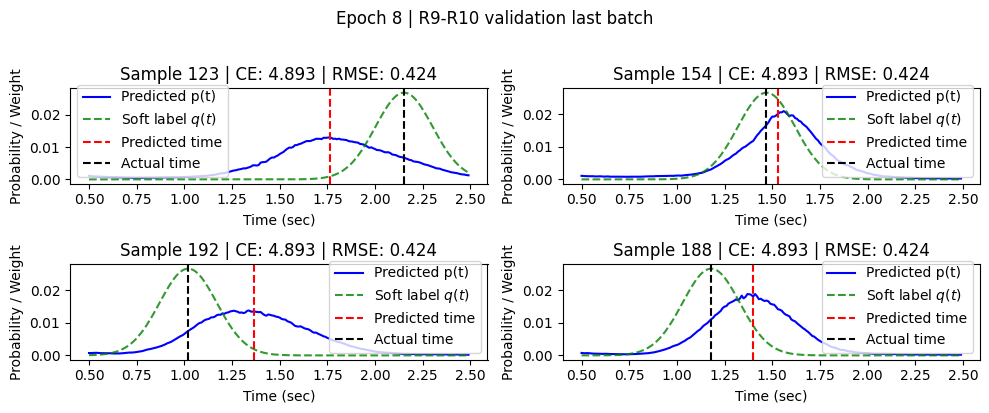

Epoch 9/120: 

Epoch 9 [147/147] Loss 6.0831 CE 4.9424 RMSE 0.3802 KL 0.0000 WASS 0.0000 NRMSE 0.9349 Entropy 5.008: 100%|██████████| 147/147 [00:11<00:00, 12.67it/s]


NRMSE: 0.9349 Total loss: 898.0141 Total CE: 730.6328 Total RMSE: 55.7938 Total KL: 0.0000 Total WASS: 0.0000


Val [70/70] Loss 5.2717 CE 4.8554 RMSE 0.4163 NRMSE 0.9388: 100%|██████████| 70/70 [00:03<00:00, 21.41it/s]


Val NRMSE: 938.769, Val Loss: 5.264894, Val CE: 4.887097, Val RMSE: 0.377797
mean bias (s): 0.0797019898891449


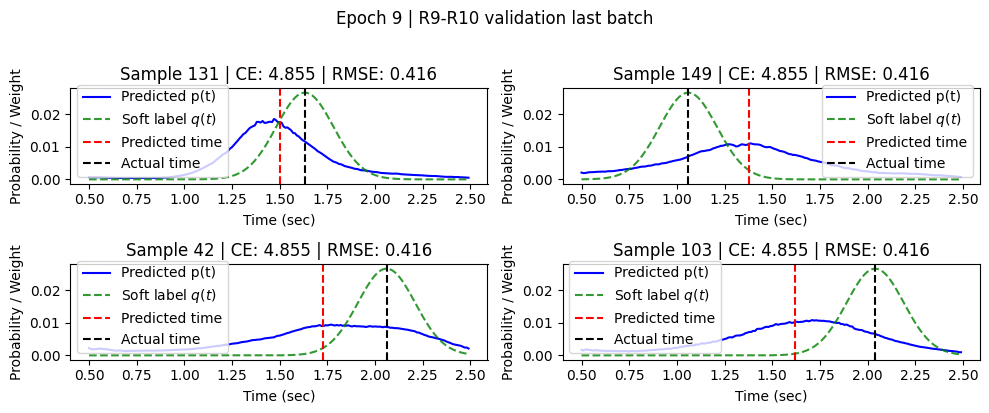

New best validation NRMSE: 938.769302 at epoch 9
Epoch 10/120: 

Epoch 10 [147/147] Loss 6.1564 CE 5.0032 RMSE 0.3844 KL 0.0000 WASS 0.0000 NRMSE 0.9326 Entropy 4.961: 100%|██████████| 147/147 [00:11<00:00, 12.60it/s]


NRMSE: 0.9326 Total loss: 896.4715 Total CE: 729.6125 Total RMSE: 55.6197 Total KL: 0.0000 Total WASS: 0.0000


Val [70/70] Loss 5.2377 CE 4.8292 RMSE 0.4084 NRMSE 0.9460: 100%|██████████| 70/70 [00:03<00:00, 21.17it/s]


Val NRMSE: 945.981, Val Loss: 5.275111, Val CE: 4.893851, Val RMSE: 0.381259
mean bias (s): 0.06615007668733597


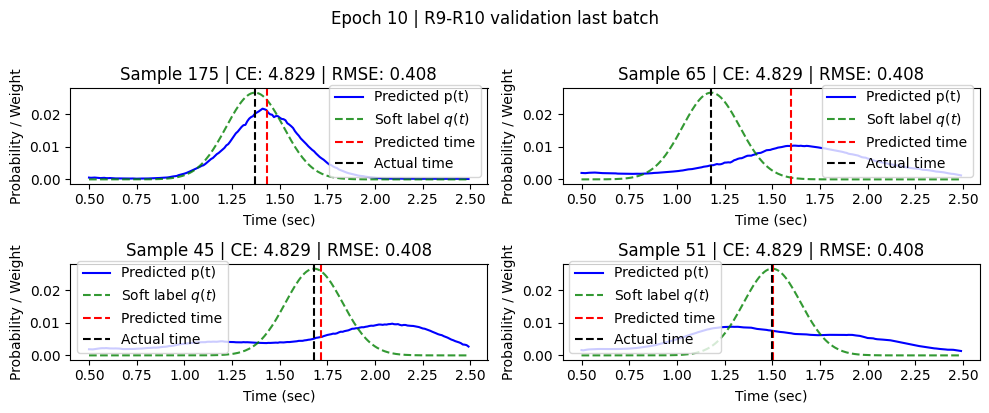

Epoch 11/120: 

Epoch 11 [147/147] Loss 6.1230 CE 4.9714 RMSE 0.3839 KL 0.0000 WASS 0.0000 NRMSE 0.9290 Entropy 4.952: 100%|██████████| 147/147 [00:11<00:00, 12.51it/s]


NRMSE: 0.9290 Total loss: 895.1083 Total CE: 728.7557 Total RMSE: 55.4509 Total KL: 0.0000 Total WASS: 0.0000


Val [70/70] Loss 5.2208 CE 4.8157 RMSE 0.4050 NRMSE 0.9425: 100%|██████████| 70/70 [00:03<00:00, 20.99it/s]


Val NRMSE: 942.450, Val Loss: 5.261317, Val CE: 4.882019, Val RMSE: 0.379298
mean bias (s): 0.07462367415428162


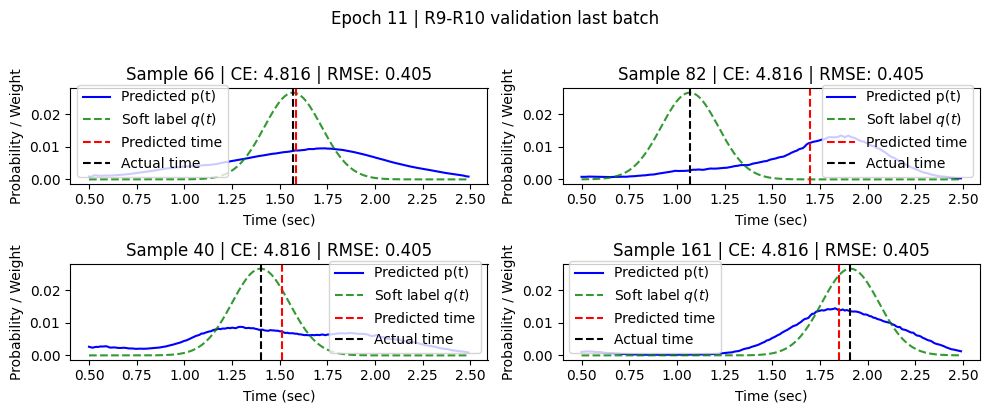

Epoch 12/120: 

Epoch 12 [147/147] Loss 6.1698 CE 4.9647 RMSE 0.4017 KL 0.0000 WASS 0.0000 NRMSE 0.9295 Entropy 5.005: 100%|██████████| 147/147 [00:11<00:00, 12.31it/s]


NRMSE: 0.9295 Total loss: 895.3808 Total CE: 728.8697 Total RMSE: 55.5037 Total KL: 0.0000 Total WASS: 0.0000


Val [70/70] Loss 5.2354 CE 4.8248 RMSE 0.4106 NRMSE 0.9387: 100%|██████████| 70/70 [00:03<00:00, 21.20it/s]


Val NRMSE: 938.690, Val Loss: 5.259074, Val CE: 4.881208, Val RMSE: 0.377866
mean bias (s): 0.07329326122999191


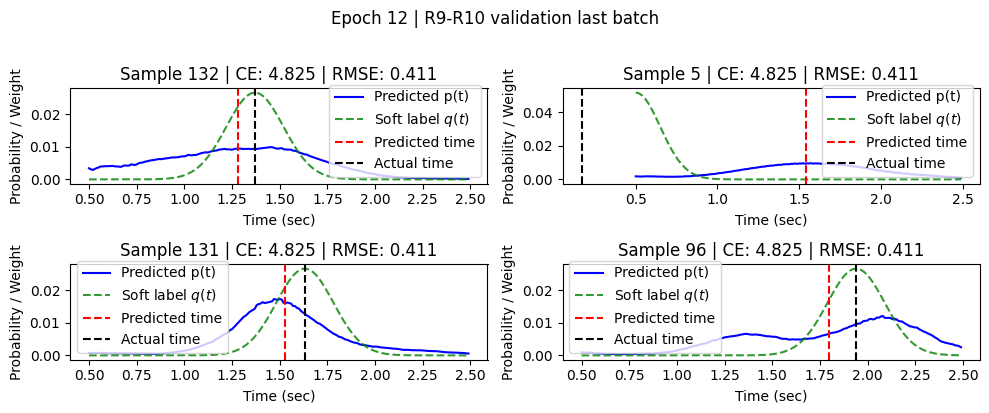

New best validation NRMSE: 938.690304 at epoch 12
Epoch 13/120: 

Epoch 13 [147/147] Loss 5.9240 CE 4.8929 RMSE 0.3437 KL 0.0000 WASS 0.0000 NRMSE 0.9246 Entropy 4.989: 100%|██████████| 147/147 [00:11<00:00, 12.56it/s]


NRMSE: 0.9246 Total loss: 893.4219 Total CE: 727.8608 Total RMSE: 55.1870 Total KL: 0.0000 Total WASS: 0.0000


Val [70/70] Loss 5.2077 CE 4.8048 RMSE 0.4029 NRMSE 0.9406: 100%|██████████| 70/70 [00:03<00:00, 21.00it/s]


Val NRMSE: 940.595, Val Loss: 5.259692, Val CE: 4.880868, Val RMSE: 0.378824
mean bias (s): 0.06359003484249115


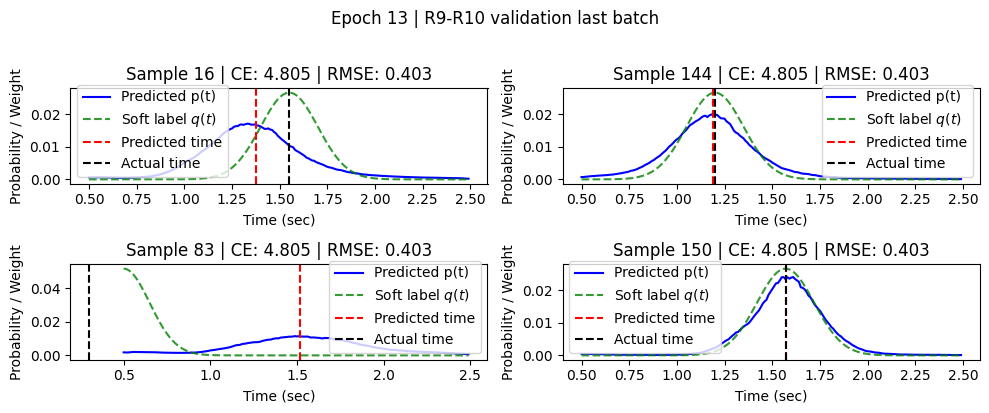

Epoch 14/120: 

Epoch 14 [147/147] Loss 6.0903 CE 4.9645 RMSE 0.3753 KL 0.0000 WASS 0.0000 NRMSE 0.9237 Entropy 4.931: 100%|██████████| 147/147 [00:11<00:00, 12.64it/s]


NRMSE: 0.9237 Total loss: 893.1481 Total CE: 727.8301 Total RMSE: 55.1060 Total KL: 0.0000 Total WASS: 0.0000


Val [70/70] Loss 5.2487 CE 4.8368 RMSE 0.4119 NRMSE 0.9427: 100%|██████████| 70/70 [00:03<00:00, 21.35it/s]


Val NRMSE: 942.666, Val Loss: 5.262354, Val CE: 4.883218, Val RMSE: 0.379136
mean bias (s): 0.0752289891242981


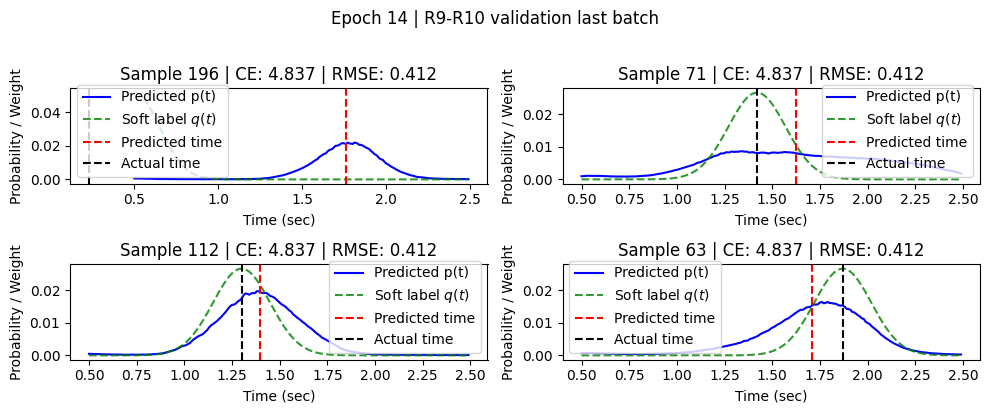

Epoch 15/120: 

Epoch 15 [147/147] Loss 6.0221 CE 4.9431 RMSE 0.3597 KL 0.0000 WASS 0.0000 NRMSE 0.9220 Entropy 4.948: 100%|██████████| 147/147 [00:11<00:00, 12.68it/s]


NRMSE: 0.9220 Total loss: 892.4442 Total CE: 727.3848 Total RMSE: 55.0198 Total KL: 0.0000 Total WASS: 0.0000


Val [70/70] Loss 5.1730 CE 4.7759 RMSE 0.3970 NRMSE 0.9390: 100%|██████████| 70/70 [00:03<00:00, 21.16it/s]


Val NRMSE: 939.015, Val Loss: 5.252881, Val CE: 4.875254, Val RMSE: 0.377627
mean bias (s): 0.06484799087047577


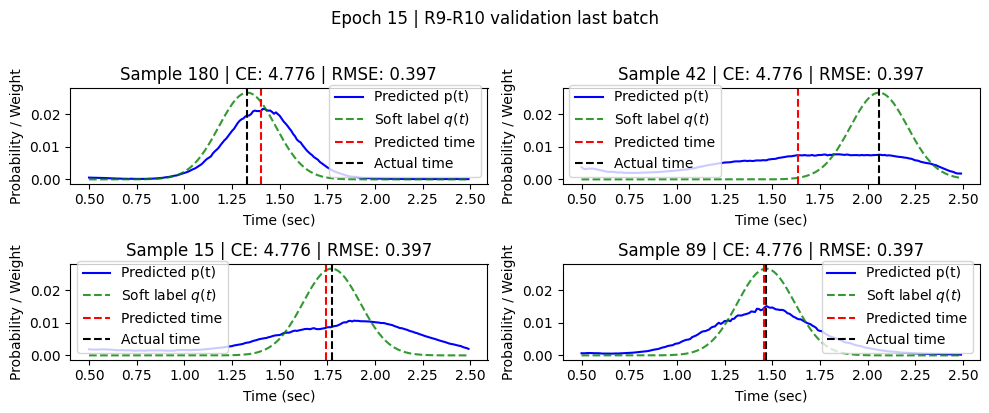

Epoch 16/120: 

Epoch 16 [147/147] Loss 5.9802 CE 4.9310 RMSE 0.3497 KL 0.0000 WASS 0.0000 NRMSE 0.9164 Entropy 4.887: 100%|██████████| 147/147 [00:11<00:00, 12.49it/s]


NRMSE: 0.9164 Total loss: 890.8492 Total CE: 726.5650 Total RMSE: 54.7614 Total KL: 0.0000 Total WASS: 0.0000


Val [70/70] Loss 5.2355 CE 4.8298 RMSE 0.4057 NRMSE 0.9412: 100%|██████████| 70/70 [00:03<00:00, 21.14it/s]


Val NRMSE: 941.150, Val Loss: 5.255695, Val CE: 4.878308, Val RMSE: 0.377387
mean bias (s): 0.09819827973842621


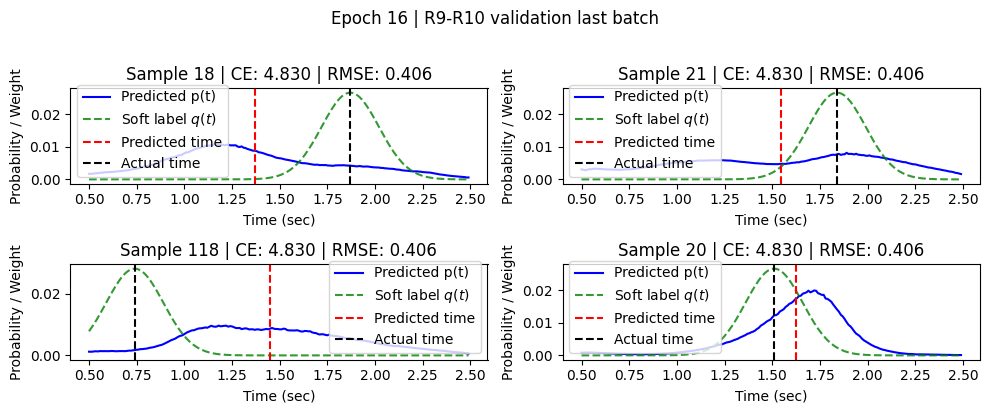

Epoch 17/120: 

Epoch 17 [147/147] Loss 6.0305 CE 4.8948 RMSE 0.3785 KL 0.0000 WASS 0.0000 NRMSE 0.9201 Entropy 4.987: 100%|██████████| 147/147 [00:11<00:00, 12.66it/s]


NRMSE: 0.9201 Total loss: 891.0697 Total CE: 726.4460 Total RMSE: 54.8746 Total KL: 0.0000 Total WASS: 0.0000


Val [70/70] Loss 5.2304 CE 4.8232 RMSE 0.4072 NRMSE 0.9429: 100%|██████████| 70/70 [00:03<00:00, 21.08it/s]


Val NRMSE: 942.933, Val Loss: 5.265242, Val CE: 4.885068, Val RMSE: 0.380173
mean bias (s): 0.05590756610035896


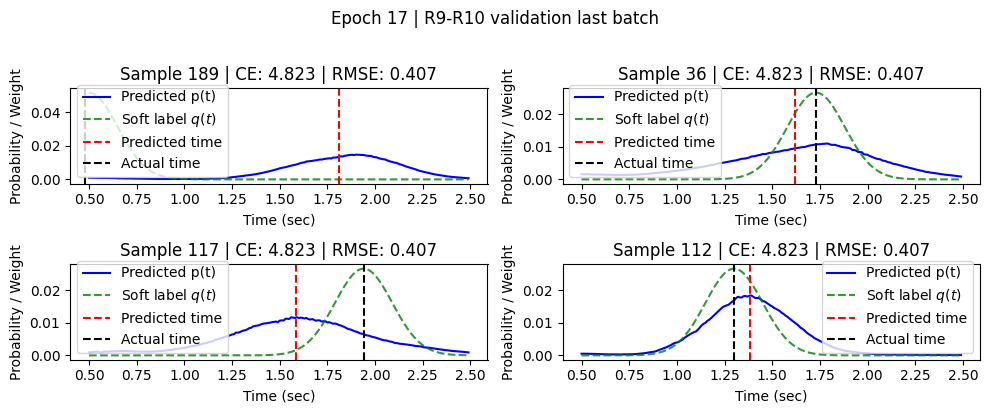

Epoch 18/120: 

Epoch 18 [147/147] Loss 6.1050 CE 4.9372 RMSE 0.3893 KL 0.0000 WASS 0.0000 NRMSE 0.9152 Entropy 4.914: 100%|██████████| 147/147 [00:11<00:00, 12.62it/s]


NRMSE: 0.9152 Total loss: 890.1281 Total CE: 726.0095 Total RMSE: 54.7062 Total KL: 0.0000 Total WASS: 0.0000


Val [70/70] Loss 5.2037 CE 4.7989 RMSE 0.4048 NRMSE 0.9327: 100%|██████████| 70/70 [00:03<00:00, 21.26it/s]


Val NRMSE: 932.733, Val Loss: 5.236575, Val CE: 4.861963, Val RMSE: 0.374612
mean bias (s): 0.07701441645622253


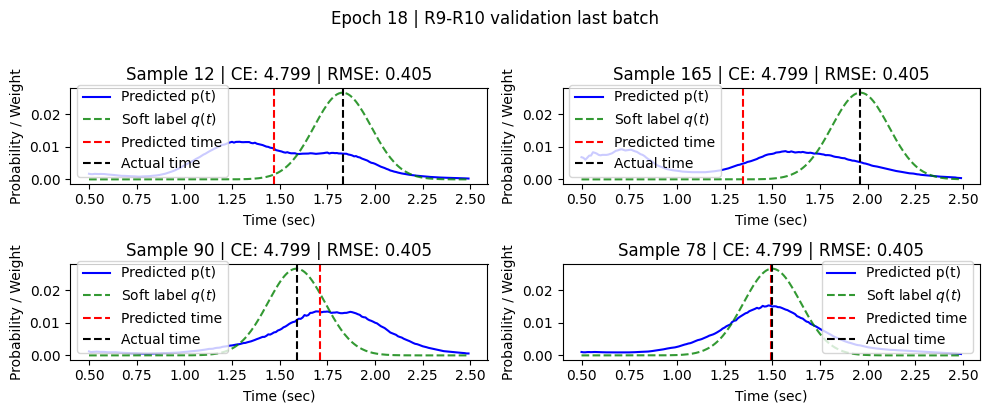

New best validation NRMSE: 932.733470 at epoch 18
Epoch 19/120: 

Epoch 19 [147/147] Loss 6.1392 CE 4.9683 RMSE 0.3903 KL 0.0000 WASS 0.0000 NRMSE 0.9163 Entropy 4.930: 100%|██████████| 147/147 [00:11<00:00, 12.45it/s]


NRMSE: 0.9163 Total loss: 889.9053 Total CE: 726.0160 Total RMSE: 54.6298 Total KL: 0.0000 Total WASS: 0.0000


Val [70/70] Loss 5.2286 CE 4.8193 RMSE 0.4093 NRMSE 0.9525: 100%|██████████| 70/70 [00:03<00:00, 21.18it/s]


Val NRMSE: 952.497, Val Loss: 5.275559, Val CE: 4.891238, Val RMSE: 0.384320
mean bias (s): 0.05572303757071495


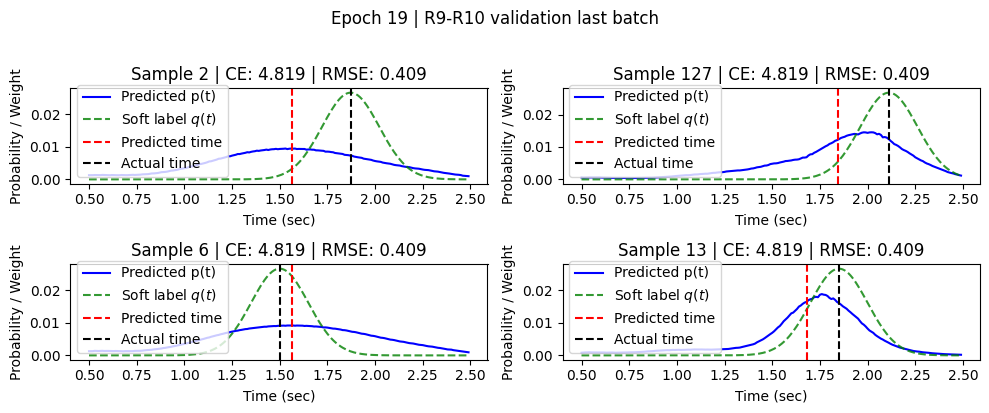

Epoch 20/120: 

Epoch 20 [147/147] Loss 5.8964 CE 4.8647 RMSE 0.3439 KL 0.0000 WASS 0.0000 NRMSE 0.9119 Entropy 4.956: 100%|██████████| 147/147 [00:11<00:00, 12.48it/s]


NRMSE: 0.9119 Total loss: 888.4247 Total CE: 725.2311 Total RMSE: 54.3979 Total KL: 0.0000 Total WASS: 0.0000


Val [70/70] Loss 5.2304 CE 4.8192 RMSE 0.4112 NRMSE 0.9456: 100%|██████████| 70/70 [00:03<00:00, 21.23it/s]


Val NRMSE: 945.618, Val Loss: 5.254581, Val CE: 4.874109, Val RMSE: 0.380471
mean bias (s): 0.06531450897455215


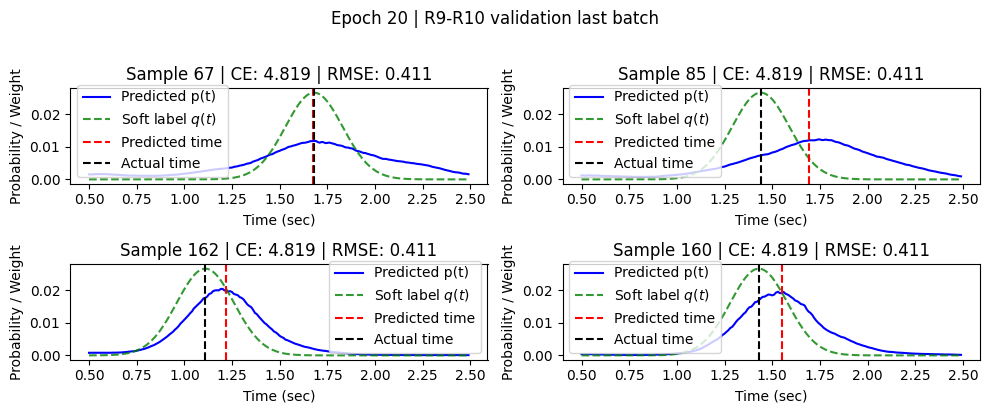

Epoch 21/120: 

Epoch 21 [147/147] Loss 6.1037 CE 4.9552 RMSE 0.3828 KL 0.0000 WASS 0.0000 NRMSE 0.9115 Entropy 4.918: 100%|██████████| 147/147 [00:11<00:00, 12.56it/s]


NRMSE: 0.9115 Total loss: 888.2796 Total CE: 725.2543 Total RMSE: 54.3418 Total KL: 0.0000 Total WASS: 0.0000


Val [70/70] Loss 5.1987 CE 4.7950 RMSE 0.4037 NRMSE 0.9342: 100%|██████████| 70/70 [00:03<00:00, 21.21it/s]


Val NRMSE: 934.227, Val Loss: 5.237213, Val CE: 4.862028, Val RMSE: 0.375185
mean bias (s): 0.09177003055810928


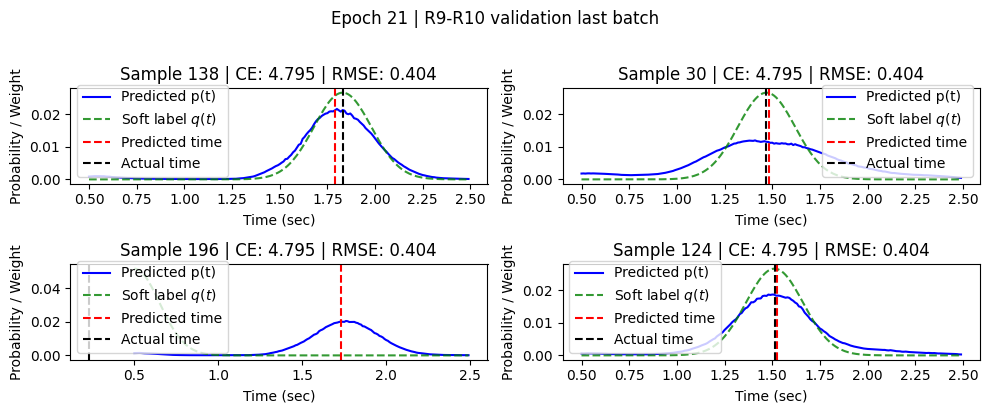

Epoch 22/120: 

Epoch 22 [147/147] Loss 6.0187 CE 4.9161 RMSE 0.3675 KL 0.0000 WASS 0.0000 NRMSE 0.9106 Entropy 4.926: 100%|██████████| 147/147 [00:11<00:00, 12.53it/s]


NRMSE: 0.9106 Total loss: 888.0711 Total CE: 725.0097 Total RMSE: 54.3538 Total KL: 0.0000 Total WASS: 0.0000


Val [70/70] Loss 5.2003 CE 4.8009 RMSE 0.3994 NRMSE 0.9305: 100%|██████████| 70/70 [00:03<00:00, 21.07it/s]


Val NRMSE: 930.483, Val Loss: 5.233626, Val CE: 4.860105, Val RMSE: 0.373521
mean bias (s): 0.07751689851284027


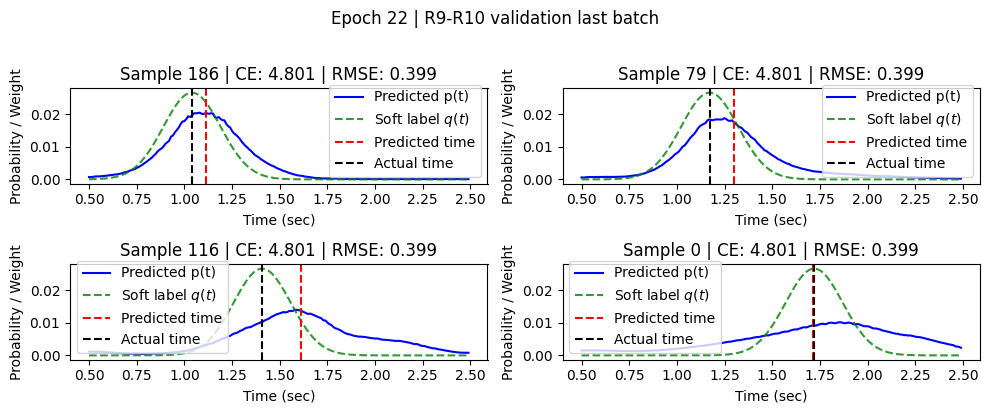

New best validation NRMSE: 930.483176 at epoch 22
Epoch 23/120: 

Epoch 23 [147/147] Loss 6.1174 CE 4.9541 RMSE 0.3878 KL 0.0000 WASS 0.0000 NRMSE 0.9094 Entropy 4.946: 100%|██████████| 147/147 [00:11<00:00, 12.53it/s]


NRMSE: 0.9094 Total loss: 887.4420 Total CE: 724.8045 Total RMSE: 54.2125 Total KL: 0.0000 Total WASS: 0.0000


Val [70/70] Loss 5.2026 CE 4.7962 RMSE 0.4064 NRMSE 0.9294: 100%|██████████| 70/70 [00:03<00:00, 21.33it/s]


Val NRMSE: 929.449, Val Loss: 5.232632, Val CE: 4.859544, Val RMSE: 0.373088
mean bias (s): 0.0829322338104248


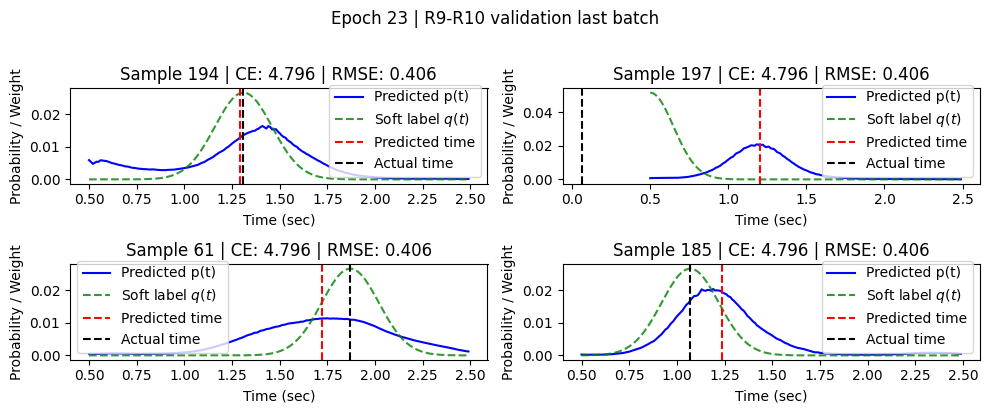

New best validation NRMSE: 929.449144 at epoch 23
Epoch 24/120: 

Epoch 24 [147/147] Loss 6.1165 CE 4.9385 RMSE 0.3927 KL 0.0000 WASS 0.0000 NRMSE 0.9101 Entropy 4.931: 100%|██████████| 147/147 [00:11<00:00, 12.47it/s]


NRMSE: 0.9101 Total loss: 887.6819 Total CE: 724.7881 Total RMSE: 54.2980 Total KL: 0.0000 Total WASS: 0.0000


Val [70/70] Loss 5.2356 CE 4.8213 RMSE 0.4143 NRMSE 0.9317: 100%|██████████| 70/70 [00:03<00:00, 20.88it/s]


Val NRMSE: 931.652, Val Loss: 5.231839, Val CE: 4.857735, Val RMSE: 0.374104
mean bias (s): 0.09551595151424408


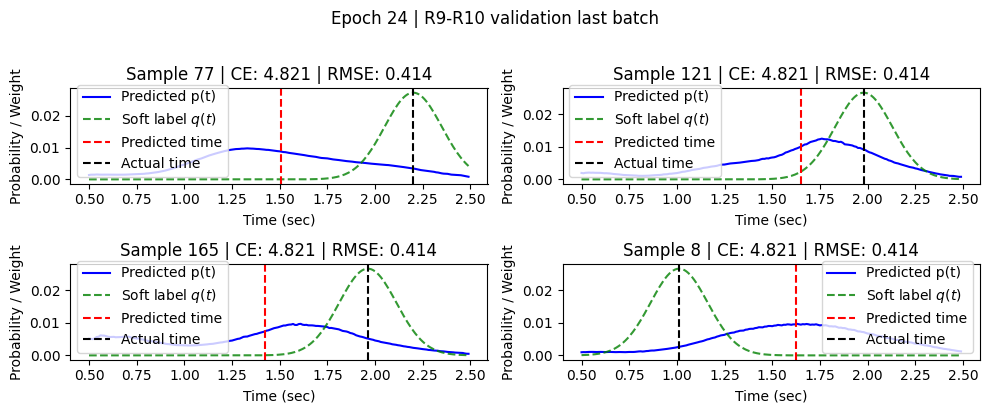

Epoch 25/120: 

Epoch 25 [147/147] Loss 5.8903 CE 4.8917 RMSE 0.3329 KL 0.0000 WASS 0.0000 NRMSE 0.9085 Entropy 4.887: 100%|██████████| 147/147 [00:11<00:00, 12.55it/s]


NRMSE: 0.9085 Total loss: 886.9687 Total CE: 724.6925 Total RMSE: 54.0920 Total KL: 0.0000 Total WASS: 0.0000


Val [70/70] Loss 5.1966 CE 4.7940 RMSE 0.4027 NRMSE 0.9394: 100%|██████████| 70/70 [00:03<00:00, 21.04it/s]


Val NRMSE: 939.440, Val Loss: 5.245942, Val CE: 4.868528, Val RMSE: 0.377414
mean bias (s): 0.07861977070569992


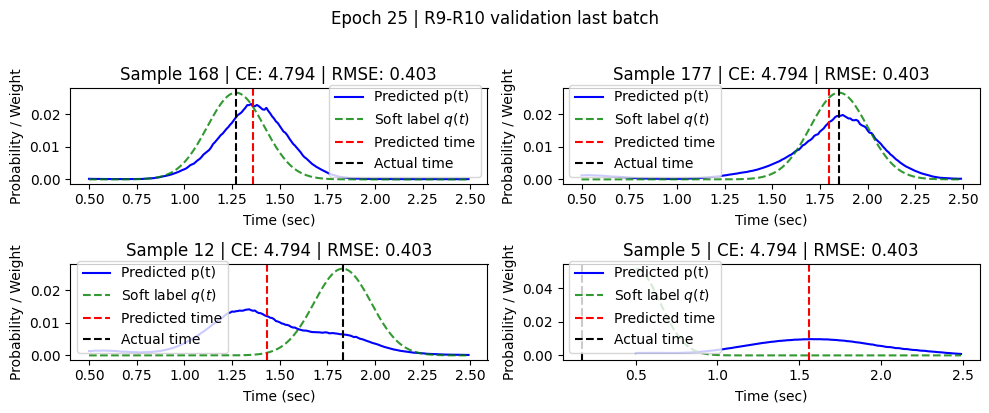

Epoch 26/120: 

Epoch 26 [147/147] Loss 5.9494 CE 4.9045 RMSE 0.3483 KL 0.0000 WASS 0.0000 NRMSE 0.9086 Entropy 4.895: 100%|██████████| 147/147 [00:11<00:00, 12.47it/s]


NRMSE: 0.9086 Total loss: 886.8264 Total CE: 724.2716 Total RMSE: 54.1849 Total KL: 0.0000 Total WASS: 0.0000


Val [70/70] Loss 5.1919 CE 4.7885 RMSE 0.4034 NRMSE 0.9345: 100%|██████████| 70/70 [00:03<00:00, 21.09it/s]


Val NRMSE: 934.512, Val Loss: 5.242961, Val CE: 4.867163, Val RMSE: 0.375798
mean bias (s): 0.07777302712202072


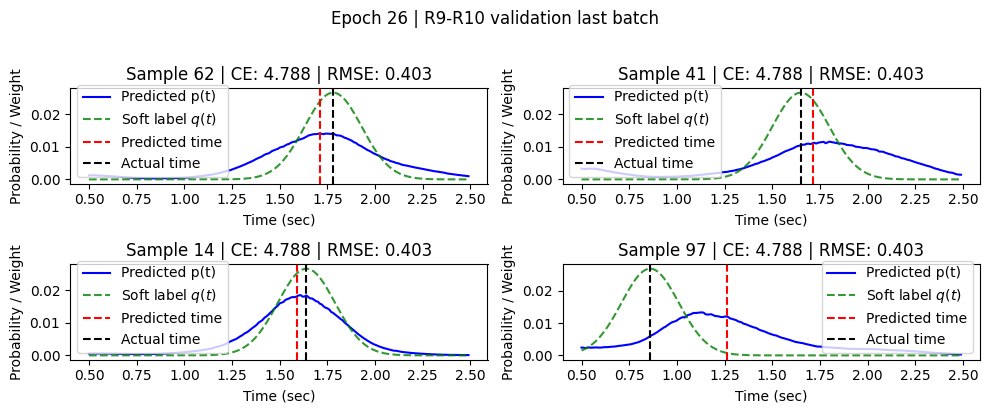

Epoch 27/120: 

Epoch 27 [147/147] Loss 6.0376 CE 4.9376 RMSE 0.3667 KL 0.0000 WASS 0.0000 NRMSE 0.9023 Entropy 4.900: 100%|██████████| 147/147 [00:11<00:00, 12.54it/s]


NRMSE: 0.9023 Total loss: 885.5899 Total CE: 723.9676 Total RMSE: 53.8741 Total KL: 0.0000 Total WASS: 0.0000


Val [70/70] Loss 5.2006 CE 4.7959 RMSE 0.4047 NRMSE 0.9393: 100%|██████████| 70/70 [00:03<00:00, 21.22it/s]


Val NRMSE: 939.294, Val Loss: 5.251184, Val CE: 4.874295, Val RMSE: 0.376889
mean bias (s): 0.08786946535110474


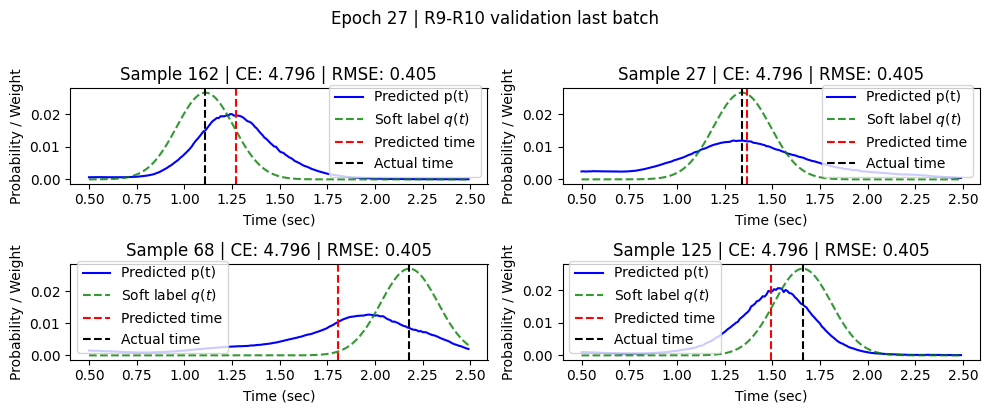

Epoch 28/120: 

Epoch 28 [147/147] Loss 5.9694 CE 4.9051 RMSE 0.3548 KL 0.0000 WASS 0.0000 NRMSE 0.9046 Entropy 4.939: 100%|██████████| 147/147 [00:11<00:00, 12.53it/s]


NRMSE: 0.9046 Total loss: 885.6599 Total CE: 723.7512 Total RMSE: 53.9696 Total KL: 0.0000 Total WASS: 0.0000


Val [70/70] Loss 5.1761 CE 4.7760 RMSE 0.4001 NRMSE 0.9480: 100%|██████████| 70/70 [00:03<00:00, 21.10it/s]


Val NRMSE: 947.972, Val Loss: 5.268212, Val CE: 4.885752, Val RMSE: 0.382460
mean bias (s): 0.04439769312739372


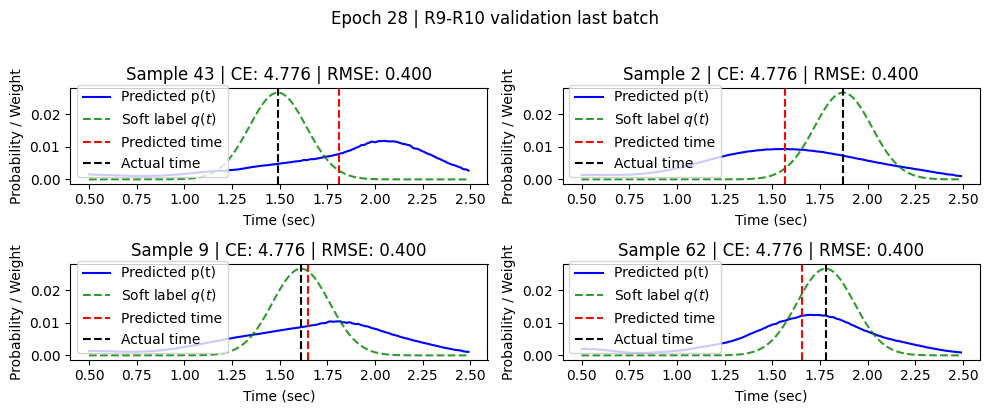

Epoch 29/120: 

Epoch 29 [147/147] Loss 6.0637 CE 4.9289 RMSE 0.3783 KL 0.0000 WASS 0.0000 NRMSE 0.8999 Entropy 4.915: 100%|██████████| 147/147 [00:11<00:00, 12.51it/s]


NRMSE: 0.8999 Total loss: 884.4184 Total CE: 723.2720 Total RMSE: 53.7155 Total KL: 0.0000 Total WASS: 0.0000


Val [70/70] Loss 5.2225 CE 4.8082 RMSE 0.4142 NRMSE 0.9535: 100%|██████████| 70/70 [00:03<00:00, 20.96it/s]


Val NRMSE: 953.522, Val Loss: 5.266990, Val CE: 4.882440, Val RMSE: 0.384550
mean bias (s): 0.060650039464235306


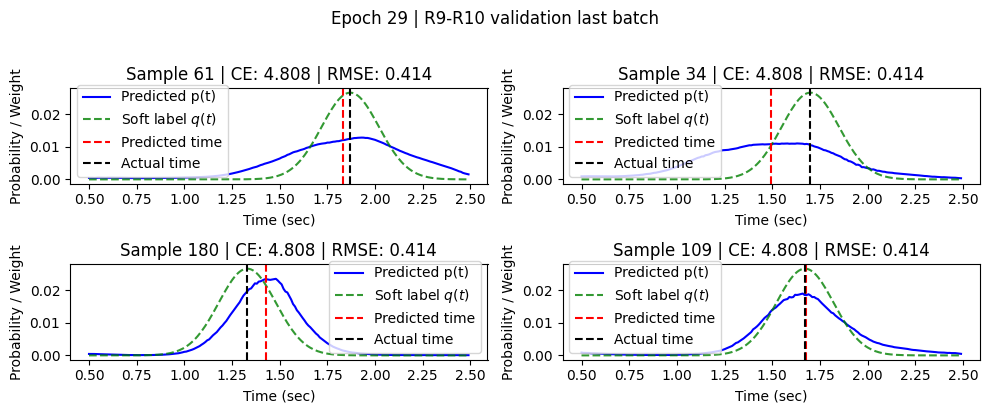

Epoch 30/120: 

Epoch 30 [147/147] Loss 6.0282 CE 4.9510 RMSE 0.3591 KL 0.0000 WASS 0.0000 NRMSE 0.9002 Entropy 4.968: 100%|██████████| 147/147 [00:11<00:00, 12.74it/s]


NRMSE: 0.9002 Total loss: 884.4108 Total CE: 723.2873 Total RMSE: 53.7078 Total KL: 0.0000 Total WASS: 0.0000


Val [70/70] Loss 5.1993 CE 4.7933 RMSE 0.4060 NRMSE 0.9512: 100%|██████████| 70/70 [00:03<00:00, 21.11it/s]


Val NRMSE: 951.196, Val Loss: 5.268314, Val CE: 4.884654, Val RMSE: 0.383660
mean bias (s): 0.0507713183760643


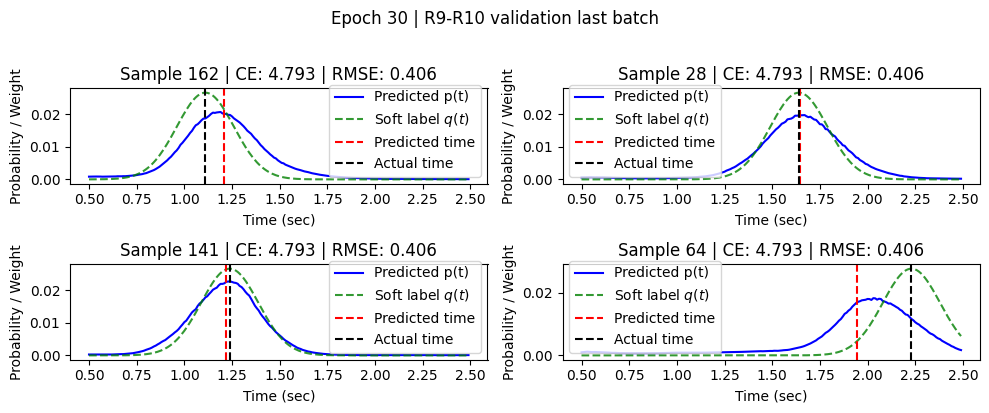

Epoch 31/120: 

Epoch 31 [147/147] Loss 6.1345 CE 4.9695 RMSE 0.3883 KL 0.0000 WASS 0.0000 NRMSE 0.8988 Entropy 4.943: 100%|██████████| 147/147 [00:11<00:00, 12.56it/s]


NRMSE: 0.8988 Total loss: 883.5546 Total CE: 722.7009 Total RMSE: 53.6179 Total KL: 0.0000 Total WASS: 0.0000


Val [70/70] Loss 5.2114 CE 4.8013 RMSE 0.4101 NRMSE 0.9348: 100%|██████████| 70/70 [00:03<00:00, 20.80it/s]


Val NRMSE: 934.819, Val Loss: 5.237680, Val CE: 4.862031, Val RMSE: 0.375649
mean bias (s): 0.09241386502981186


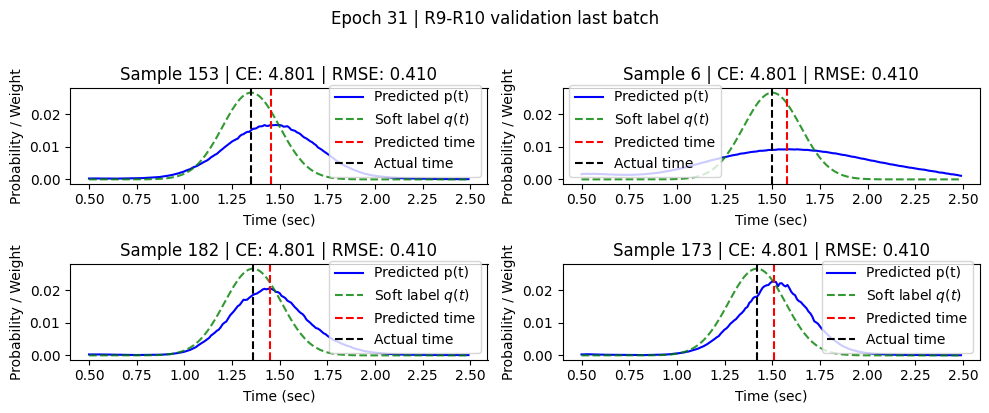

Epoch 32/120: 

Epoch 32 [147/147] Loss 6.0705 CE 4.9349 RMSE 0.3785 KL 0.0000 WASS 0.0000 NRMSE 0.8969 Entropy 4.881: 100%|██████████| 147/147 [00:11<00:00, 12.63it/s]


NRMSE: 0.8969 Total loss: 883.4523 Total CE: 722.7080 Total RMSE: 53.5814 Total KL: 0.0000 Total WASS: 0.0000


Val [70/70] Loss 5.1989 CE 4.7942 RMSE 0.4047 NRMSE 0.9355: 100%|██████████| 70/70 [00:03<00:00, 21.10it/s]


Val NRMSE: 935.531, Val Loss: 5.237859, Val CE: 4.862993, Val RMSE: 0.374866
mean bias (s): 0.09510072320699692


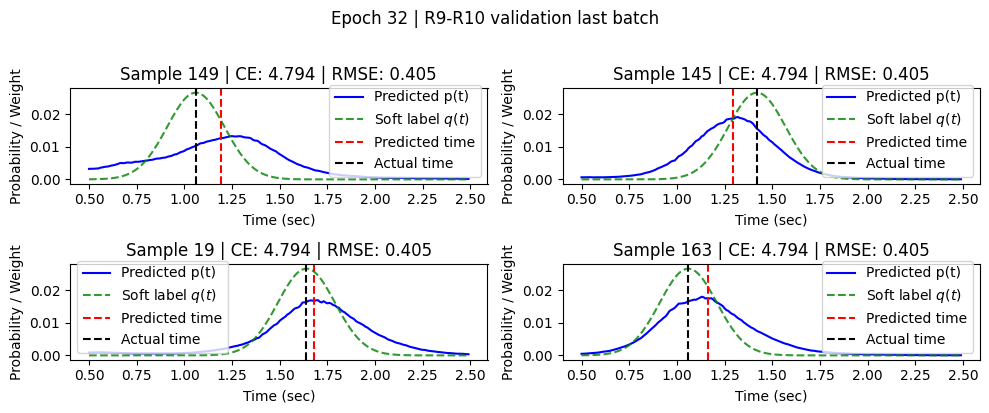

Epoch 33/120: 

Epoch 33 [147/147] Loss 6.1224 CE 4.9576 RMSE 0.3883 KL 0.0000 WASS 0.0000 NRMSE 0.8975 Entropy 4.948: 100%|██████████| 147/147 [00:11<00:00, 12.59it/s]


NRMSE: 0.8975 Total loss: 883.3925 Total CE: 722.8188 Total RMSE: 53.5246 Total KL: 0.0000 Total WASS: 0.0000


Val [70/70] Loss 5.2217 CE 4.8070 RMSE 0.4147 NRMSE 0.9318: 100%|██████████| 70/70 [00:03<00:00, 21.22it/s]


Val NRMSE: 931.819, Val Loss: 5.230859, Val CE: 4.857016, Val RMSE: 0.373843
mean bias (s): 0.08392194658517838


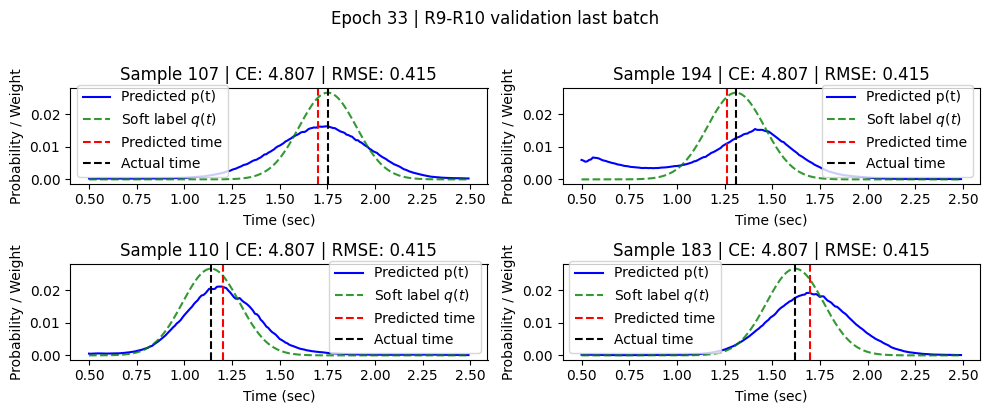

Epoch 34/120: 

Epoch 34 [147/147] Loss 5.9495 CE 4.8974 RMSE 0.3507 KL 0.0000 WASS 0.0000 NRMSE 0.8936 Entropy 4.934: 100%|██████████| 147/147 [00:11<00:00, 12.38it/s]


NRMSE: 0.8936 Total loss: 882.4560 Total CE: 722.3860 Total RMSE: 53.3567 Total KL: 0.0000 Total WASS: 0.0000


Val [70/70] Loss 5.1979 CE 4.7892 RMSE 0.4087 NRMSE 0.9299: 100%|██████████| 70/70 [00:03<00:00, 21.02it/s]


Val NRMSE: 929.862, Val Loss: 5.229764, Val CE: 4.856422, Val RMSE: 0.373342
mean bias (s): 0.0880899578332901


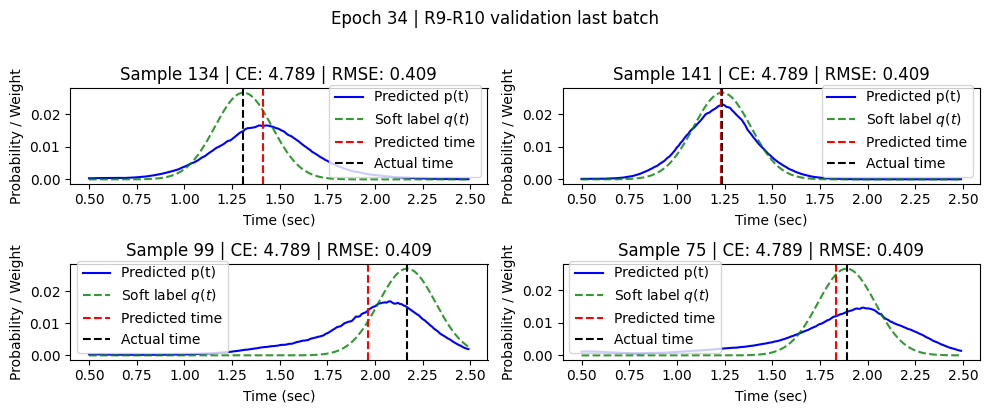

Epoch 35/120: 

Epoch 35 [147/147] Loss 6.2297 CE 5.0031 RMSE 0.4089 KL 0.0000 WASS 0.0000 NRMSE 0.8942 Entropy 4.953: 100%|██████████| 147/147 [00:11<00:00, 12.44it/s]


NRMSE: 0.8942 Total loss: 882.8513 Total CE: 722.5927 Total RMSE: 53.4195 Total KL: 0.0000 Total WASS: 0.0000


Val [70/70] Loss 5.1887 CE 4.7822 RMSE 0.4065 NRMSE 0.9381: 100%|██████████| 70/70 [00:03<00:00, 20.88it/s]


Val NRMSE: 938.144, Val Loss: 5.241078, Val CE: 4.864034, Val RMSE: 0.377044
mean bias (s): 0.08106806874275208


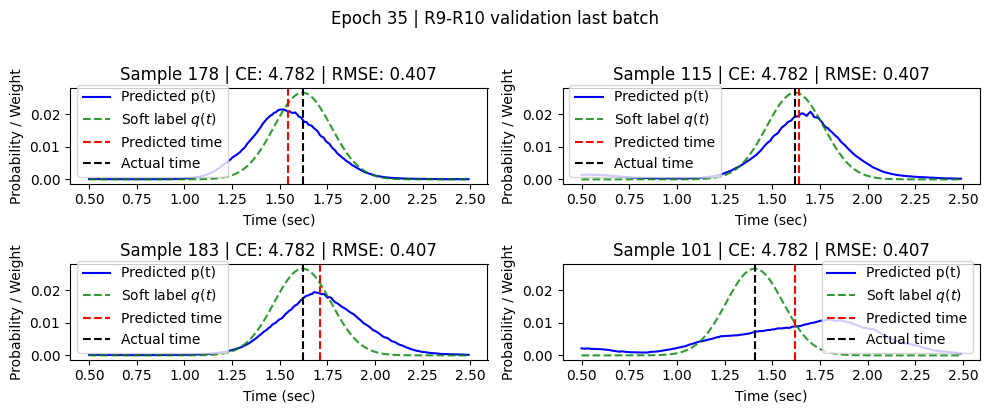

Epoch 36/120: 

Epoch 36 [147/147] Loss 5.9450 CE 4.8877 RMSE 0.3524 KL 0.0000 WASS 0.0000 NRMSE 0.8907 Entropy 4.898: 100%|██████████| 147/147 [00:11<00:00, 12.67it/s]


NRMSE: 0.8907 Total loss: 881.6867 Total CE: 721.9773 Total RMSE: 53.2365 Total KL: 0.0000 Total WASS: 0.0000


Val [70/70] Loss 5.1810 CE 4.7768 RMSE 0.4042 NRMSE 0.9359: 100%|██████████| 70/70 [00:03<00:00, 21.22it/s]


Val NRMSE: 935.930, Val Loss: 5.237233, Val CE: 4.861486, Val RMSE: 0.375747
mean bias (s): 0.09218033403158188


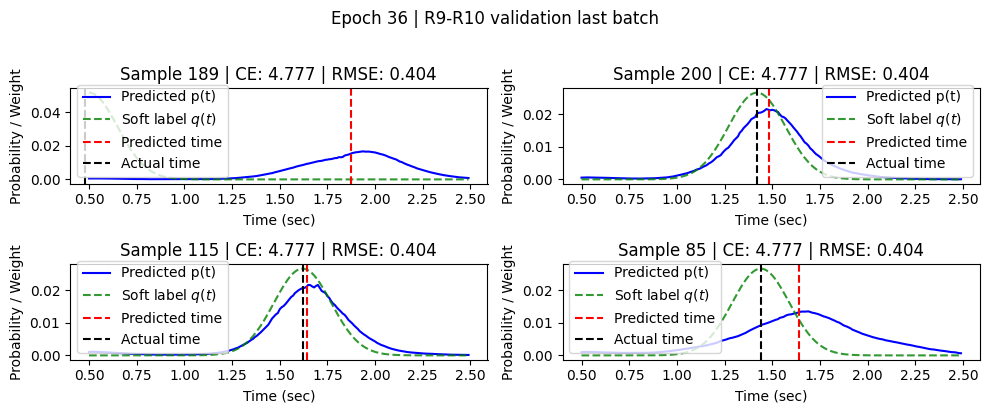

Epoch 37/120: 

Epoch 37 [147/147] Loss 5.8644 CE 4.8754 RMSE 0.3297 KL 0.0000 WASS 0.0000 NRMSE 0.8927 Entropy 4.910: 100%|██████████| 147/147 [00:11<00:00, 12.47it/s]


NRMSE: 0.8927 Total loss: 882.1008 Total CE: 722.2308 Total RMSE: 53.2900 Total KL: 0.0000 Total WASS: 0.0000


Val [70/70] Loss 5.1956 CE 4.7877 RMSE 0.4079 NRMSE 0.9456: 100%|██████████| 70/70 [00:03<00:00, 21.04it/s]


Val NRMSE: 945.603, Val Loss: 5.255837, Val CE: 4.875196, Val RMSE: 0.380641
mean bias (s): 0.06910260766744614


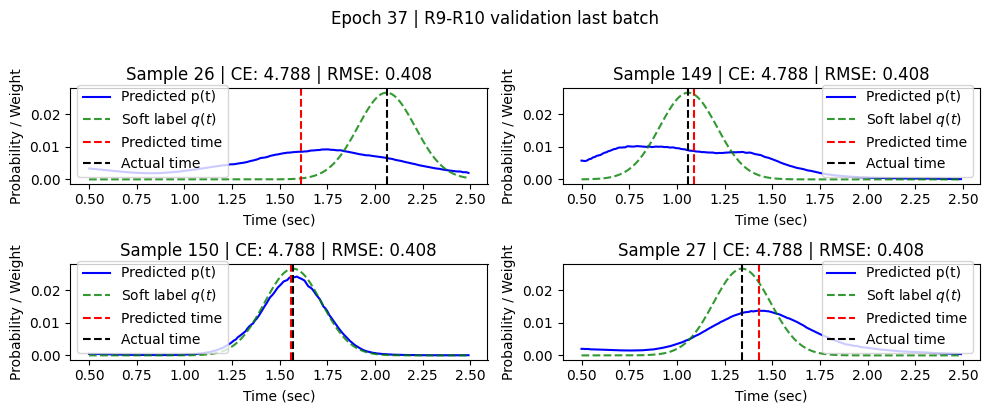

Epoch 38/120: 

Epoch 38 [147/147] Loss 6.0020 CE 4.9190 RMSE 0.3610 KL 0.0000 WASS 0.0000 NRMSE 0.8891 Entropy 4.899: 100%|██████████| 147/147 [00:11<00:00, 12.54it/s]


NRMSE: 0.8891 Total loss: 880.9146 Total CE: 721.6864 Total RMSE: 53.0761 Total KL: 0.0000 Total WASS: 0.0000


Val [70/70] Loss 5.2199 CE 4.8127 RMSE 0.4072 NRMSE 0.9403: 100%|██████████| 70/70 [00:03<00:00, 21.11it/s]


Val NRMSE: 940.300, Val Loss: 5.248831, Val CE: 4.871833, Val RMSE: 0.376998
mean bias (s): 0.08929707109928131


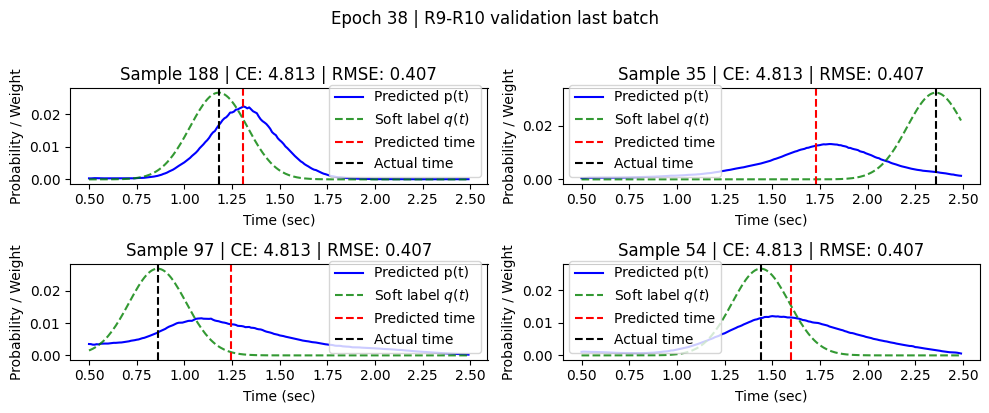

Restart from checkpoint ../../artifacts/RecurrentSneddyUnet__ch126_c32_w1p5_st3_d1-1-1_k7_bnrnn_bd2_drop0p1_dp0p0_sg0_rnngru_bi1_hm1p0_rpb1_brl1_rdrop0p05_dwpos1__bs512__lr0p001__sig0p15__tau0p65__lt3p0_ce0__20260612_185612/best_model.pth. Best Val NRMSE: 929.449144 (epoch 23)
Updating learning rate 0.001 -> 0.0005
Epoch 39/120: 

Epoch 39 [147/147] Loss 5.8862 CE 4.8670 RMSE 0.3397 KL 0.0000 WASS 0.0000 NRMSE 0.9035 Entropy 4.873: 100%|██████████| 147/147 [00:11<00:00, 12.32it/s]


NRMSE: 0.9035 Total loss: 885.3008 Total CE: 723.6650 Total RMSE: 53.8786 Total KL: 0.0000 Total WASS: 0.0000


Val [70/70] Loss 5.2029 CE 4.8011 RMSE 0.4019 NRMSE 0.9393: 100%|██████████| 70/70 [00:03<00:00, 21.14it/s]


Val NRMSE: 939.303, Val Loss: 5.253503, Val CE: 4.875895, Val RMSE: 0.377608
mean bias (s): 0.07159730046987534


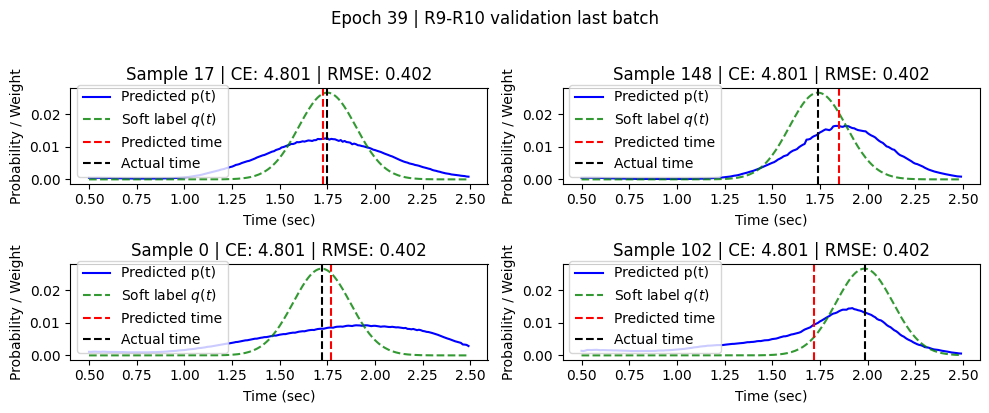

Epoch 40/120: 

Epoch 40 [147/147] Loss 6.1446 CE 4.9442 RMSE 0.4001 KL 0.0000 WASS 0.0000 NRMSE 0.9015 Entropy 4.898: 100%|██████████| 147/147 [00:11<00:00, 12.66it/s]


NRMSE: 0.9015 Total loss: 884.7011 Total CE: 723.1846 Total RMSE: 53.8388 Total KL: 0.0000 Total WASS: 0.0000


Val [70/70] Loss 5.1955 CE 4.7911 RMSE 0.4044 NRMSE 0.9355: 100%|██████████| 70/70 [00:03<00:00, 21.12it/s]


Val NRMSE: 935.487, Val Loss: 5.237377, Val CE: 4.862093, Val RMSE: 0.375285
mean bias (s): 0.08137455582618713


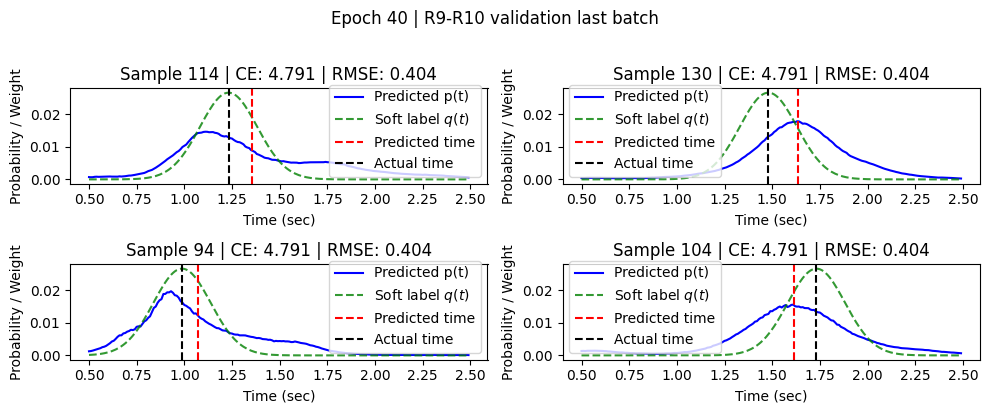

Epoch 41/120: 

Epoch 41 [147/147] Loss 6.0035 CE 4.9161 RMSE 0.3625 KL 0.0000 WASS 0.0000 NRMSE 0.9000 Entropy 4.902: 100%|██████████| 147/147 [00:12<00:00, 12.07it/s]


NRMSE: 0.9000 Total loss: 883.9896 Total CE: 722.8639 Total RMSE: 53.7085 Total KL: 0.0000 Total WASS: 0.0000


Val [70/70] Loss 5.1722 CE 4.7770 RMSE 0.3952 NRMSE 0.9389: 100%|██████████| 70/70 [00:03<00:00, 21.14it/s]


Val NRMSE: 938.922, Val Loss: 5.248450, Val CE: 4.871203, Val RMSE: 0.377247
mean bias (s): 0.07346488535404205


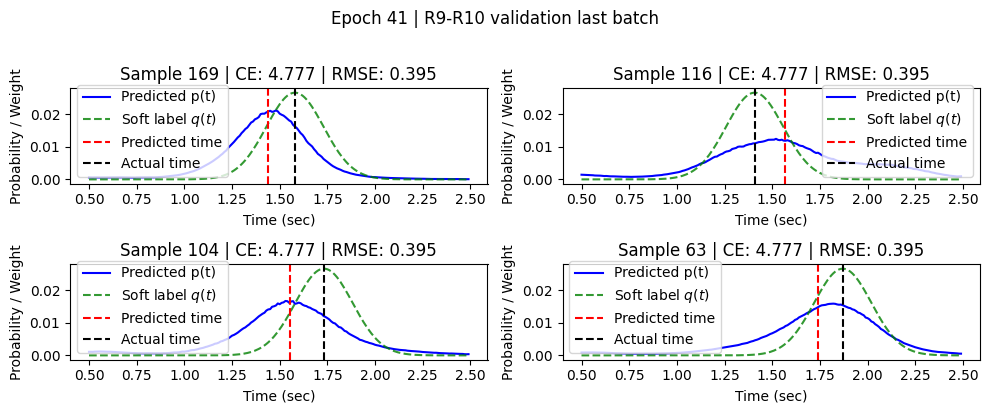

Epoch 42/120: 

Epoch 42 [147/147] Loss 6.1287 CE 4.9771 RMSE 0.3838 KL 0.0000 WASS 0.0000 NRMSE 0.8993 Entropy 4.942: 100%|██████████| 147/147 [00:12<00:00, 12.03it/s]


NRMSE: 0.8993 Total loss: 884.4191 Total CE: 723.1907 Total RMSE: 53.7428 Total KL: 0.0000 Total WASS: 0.0000


Val [70/70] Loss 5.2204 CE 4.8136 RMSE 0.4068 NRMSE 0.9322: 100%|██████████| 70/70 [00:03<00:00, 20.72it/s]


Val NRMSE: 932.172, Val Loss: 5.232471, Val CE: 4.858960, Val RMSE: 0.373511
mean bias (s): 0.10441308468580246


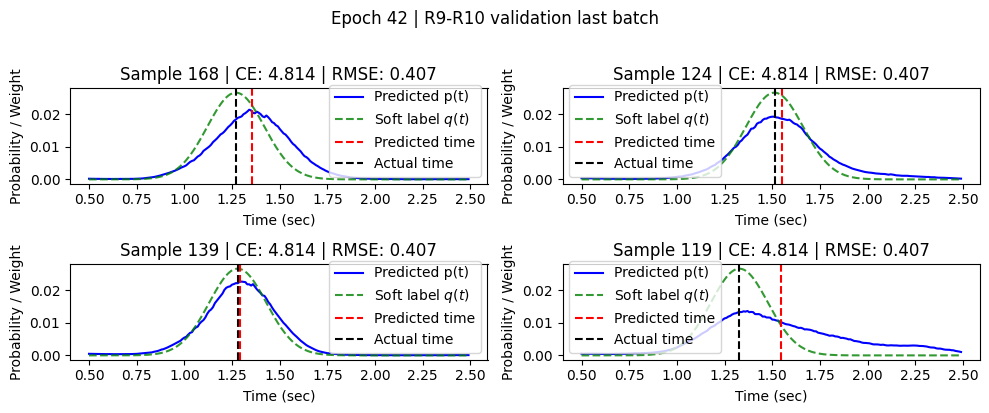

Epoch 43/120: 

Epoch 43 [147/147] Loss 6.0004 CE 4.9138 RMSE 0.3622 KL 0.0000 WASS 0.0000 NRMSE 0.8971 Entropy 4.938: 100%|██████████| 147/147 [00:12<00:00, 12.05it/s]


NRMSE: 0.8971 Total loss: 882.9652 Total CE: 722.5184 Total RMSE: 53.4823 Total KL: 0.0000 Total WASS: 0.0000


Val [70/70] Loss 5.1959 CE 4.7939 RMSE 0.4019 NRMSE 0.9344: 100%|██████████| 70/70 [00:03<00:00, 20.70it/s]


Val NRMSE: 934.449, Val Loss: 5.240343, Val CE: 4.864700, Val RMSE: 0.375643
mean bias (s): 0.07472258061170578


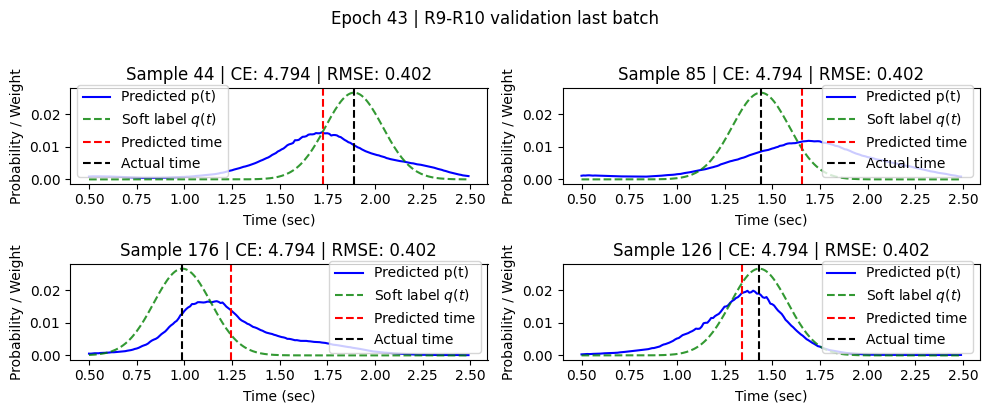

Epoch 44/120: 

Epoch 44 [147/147] Loss 6.0530 CE 4.9199 RMSE 0.3777 KL 0.0000 WASS 0.0000 NRMSE 0.8967 Entropy 4.922: 100%|██████████| 147/147 [00:12<00:00, 11.99it/s]


NRMSE: 0.8967 Total loss: 883.2982 Total CE: 722.5724 Total RMSE: 53.5753 Total KL: 0.0000 Total WASS: 0.0000


Val [70/70] Loss 5.1861 CE 4.7837 RMSE 0.4024 NRMSE 0.9435: 100%|██████████| 70/70 [00:03<00:00, 20.86it/s]


Val NRMSE: 943.455, Val Loss: 5.247764, Val CE: 4.868047, Val RMSE: 0.379717
mean bias (s): 0.06596056371927261


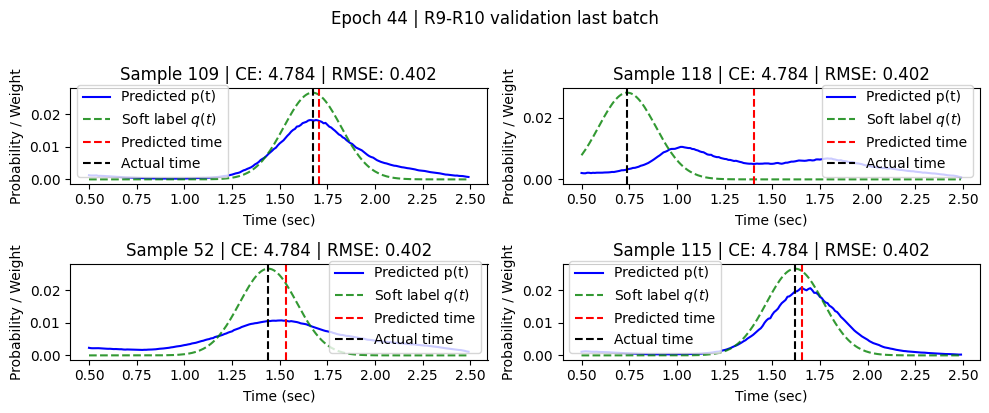

Epoch 45/120: 

Epoch 45 [147/147] Loss 5.8956 CE 4.8899 RMSE 0.3353 KL 0.0000 WASS 0.0000 NRMSE 0.8969 Entropy 4.885: 100%|██████████| 147/147 [00:12<00:00, 12.21it/s]


NRMSE: 0.8969 Total loss: 883.3065 Total CE: 722.6865 Total RMSE: 53.5400 Total KL: 0.0000 Total WASS: 0.0000


Val [70/70] Loss 5.1967 CE 4.7896 RMSE 0.4071 NRMSE 0.9330: 100%|██████████| 70/70 [00:03<00:00, 21.00it/s]


Val NRMSE: 932.961, Val Loss: 5.230159, Val CE: 4.855760, Val RMSE: 0.374399
mean bias (s): 0.08434886485338211


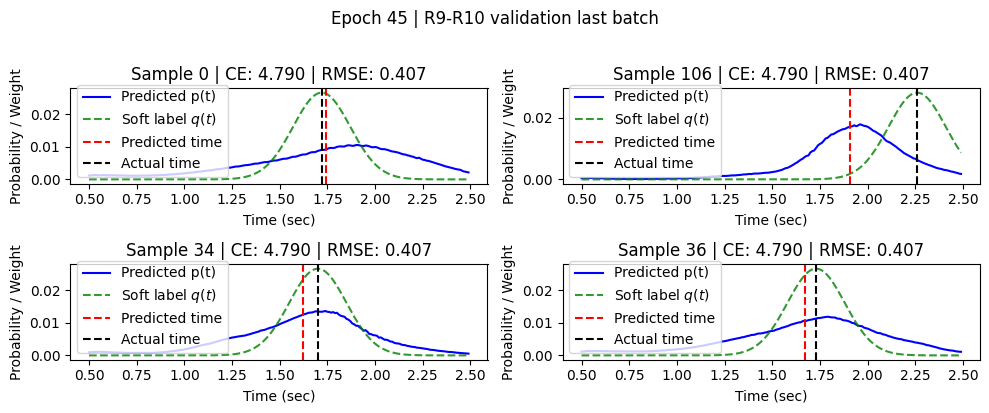

Epoch 46/120: 

Epoch 46 [147/147] Loss 5.9692 CE 4.8953 RMSE 0.3580 KL 0.0000 WASS 0.0000 NRMSE 0.8933 Entropy 4.949: 100%|██████████| 147/147 [00:11<00:00, 12.41it/s]


NRMSE: 0.8933 Total loss: 881.8935 Total CE: 722.0191 Total RMSE: 53.2914 Total KL: 0.0000 Total WASS: 0.0000


Val [70/70] Loss 5.2103 CE 4.8031 RMSE 0.4072 NRMSE 0.9340: 100%|██████████| 70/70 [00:03<00:00, 20.77it/s]


Val NRMSE: 934.019, Val Loss: 5.238039, Val CE: 4.863027, Val RMSE: 0.375011
mean bias (s): 0.08655013144016266


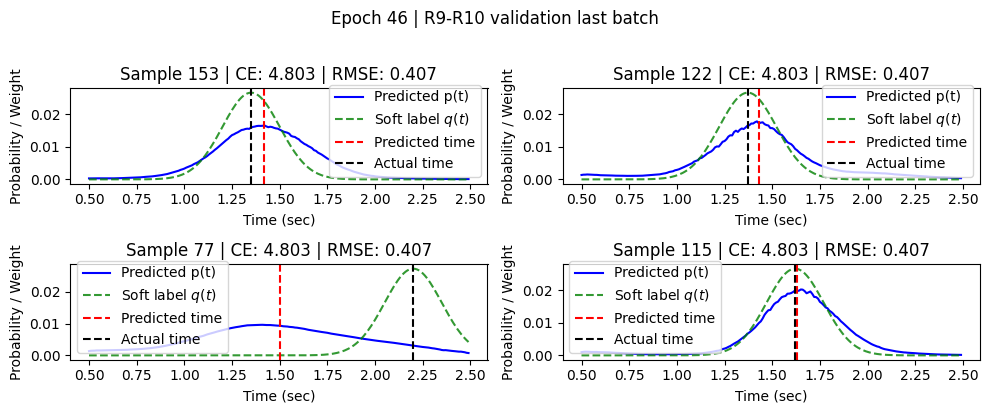

Epoch 47/120: 

Epoch 47 [147/147] Loss 5.9138 CE 4.9046 RMSE 0.3364 KL 0.0000 WASS 0.0000 NRMSE 0.8929 Entropy 4.886: 100%|██████████| 147/147 [00:11<00:00, 12.34it/s]


NRMSE: 0.8929 Total loss: 881.3152 Total CE: 721.5380 Total RMSE: 53.2591 Total KL: 0.0000 Total WASS: 0.0000


Val [70/70] Loss 5.1900 CE 4.7882 RMSE 0.4017 NRMSE 0.9401: 100%|██████████| 70/70 [00:03<00:00, 21.10it/s]


Val NRMSE: 940.088, Val Loss: 5.246973, Val CE: 4.868942, Val RMSE: 0.378030
mean bias (s): 0.07591968774795532


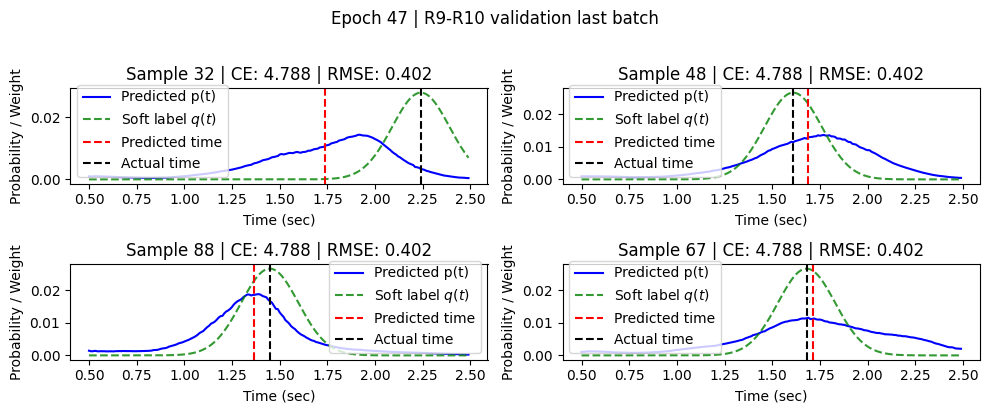

Epoch 48/120: 

Epoch 48 [147/147] Loss 5.9767 CE 4.8923 RMSE 0.3614 KL 0.0000 WASS 0.0000 NRMSE 0.8916 Entropy 4.867: 100%|██████████| 147/147 [00:12<00:00, 12.19it/s]


NRMSE: 0.8916 Total loss: 881.4948 Total CE: 721.7881 Total RMSE: 53.2356 Total KL: 0.0000 Total WASS: 0.0000


Val [70/70] Loss 5.2040 CE 4.8019 RMSE 0.4021 NRMSE 0.9451: 100%|██████████| 70/70 [00:03<00:00, 20.86it/s]


Val NRMSE: 945.150, Val Loss: 5.266195, Val CE: 4.885964, Val RMSE: 0.380231
mean bias (s): 0.07711087912321091


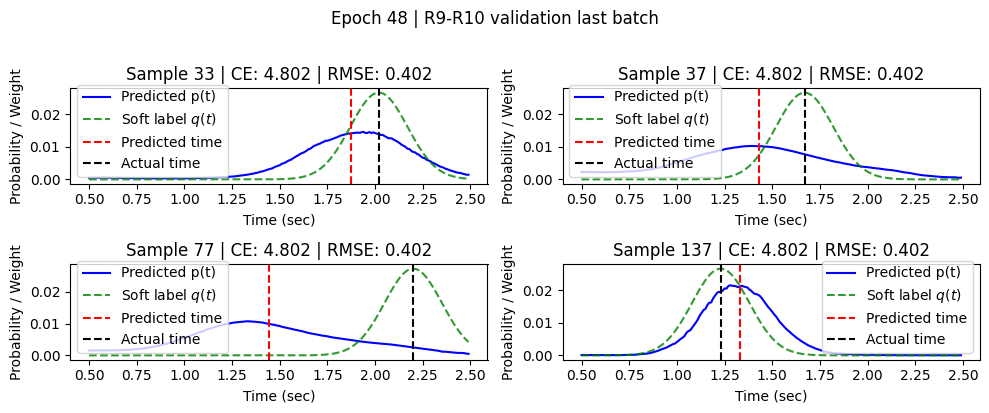

Epoch 49/120: 

Epoch 49 [147/147] Loss 6.0248 CE 4.9476 RMSE 0.3591 KL 0.0000 WASS 0.0000 NRMSE 0.8933 Entropy 4.958: 100%|██████████| 147/147 [00:12<00:00, 12.19it/s]


NRMSE: 0.8933 Total loss: 881.6038 Total CE: 721.7668 Total RMSE: 53.2790 Total KL: 0.0000 Total WASS: 0.0000


Val [70/70] Loss 5.1893 CE 4.7887 RMSE 0.4006 NRMSE 0.9407: 100%|██████████| 70/70 [00:03<00:00, 20.91it/s]


Val NRMSE: 940.718, Val Loss: 5.252702, Val CE: 4.874472, Val RMSE: 0.378230
mean bias (s): 0.0746370330452919


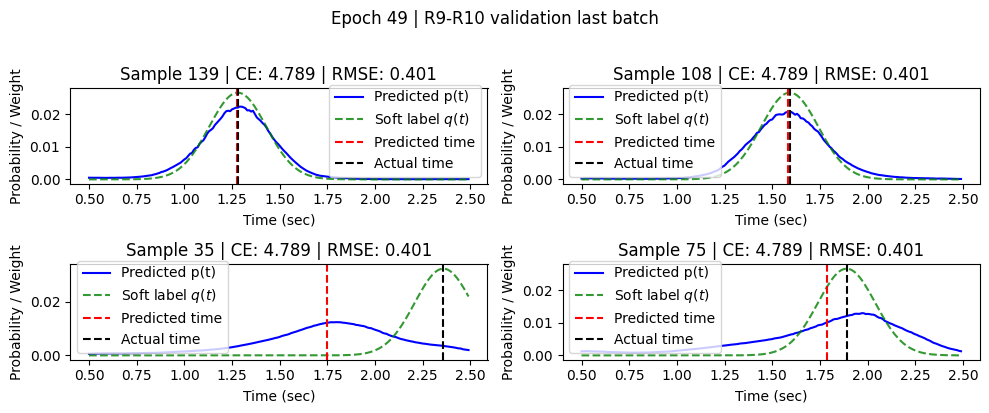

Epoch 50/120: 

Epoch 50 [147/147] Loss 5.9468 CE 4.8681 RMSE 0.3596 KL 0.0000 WASS 0.0000 NRMSE 0.8932 Entropy 4.890: 100%|██████████| 147/147 [00:12<00:00, 12.18it/s]


NRMSE: 0.8932 Total loss: 881.7737 Total CE: 722.0047 Total RMSE: 53.2563 Total KL: 0.0000 Total WASS: 0.0000


Val [70/70] Loss 5.2013 CE 4.7996 RMSE 0.4017 NRMSE 0.9332: 100%|██████████| 70/70 [00:03<00:00, 20.78it/s]


Val NRMSE: 933.183, Val Loss: 5.238698, Val CE: 4.864347, Val RMSE: 0.374350
mean bias (s): 0.0926886796951294


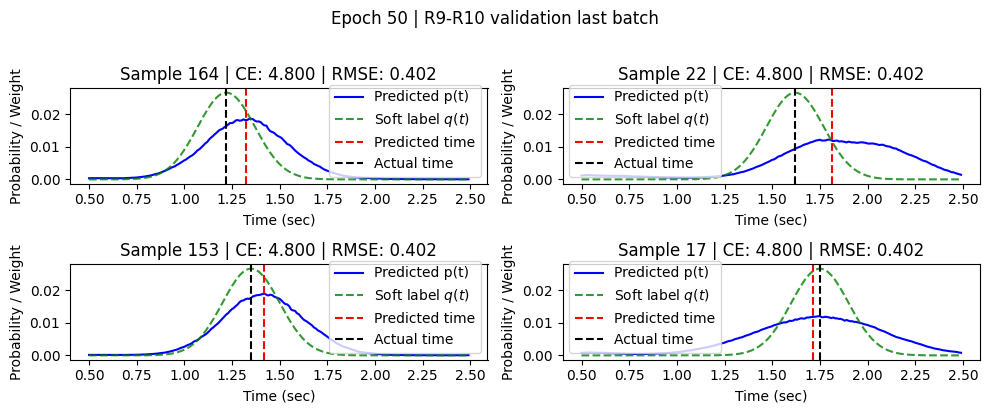

Epoch 51/120: 

Epoch 51 [147/147] Loss 6.0056 CE 4.8933 RMSE 0.3708 KL 0.0000 WASS 0.0000 NRMSE 0.8876 Entropy 4.902: 100%|██████████| 147/147 [00:11<00:00, 12.32it/s]


NRMSE: 0.8876 Total loss: 880.3474 Total CE: 721.3383 Total RMSE: 53.0031 Total KL: 0.0000 Total WASS: 0.0000


Val [70/70] Loss 5.1816 CE 4.7835 RMSE 0.3981 NRMSE 0.9457: 100%|██████████| 70/70 [00:03<00:00, 21.04it/s]


Val NRMSE: 945.661, Val Loss: 5.259799, Val CE: 4.879617, Val RMSE: 0.380182
mean bias (s): 0.07354634255170822


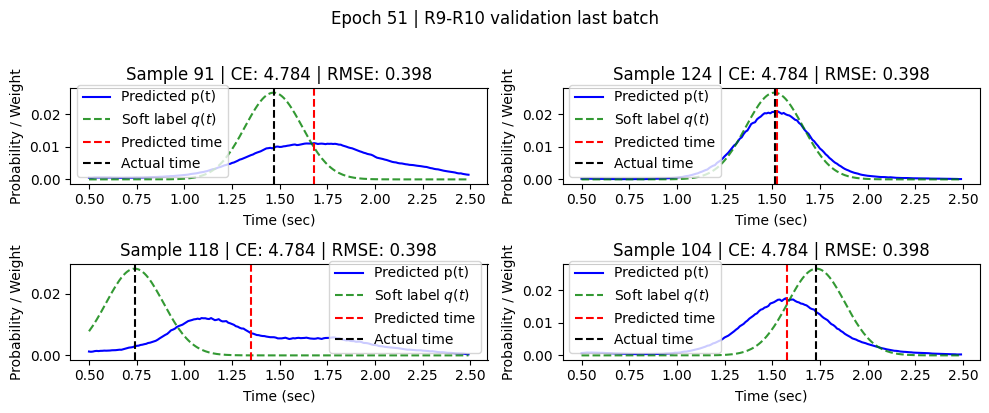

Epoch 52/120: 

Epoch 52 [147/147] Loss 5.9713 CE 4.8993 RMSE 0.3573 KL 0.0000 WASS 0.0000 NRMSE 0.8896 Entropy 4.860: 100%|██████████| 147/147 [00:11<00:00, 12.41it/s]


NRMSE: 0.8896 Total loss: 880.7959 Total CE: 721.7344 Total RMSE: 53.0205 Total KL: 0.0000 Total WASS: 0.0000


Val [70/70] Loss 5.1804 CE 4.7795 RMSE 0.4008 NRMSE 0.9372: 100%|██████████| 70/70 [00:03<00:00, 21.07it/s]


Val NRMSE: 937.216, Val Loss: 5.238840, Val CE: 4.863049, Val RMSE: 0.375791
mean bias (s): 0.09739157557487488


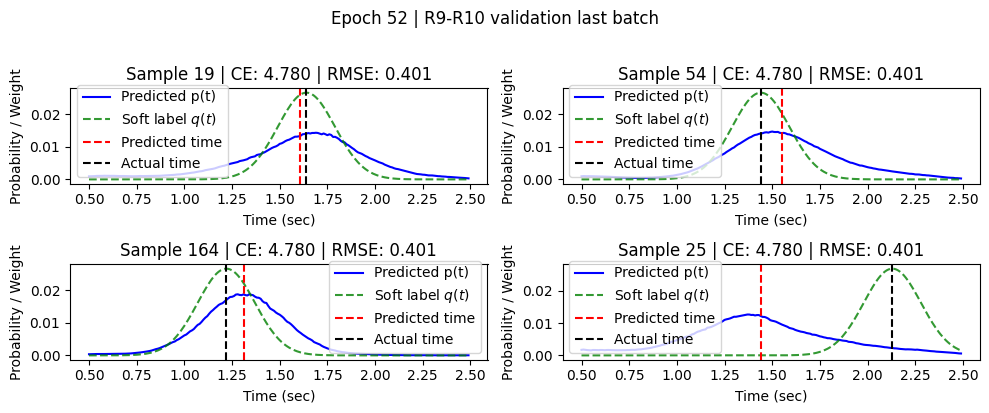

Epoch 53/120: 

Epoch 53 [147/147] Loss 5.9297 CE 4.8912 RMSE 0.3462 KL 0.0000 WASS 0.0000 NRMSE 0.8878 Entropy 4.932: 100%|██████████| 147/147 [00:11<00:00, 12.39it/s]


NRMSE: 0.8878 Total loss: 880.0872 Total CE: 721.3480 Total RMSE: 52.9131 Total KL: 0.0000 Total WASS: 0.0000


Val [70/70] Loss 5.1991 CE 4.7986 RMSE 0.4005 NRMSE 0.9441: 100%|██████████| 70/70 [00:03<00:00, 20.66it/s]


Val NRMSE: 944.088, Val Loss: 5.254245, Val CE: 4.874166, Val RMSE: 0.380079
mean bias (s): 0.062395866960287094


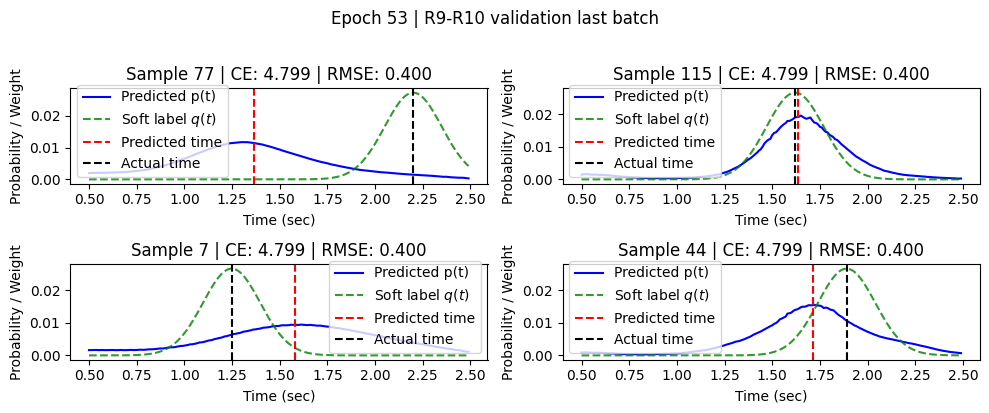

Restart from checkpoint ../../artifacts/RecurrentSneddyUnet__ch126_c32_w1p5_st3_d1-1-1_k7_bnrnn_bd2_drop0p1_dp0p0_sg0_rnngru_bi1_hm1p0_rpb1_brl1_rdrop0p05_dwpos1__bs512__lr0p001__sig0p15__tau0p65__lt3p0_ce0__20260612_185612/best_model.pth. Best Val NRMSE: 929.449144 (epoch 23)
Updating learning rate 0.0005 -> 0.00025
Epoch 54/120: 

Epoch 54 [147/147] Loss 6.0188 CE 4.9404 RMSE 0.3595 KL 0.0000 WASS 0.0000 NRMSE 0.9014 Entropy 4.922: 100%|██████████| 147/147 [00:11<00:00, 12.48it/s]


NRMSE: 0.9014 Total loss: 884.5187 Total CE: 723.1688 Total RMSE: 53.7833 Total KL: 0.0000 Total WASS: 0.0000


Val [70/70] Loss 5.1806 CE 4.7808 RMSE 0.3998 NRMSE 0.9354: 100%|██████████| 70/70 [00:03<00:00, 20.90it/s]


Val NRMSE: 935.378, Val Loss: 5.236573, Val CE: 4.860810, Val RMSE: 0.375763
mean bias (s): 0.07434472441673279


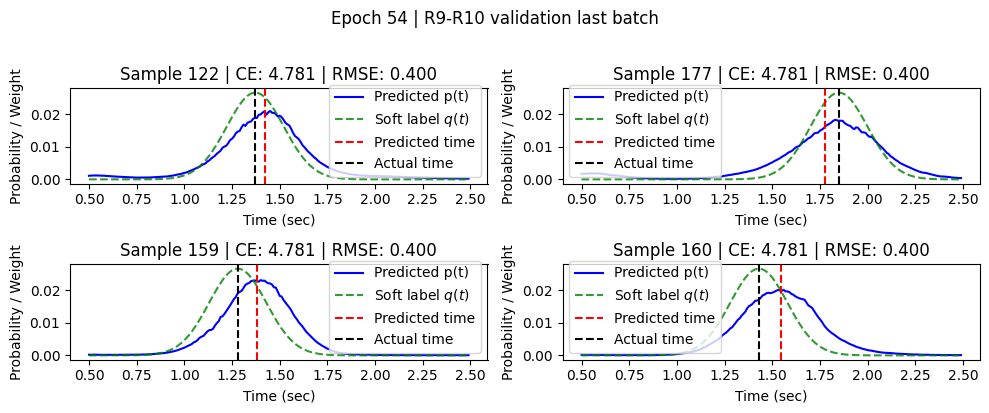

Epoch 55/120: 

Epoch 55 [147/147] Loss 6.0040 CE 4.9123 RMSE 0.3639 KL 0.0000 WASS 0.0000 NRMSE 0.8981 Entropy 4.924: 100%|██████████| 147/147 [00:11<00:00, 12.39it/s]


NRMSE: 0.8981 Total loss: 883.7255 Total CE: 722.7571 Total RMSE: 53.6561 Total KL: 0.0000 Total WASS: 0.0000


Val [70/70] Loss 5.1858 CE 4.7871 RMSE 0.3987 NRMSE 0.9350: 100%|██████████| 70/70 [00:03<00:00, 21.17it/s]


Val NRMSE: 935.020, Val Loss: 5.234814, Val CE: 4.859427, Val RMSE: 0.375387
mean bias (s): 0.08170980215072632


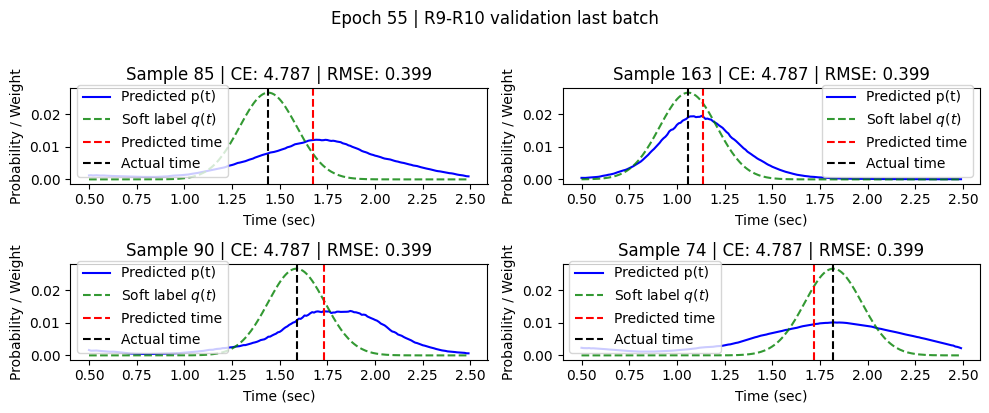

Epoch 56/120: 

Epoch 56 [147/147] Loss 6.0714 CE 4.9306 RMSE 0.3803 KL 0.0000 WASS 0.0000 NRMSE 0.8982 Entropy 4.924: 100%|██████████| 147/147 [00:11<00:00, 12.44it/s]


NRMSE: 0.8982 Total loss: 883.3181 Total CE: 722.6634 Total RMSE: 53.5516 Total KL: 0.0000 Total WASS: 0.0000


Val [70/70] Loss 5.1926 CE 4.7900 RMSE 0.4026 NRMSE 0.9330: 100%|██████████| 70/70 [00:03<00:00, 20.92it/s]


Val NRMSE: 933.043, Val Loss: 5.228924, Val CE: 4.854530, Val RMSE: 0.374394
mean bias (s): 0.08279730379581451


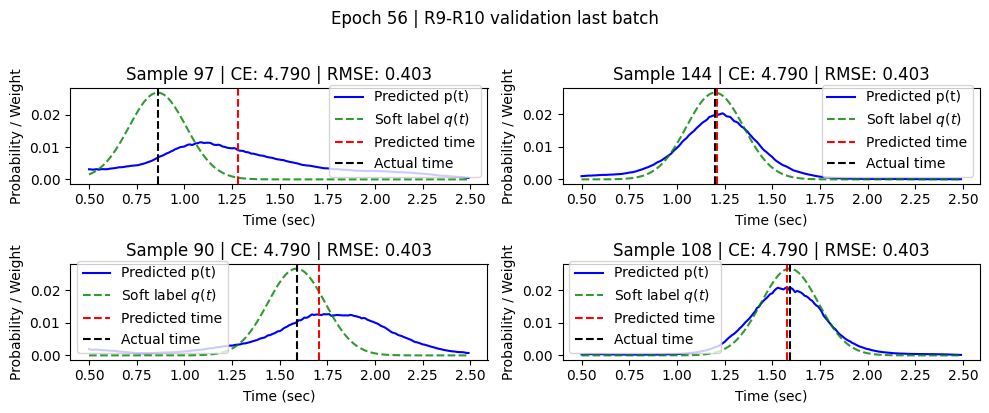

Epoch 57/120: 

Epoch 57 [147/147] Loss 6.1011 CE 4.9407 RMSE 0.3868 KL 0.0000 WASS 0.0000 NRMSE 0.8971 Entropy 4.888: 100%|██████████| 147/147 [00:12<00:00, 12.13it/s]


NRMSE: 0.8971 Total loss: 882.8713 Total CE: 722.3118 Total RMSE: 53.5198 Total KL: 0.0000 Total WASS: 0.0000


Val [70/70] Loss 5.1873 CE 4.7857 RMSE 0.4015 NRMSE 0.9403: 100%|██████████| 70/70 [00:03<00:00, 20.52it/s]


Val NRMSE: 940.313, Val Loss: 5.244788, Val CE: 4.867400, Val RMSE: 0.377387
mean bias (s): 0.07998120784759521


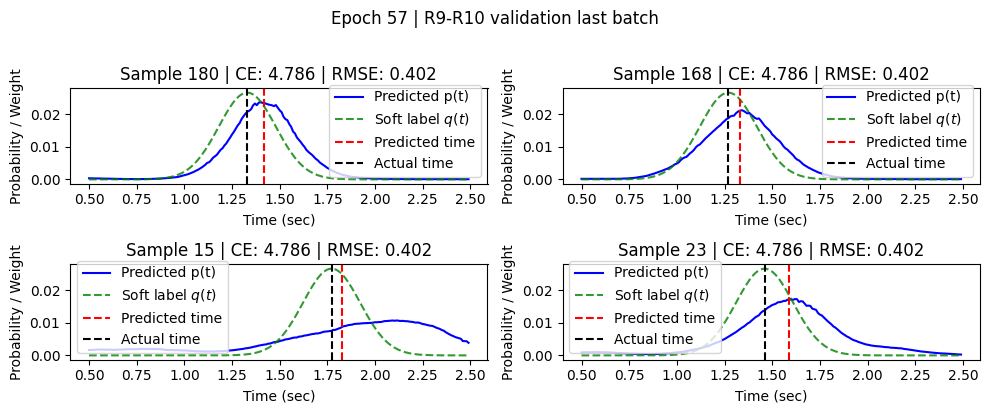

Epoch 58/120: 

Epoch 58 [147/147] Loss 5.9412 CE 4.8918 RMSE 0.3498 KL 0.0000 WASS 0.0000 NRMSE 0.8957 Entropy 4.934: 100%|██████████| 147/147 [00:11<00:00, 12.26it/s]


NRMSE: 0.8957 Total loss: 882.6835 Total CE: 722.3290 Total RMSE: 53.4515 Total KL: 0.0000 Total WASS: 0.0000


Val [70/70] Loss 5.2119 CE 4.8056 RMSE 0.4063 NRMSE 0.9316: 100%|██████████| 70/70 [00:03<00:00, 21.01it/s]


Val NRMSE: 931.573, Val Loss: 5.229301, Val CE: 4.856058, Val RMSE: 0.373242
mean bias (s): 0.09757409244775772


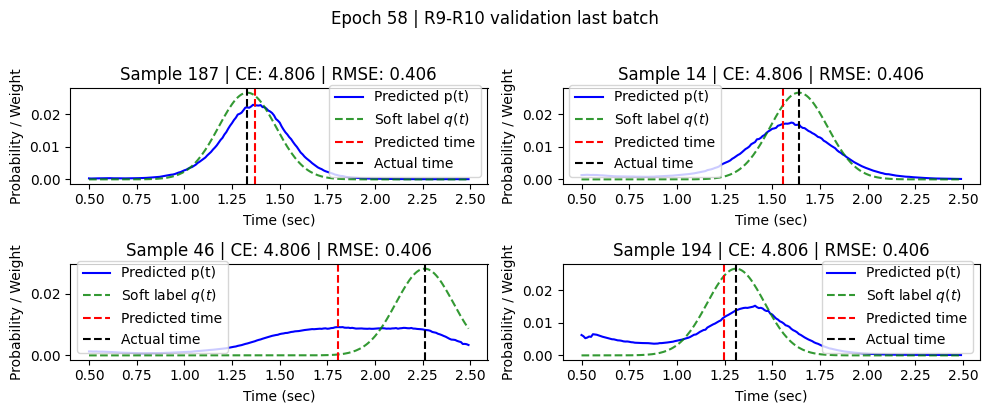

Epoch 59/120: 

Epoch 59 [147/147] Loss 6.0178 CE 4.9013 RMSE 0.3721 KL 0.0000 WASS 0.0000 NRMSE 0.8952 Entropy 4.947: 100%|██████████| 147/147 [00:11<00:00, 12.36it/s]


NRMSE: 0.8952 Total loss: 882.1756 Total CE: 722.1281 Total RMSE: 53.3491 Total KL: 0.0000 Total WASS: 0.0000


Val [70/70] Loss 5.1848 CE 4.7845 RMSE 0.4002 NRMSE 0.9375: 100%|██████████| 70/70 [00:03<00:00, 21.05it/s]


Val NRMSE: 937.495, Val Loss: 5.239143, Val CE: 4.862603, Val RMSE: 0.376541
mean bias (s): 0.07406473159790039


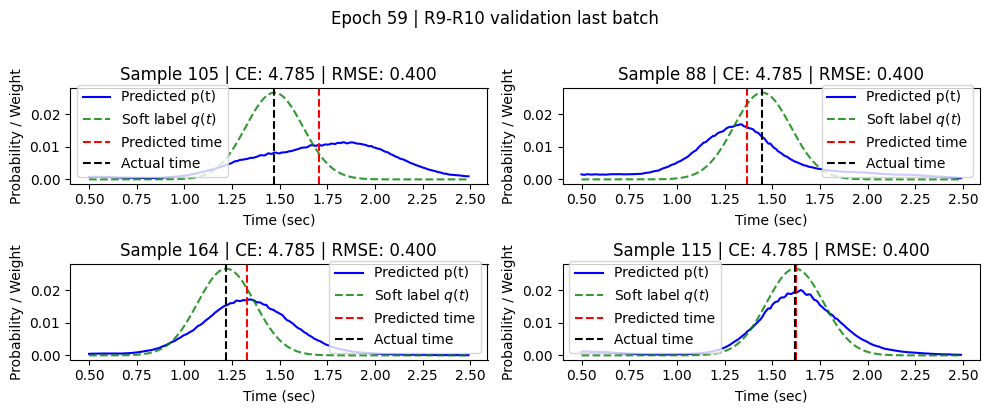

Epoch 60/120: 

Epoch 60 [147/147] Loss 5.9183 CE 4.8925 RMSE 0.3419 KL 0.0000 WASS 0.0000 NRMSE 0.8944 Entropy 4.924: 100%|██████████| 147/147 [00:11<00:00, 12.53it/s]


NRMSE: 0.8944 Total loss: 882.2494 Total CE: 722.2608 Total RMSE: 53.3295 Total KL: 0.0000 Total WASS: 0.0000


Val [70/70] Loss 5.1979 CE 4.7941 RMSE 0.4038 NRMSE 0.9401: 100%|██████████| 70/70 [00:03<00:00, 20.99it/s]


Val NRMSE: 940.052, Val Loss: 5.244535, Val CE: 4.866714, Val RMSE: 0.377821
mean bias (s): 0.07302922755479813


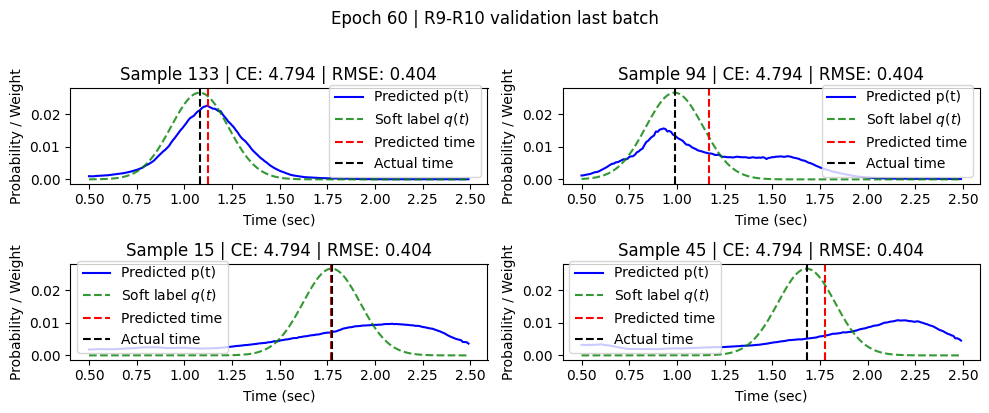

Epoch 61/120: 

Epoch 61 [147/147] Loss 6.0428 CE 4.9224 RMSE 0.3735 KL 0.0000 WASS 0.0000 NRMSE 0.8929 Entropy 4.921: 100%|██████████| 147/147 [00:11<00:00, 12.30it/s]


NRMSE: 0.8929 Total loss: 881.6275 Total CE: 721.8845 Total RMSE: 53.2477 Total KL: 0.0000 Total WASS: 0.0000


Val [70/70] Loss 5.1856 CE 4.7850 RMSE 0.4006 NRMSE 0.9400: 100%|██████████| 70/70 [00:03<00:00, 20.74it/s]


Val NRMSE: 939.973, Val Loss: 5.242937, Val CE: 4.865110, Val RMSE: 0.377827
mean bias (s): 0.07394212484359741


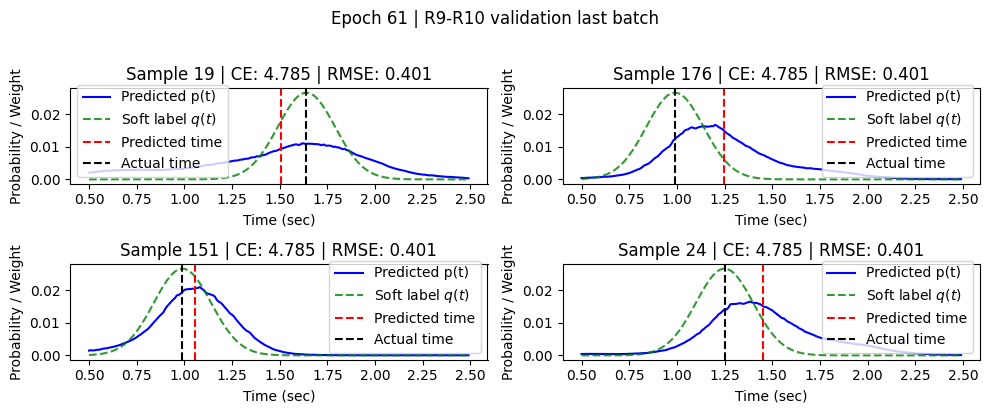

Epoch 62/120: 

Epoch 62 [147/147] Loss 5.9804 CE 4.9293 RMSE 0.3504 KL 0.0000 WASS 0.0000 NRMSE 0.8930 Entropy 4.940: 100%|██████████| 147/147 [00:11<00:00, 12.49it/s]


NRMSE: 0.8930 Total loss: 881.7071 Total CE: 721.9743 Total RMSE: 53.2443 Total KL: 0.0000 Total WASS: 0.0000


Val [70/70] Loss 5.1788 CE 4.7823 RMSE 0.3965 NRMSE 0.9476: 100%|██████████| 70/70 [00:03<00:00, 20.77it/s]


Val NRMSE: 947.567, Val Loss: 5.265072, Val CE: 4.883511, Val RMSE: 0.381561
mean bias (s): 0.055886901915073395


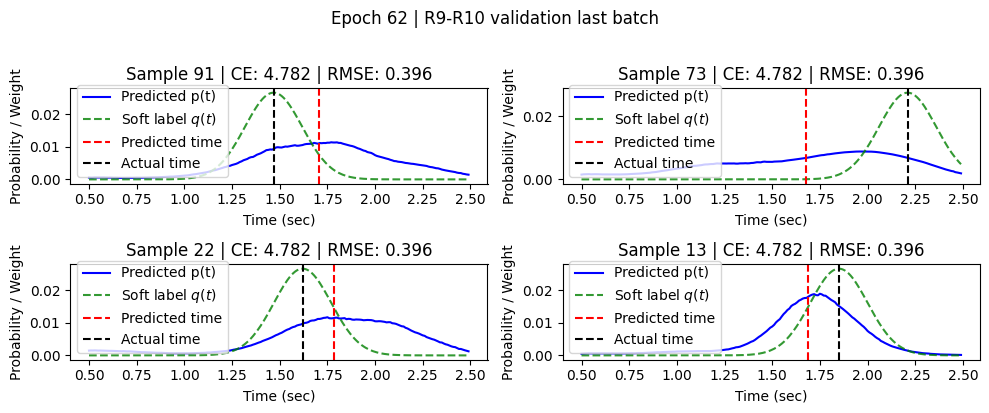

Epoch 63/120: 

Epoch 63 [147/147] Loss 5.9538 CE 4.8799 RMSE 0.3580 KL 0.0000 WASS 0.0000 NRMSE 0.8920 Entropy 4.892: 100%|██████████| 147/147 [00:11<00:00, 12.50it/s]


NRMSE: 0.8920 Total loss: 881.3666 Total CE: 721.6115 Total RMSE: 53.2517 Total KL: 0.0000 Total WASS: 0.0000


Val [70/70] Loss 5.1685 CE 4.7700 RMSE 0.3984 NRMSE 0.9433: 100%|██████████| 70/70 [00:03<00:00, 20.83it/s]


Val NRMSE: 943.325, Val Loss: 5.252545, Val CE: 4.873056, Val RMSE: 0.379489
mean bias (s): 0.06628838926553726


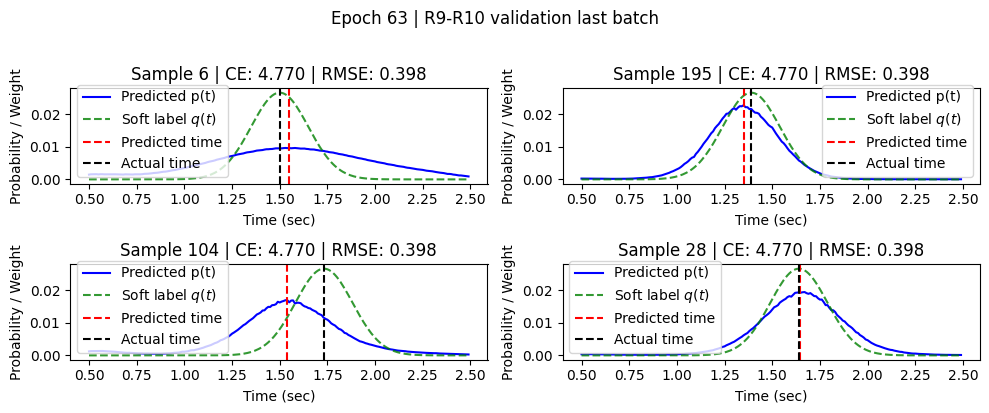

Epoch 64/120: 

Epoch 64 [147/147] Loss 6.0698 CE 4.9243 RMSE 0.3818 KL 0.0000 WASS 0.0000 NRMSE 0.8902 Entropy 4.890: 100%|██████████| 147/147 [00:11<00:00, 12.38it/s]


NRMSE: 0.8902 Total loss: 881.0330 Total CE: 721.6485 Total RMSE: 53.1282 Total KL: 0.0000 Total WASS: 0.0000


Val [70/70] Loss 5.2004 CE 4.7974 RMSE 0.4030 NRMSE 0.9471: 100%|██████████| 70/70 [00:03<00:00, 20.74it/s]


Val NRMSE: 947.059, Val Loss: 5.257605, Val CE: 4.876763, Val RMSE: 0.380842
mean bias (s): 0.07501741498708725


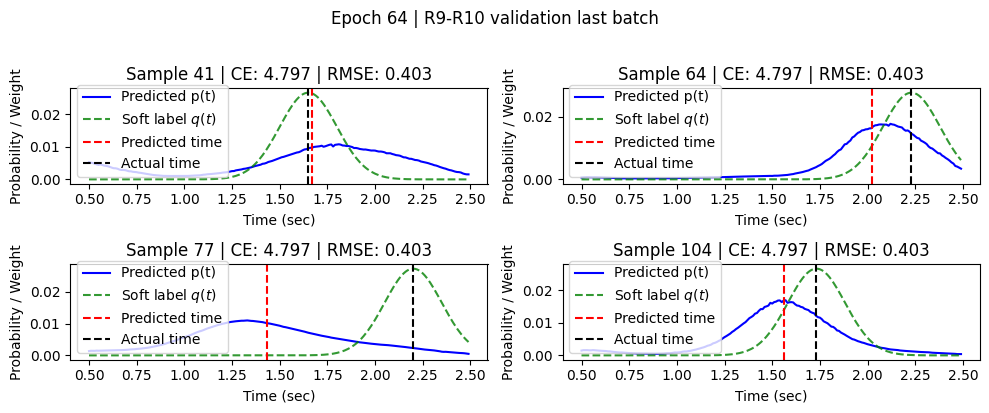

Epoch 65/120: 

Epoch 65 [147/147] Loss 5.9602 CE 4.8780 RMSE 0.3607 KL 0.0000 WASS 0.0000 NRMSE 0.8903 Entropy 4.914: 100%|██████████| 147/147 [00:11<00:00, 12.54it/s]


NRMSE: 0.8903 Total loss: 880.9106 Total CE: 721.4530 Total RMSE: 53.1525 Total KL: 0.0000 Total WASS: 0.0000


Val [70/70] Loss 5.1923 CE 4.7916 RMSE 0.4007 NRMSE 0.9391: 100%|██████████| 70/70 [00:03<00:00, 21.12it/s]


Val NRMSE: 939.117, Val Loss: 5.245504, Val CE: 4.868152, Val RMSE: 0.377352
mean bias (s): 0.07704917341470718


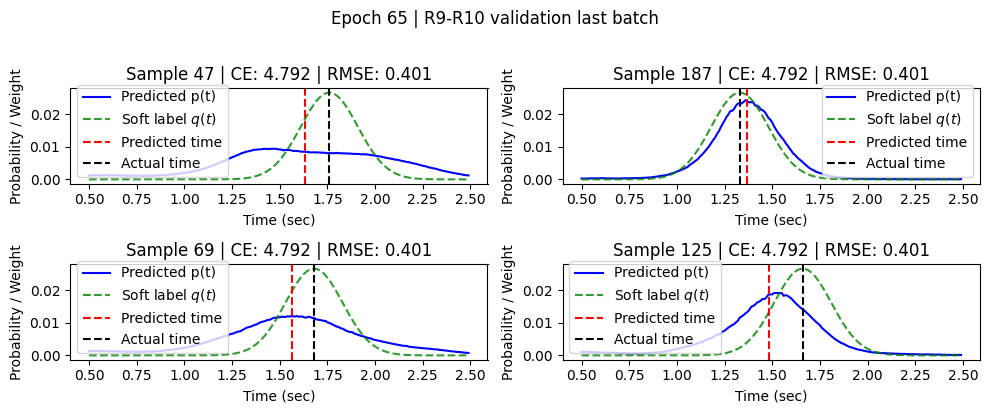

Epoch 66/120: 

Epoch 66 [147/147] Loss 6.1517 CE 4.9462 RMSE 0.4018 KL 0.0000 WASS 0.0000 NRMSE 0.8903 Entropy 4.909: 100%|██████████| 147/147 [00:11<00:00, 12.51it/s]


NRMSE: 0.8903 Total loss: 880.9979 Total CE: 721.5250 Total RMSE: 53.1576 Total KL: 0.0000 Total WASS: 0.0000


Val [70/70] Loss 5.1954 CE 4.7930 RMSE 0.4024 NRMSE 0.9415: 100%|██████████| 70/70 [00:03<00:00, 21.14it/s]


Val NRMSE: 941.487, Val Loss: 5.252025, Val CE: 4.873586, Val RMSE: 0.378438
mean bias (s): 0.07745612412691116


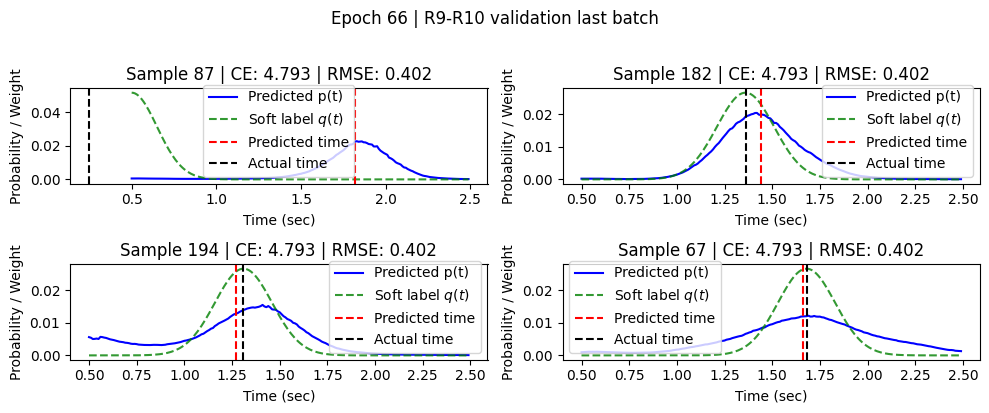

Epoch 67/120: 

Epoch 67 [147/147] Loss 5.9675 CE 4.8924 RMSE 0.3584 KL 0.0000 WASS 0.0000 NRMSE 0.8882 Entropy 4.902: 100%|██████████| 147/147 [00:11<00:00, 12.54it/s]


NRMSE: 0.8882 Total loss: 880.1618 Total CE: 721.1174 Total RMSE: 53.0148 Total KL: 0.0000 Total WASS: 0.0000


Val [70/70] Loss 5.1848 CE 4.7820 RMSE 0.4028 NRMSE 0.9415: 100%|██████████| 70/70 [00:03<00:00, 21.11it/s]


Val NRMSE: 941.457, Val Loss: 5.242979, Val CE: 4.864692, Val RMSE: 0.378288
mean bias (s): 0.07552619278430939


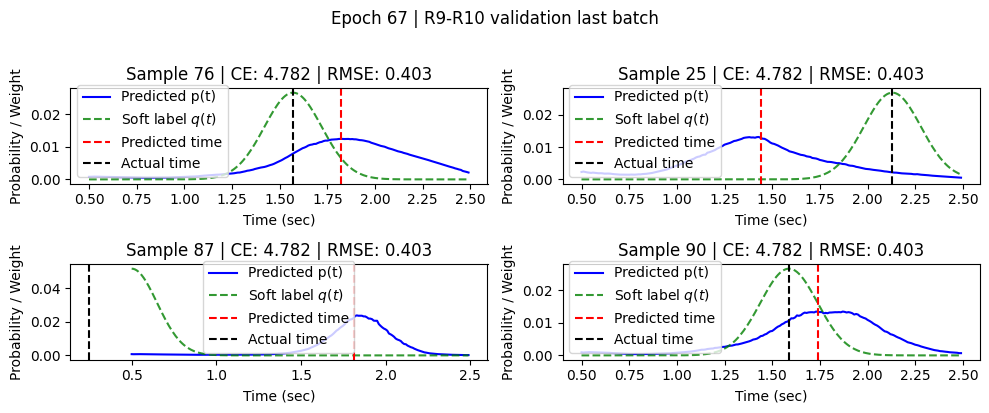

Epoch 68/120: 

Epoch 68 [147/147] Loss 5.9362 CE 4.9052 RMSE 0.3437 KL 0.0000 WASS 0.0000 NRMSE 0.8898 Entropy 4.899: 100%|██████████| 147/147 [00:11<00:00, 12.54it/s]


NRMSE: 0.8898 Total loss: 880.7363 Total CE: 721.5641 Total RMSE: 53.0574 Total KL: 0.0000 Total WASS: 0.0000


Val [70/70] Loss 5.1959 CE 4.7916 RMSE 0.4043 NRMSE 0.9445: 100%|██████████| 70/70 [00:03<00:00, 20.96it/s]


Val NRMSE: 944.497, Val Loss: 5.251117, Val CE: 4.871291, Val RMSE: 0.379826
mean bias (s): 0.07275398820638657


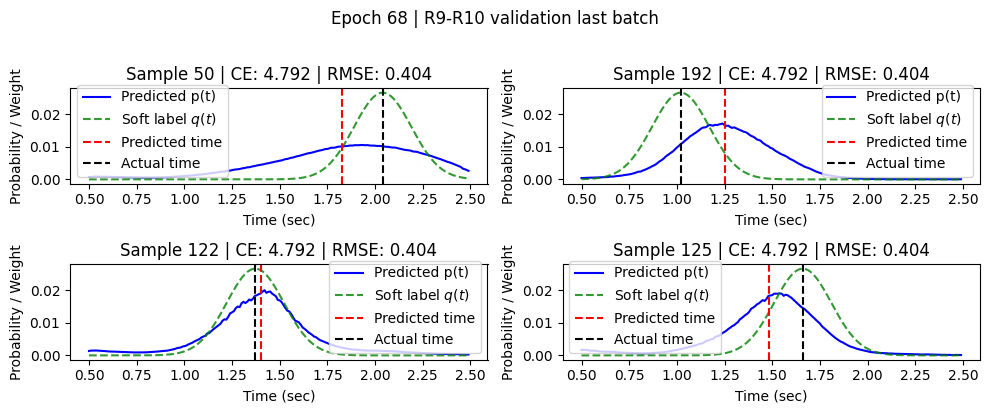

Restart from checkpoint ../../artifacts/RecurrentSneddyUnet__ch126_c32_w1p5_st3_d1-1-1_k7_bnrnn_bd2_drop0p1_dp0p0_sg0_rnngru_bi1_hm1p0_rpb1_brl1_rdrop0p05_dwpos1__bs512__lr0p001__sig0p15__tau0p65__lt3p0_ce0__20260612_185612/best_model.pth. Best Val NRMSE: 929.449144 (epoch 23)
Updating learning rate 0.00025 -> 0.000125
Epoch 69/120: 

Epoch 69 [147/147] Loss 6.0647 CE 4.8920 RMSE 0.3909 KL 0.0000 WASS 0.0000 NRMSE 0.9006 Entropy 4.893: 100%|██████████| 147/147 [00:11<00:00, 12.60it/s]


NRMSE: 0.9006 Total loss: 884.3457 Total CE: 723.0041 Total RMSE: 53.7805 Total KL: 0.0000 Total WASS: 0.0000


Val [70/70] Loss 5.1855 CE 4.7858 RMSE 0.3997 NRMSE 0.9381: 100%|██████████| 70/70 [00:03<00:00, 21.13it/s]


Val NRMSE: 938.085, Val Loss: 5.243190, Val CE: 4.866091, Val RMSE: 0.377099
mean bias (s): 0.0733288824558258


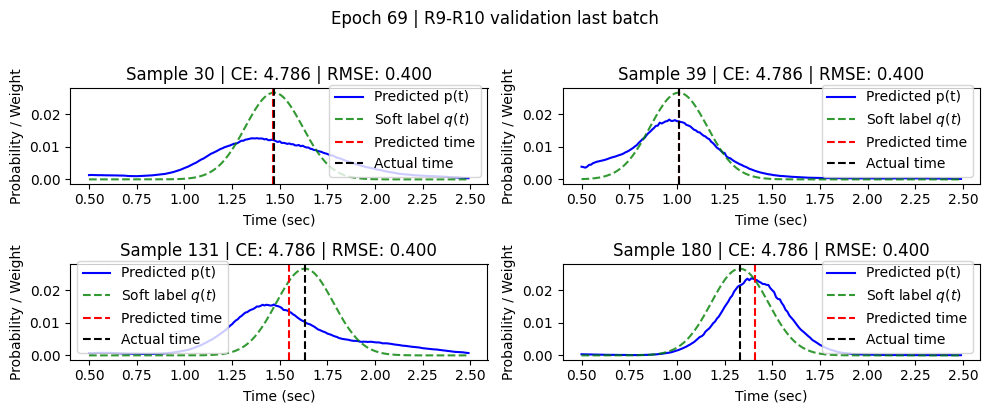

Epoch 70/120: 

Epoch 70 [147/147] Loss 5.8815 CE 4.8617 RMSE 0.3400 KL 0.0000 WASS 0.0000 NRMSE 0.8994 Entropy 4.908: 100%|██████████| 147/147 [00:11<00:00, 12.71it/s]


NRMSE: 0.8994 Total loss: 883.6444 Total CE: 722.7035 Total RMSE: 53.6469 Total KL: 0.0000 Total WASS: 0.0000


Val [70/70] Loss 5.1901 CE 4.7897 RMSE 0.4004 NRMSE 0.9362: 100%|██████████| 70/70 [00:03<00:00, 20.76it/s]


Val NRMSE: 936.246, Val Loss: 5.237720, Val CE: 4.861866, Val RMSE: 0.375854
mean bias (s): 0.08021117746829987


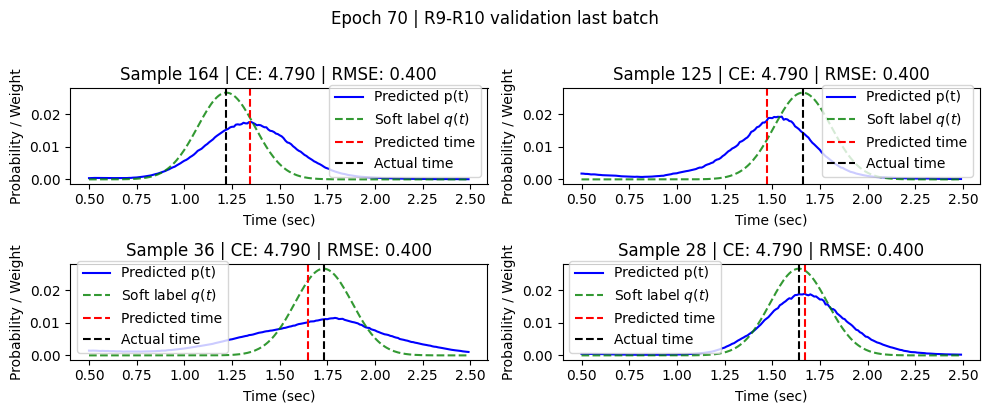

Epoch 71/120: 

Epoch 71 [147/147] Loss 5.9904 CE 4.8853 RMSE 0.3684 KL 0.0000 WASS 0.0000 NRMSE 0.8963 Entropy 4.926: 100%|██████████| 147/147 [00:15<00:00,  9.77it/s]


NRMSE: 0.8963 Total loss: 883.1559 Total CE: 722.6360 Total RMSE: 53.5066 Total KL: 0.0000 Total WASS: 0.0000


Val [70/70] Loss 5.1833 CE 4.7838 RMSE 0.3995 NRMSE 0.9395: 100%|██████████| 70/70 [00:03<00:00, 20.67it/s]


Val NRMSE: 939.457, Val Loss: 5.242596, Val CE: 4.865059, Val RMSE: 0.377537
mean bias (s): 0.06986137479543686


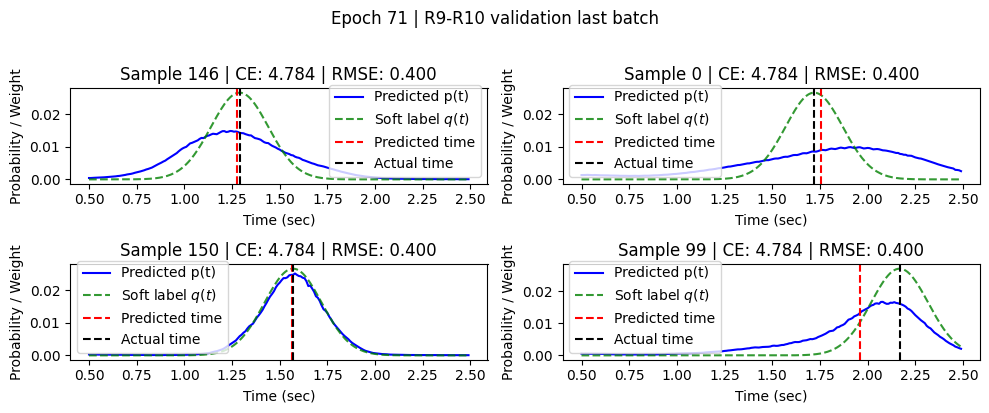

Epoch 72/120: 

Epoch 72 [147/147] Loss 6.1464 CE 4.9746 RMSE 0.3906 KL 0.0000 WASS 0.0000 NRMSE 0.8972 Entropy 4.897: 100%|██████████| 147/147 [00:12<00:00, 11.88it/s]


NRMSE: 0.8972 Total loss: 883.0104 Total CE: 722.3878 Total RMSE: 53.5409 Total KL: 0.0000 Total WASS: 0.0000


Val [70/70] Loss 5.1917 CE 4.7915 RMSE 0.4002 NRMSE 0.9354: 100%|██████████| 70/70 [00:03<00:00, 20.88it/s]


Val NRMSE: 935.447, Val Loss: 5.235017, Val CE: 4.859906, Val RMSE: 0.375111
mean bias (s): 0.0887916088104248


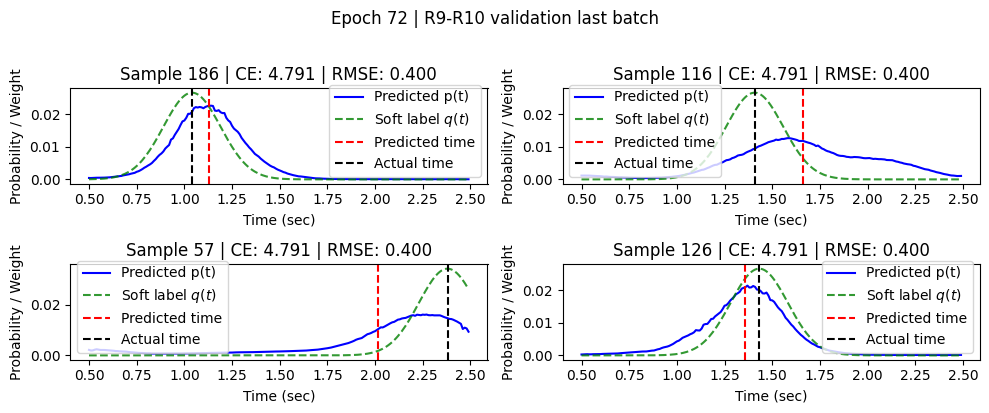

Epoch 73/120: 

Epoch 73 [147/147] Loss 6.0020 CE 4.8934 RMSE 0.3695 KL 0.0000 WASS 0.0000 NRMSE 0.8979 Entropy 4.931: 100%|██████████| 147/147 [00:12<00:00, 11.82it/s]


NRMSE: 0.8979 Total loss: 883.2035 Total CE: 722.4654 Total RMSE: 53.5794 Total KL: 0.0000 Total WASS: 0.0000


Val [70/70] Loss 5.1908 CE 4.7896 RMSE 0.4012 NRMSE 0.9362: 100%|██████████| 70/70 [00:03<00:00, 20.44it/s]


Val NRMSE: 936.179, Val Loss: 5.236755, Val CE: 4.860668, Val RMSE: 0.376088
mean bias (s): 0.07673326879739761


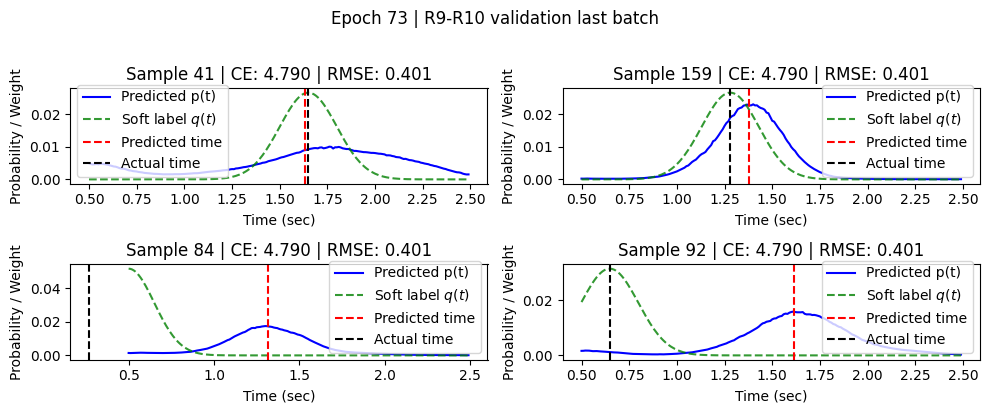

Epoch 74/120: 

Epoch 74 [147/147] Loss 6.0591 CE 4.9210 RMSE 0.3794 KL 0.0000 WASS 0.0000 NRMSE 0.8965 Entropy 4.902: 100%|██████████| 147/147 [00:12<00:00, 11.44it/s]


NRMSE: 0.8965 Total loss: 882.6772 Total CE: 722.2190 Total RMSE: 53.4861 Total KL: 0.0000 Total WASS: 0.0000


Val [70/70] Loss 5.1774 CE 4.7794 RMSE 0.3980 NRMSE 0.9376: 100%|██████████| 70/70 [00:03<00:00, 20.63it/s]


Val NRMSE: 937.594, Val Loss: 5.241255, Val CE: 4.864647, Val RMSE: 0.376608
mean bias (s): 0.07383415848016739


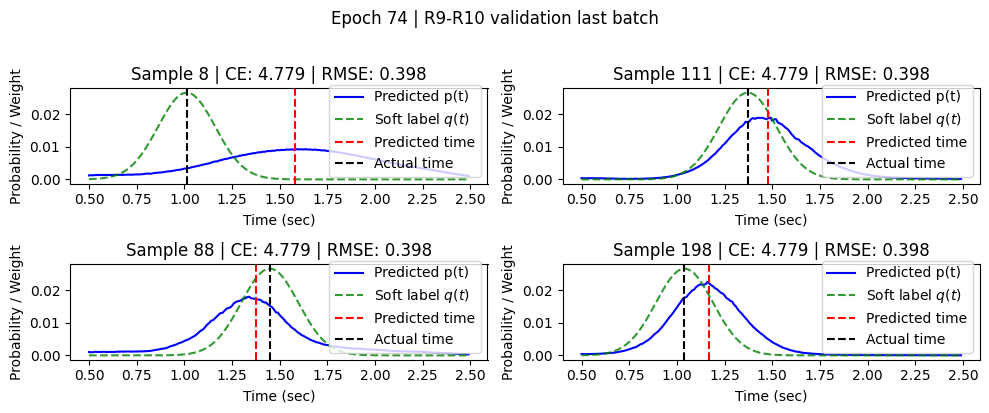

Epoch 75/120: 

Epoch 75 [147/147] Loss 6.0899 CE 4.9520 RMSE 0.3793 KL 0.0000 WASS 0.0000 NRMSE 0.8946 Entropy 4.971: 100%|██████████| 147/147 [00:12<00:00, 12.02it/s]


NRMSE: 0.8946 Total loss: 882.3936 Total CE: 722.1779 Total RMSE: 53.4052 Total KL: 0.0000 Total WASS: 0.0000


Val [70/70] Loss 5.1858 CE 4.7864 RMSE 0.3994 NRMSE 0.9386: 100%|██████████| 70/70 [00:03<00:00, 20.76it/s]


Val NRMSE: 938.595, Val Loss: 5.244213, Val CE: 4.867095, Val RMSE: 0.377119
mean bias (s): 0.07218349725008011


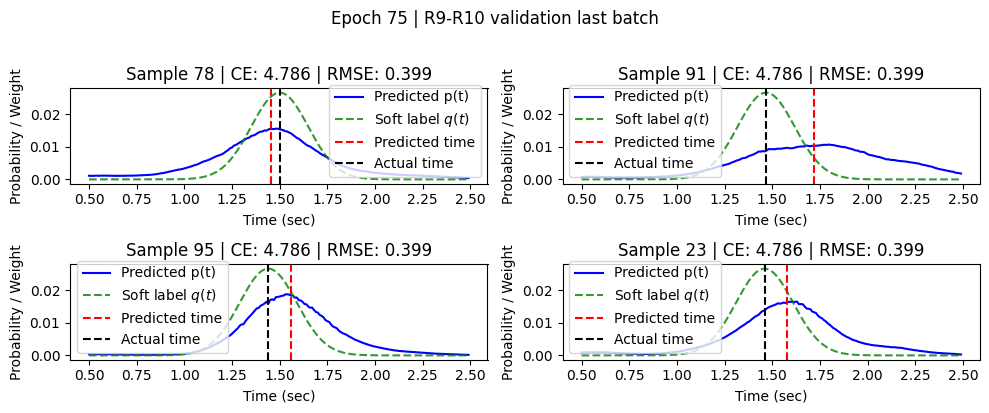

Epoch 76/120: 

Epoch 76 [147/147] Loss 6.0496 CE 4.9235 RMSE 0.3754 KL 0.0000 WASS 0.0000 NRMSE 0.8957 Entropy 4.908: 100%|██████████| 147/147 [00:12<00:00, 11.89it/s]


NRMSE: 0.8957 Total loss: 882.7890 Total CE: 722.4097 Total RMSE: 53.4597 Total KL: 0.0000 Total WASS: 0.0000


Val [70/70] Loss 5.1883 CE 4.7889 RMSE 0.3995 NRMSE 0.9382: 100%|██████████| 70/70 [00:03<00:00, 20.73it/s]


Val NRMSE: 938.233, Val Loss: 5.242051, Val CE: 4.865541, Val RMSE: 0.376510
mean bias (s): 0.08166489005088806


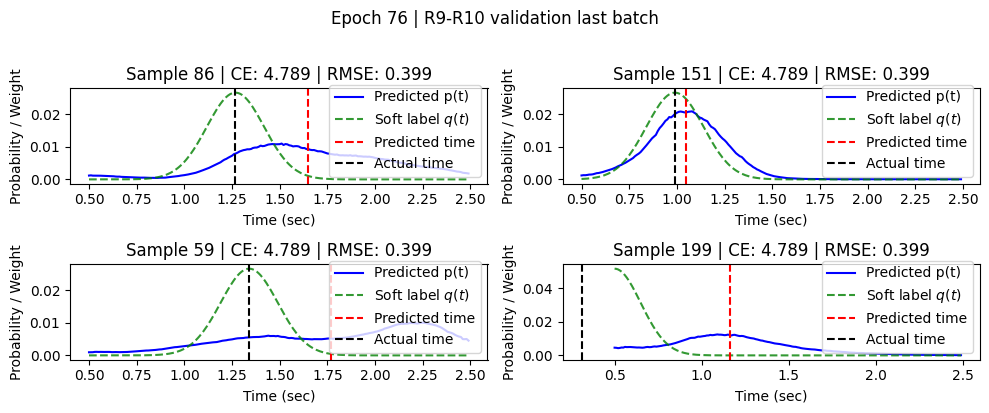

Epoch 77/120: 

Epoch 77 [147/147] Loss 6.0286 CE 4.9319 RMSE 0.3656 KL 0.0000 WASS 0.0000 NRMSE 0.8939 Entropy 4.918: 100%|██████████| 147/147 [00:12<00:00, 12.03it/s]


NRMSE: 0.8939 Total loss: 882.1814 Total CE: 721.9488 Total RMSE: 53.4109 Total KL: 0.0000 Total WASS: 0.0000


Val [70/70] Loss 5.1828 CE 4.7827 RMSE 0.4001 NRMSE 0.9395: 100%|██████████| 70/70 [00:03<00:00, 20.97it/s]


Val NRMSE: 939.475, Val Loss: 5.240964, Val CE: 4.863376, Val RMSE: 0.377588
mean bias (s): 0.07484520971775055


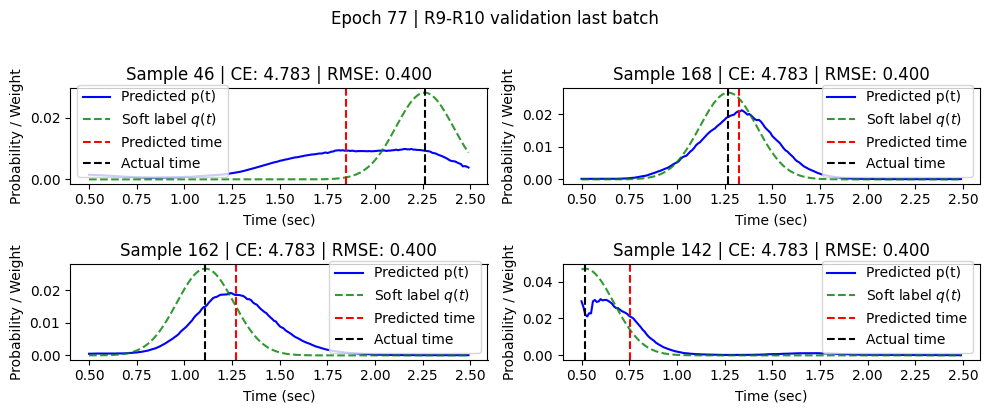

Epoch 78/120: 

Epoch 78 [147/147] Loss 6.0813 CE 4.9162 RMSE 0.3884 KL 0.0000 WASS 0.0000 NRMSE 0.8903 Entropy 4.895: 100%|██████████| 147/147 [00:12<00:00, 11.92it/s]


NRMSE: 0.8903 Total loss: 880.7384 Total CE: 721.5346 Total RMSE: 53.0679 Total KL: 0.0000 Total WASS: 0.0000


Val [70/70] Loss 5.1841 CE 4.7849 RMSE 0.3992 NRMSE 0.9424: 100%|██████████| 70/70 [00:03<00:00, 20.89it/s]


Val NRMSE: 942.391, Val Loss: 5.249902, Val CE: 4.871243, Val RMSE: 0.378660
mean bias (s): 0.07303944230079651


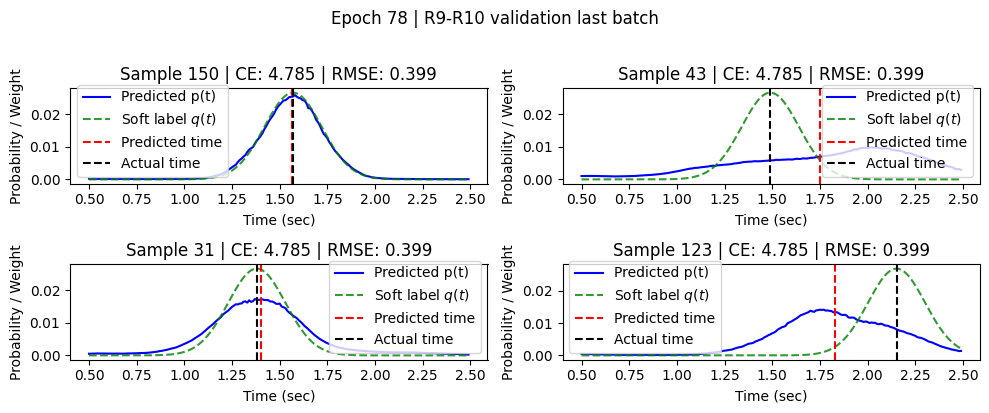

Epoch 79/120: 

Epoch 79 [147/147] Loss 6.0049 CE 4.9122 RMSE 0.3642 KL 0.0000 WASS 0.0000 NRMSE 0.8925 Entropy 4.877: 100%|██████████| 147/147 [00:12<00:00, 12.11it/s]


NRMSE: 0.8925 Total loss: 881.3450 Total CE: 721.5470 Total RMSE: 53.2660 Total KL: 0.0000 Total WASS: 0.0000


Val [70/70] Loss 5.1817 CE 4.7832 RMSE 0.3985 NRMSE 0.9420: 100%|██████████| 70/70 [00:03<00:00, 20.52it/s]


Val NRMSE: 942.048, Val Loss: 5.248855, Val CE: 4.870275, Val RMSE: 0.378581
mean bias (s): 0.0772399827837944


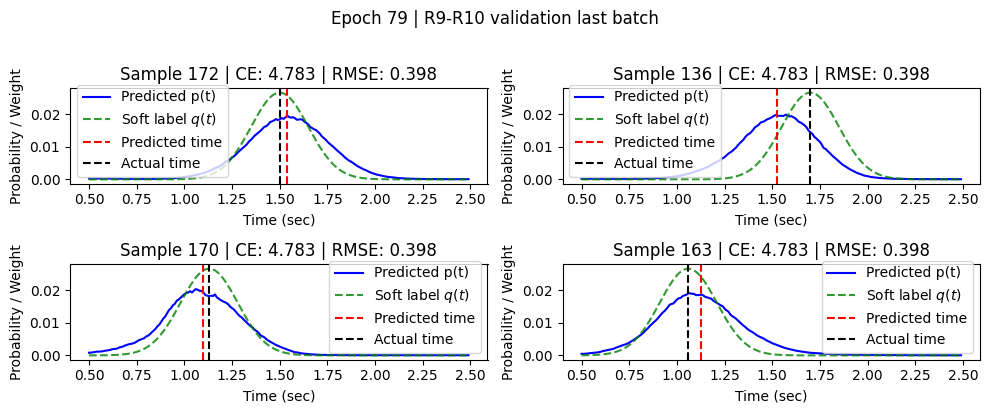

Epoch 80/120: 

Epoch 80 [147/147] Loss 6.0640 CE 4.9266 RMSE 0.3791 KL 0.0000 WASS 0.0000 NRMSE 0.8930 Entropy 4.912: 100%|██████████| 147/147 [00:12<00:00, 12.02it/s]


NRMSE: 0.8930 Total loss: 882.0747 Total CE: 722.1181 Total RMSE: 53.3189 Total KL: 0.0000 Total WASS: 0.0000


Val [70/70] Loss 5.1918 CE 4.7907 RMSE 0.4011 NRMSE 0.9412: 100%|██████████| 70/70 [00:03<00:00, 20.98it/s]


Val NRMSE: 941.212, Val Loss: 5.244448, Val CE: 4.866471, Val RMSE: 0.377977
mean bias (s): 0.08595740795135498


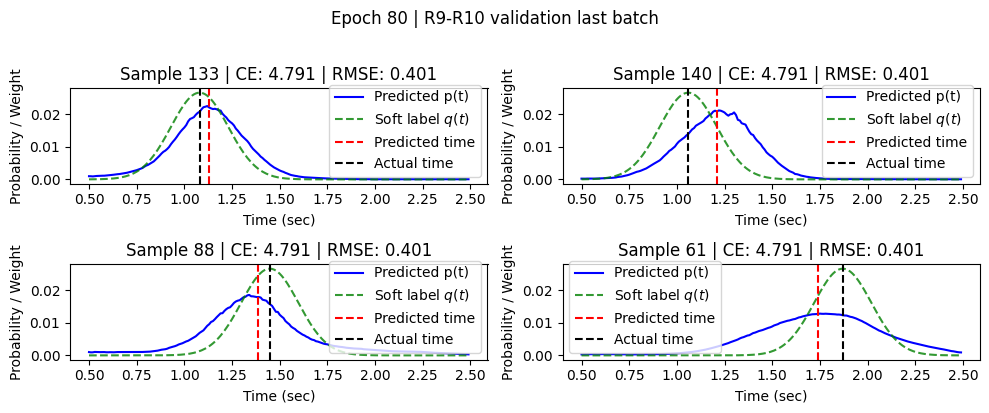

Epoch 81/120: 

Epoch 81 [147/147] Loss 5.9833 CE 4.9224 RMSE 0.3536 KL 0.0000 WASS 0.0000 NRMSE 0.8935 Entropy 4.904: 100%|██████████| 147/147 [00:11<00:00, 12.29it/s]


NRMSE: 0.8935 Total loss: 881.8710 Total CE: 721.9186 Total RMSE: 53.3174 Total KL: 0.0000 Total WASS: 0.0000


Val [70/70] Loss 5.1992 CE 4.7955 RMSE 0.4037 NRMSE 0.9449: 100%|██████████| 70/70 [00:03<00:00, 20.90it/s]


Val NRMSE: 944.892, Val Loss: 5.249809, Val CE: 4.869807, Val RMSE: 0.380001
mean bias (s): 0.0765966847538948


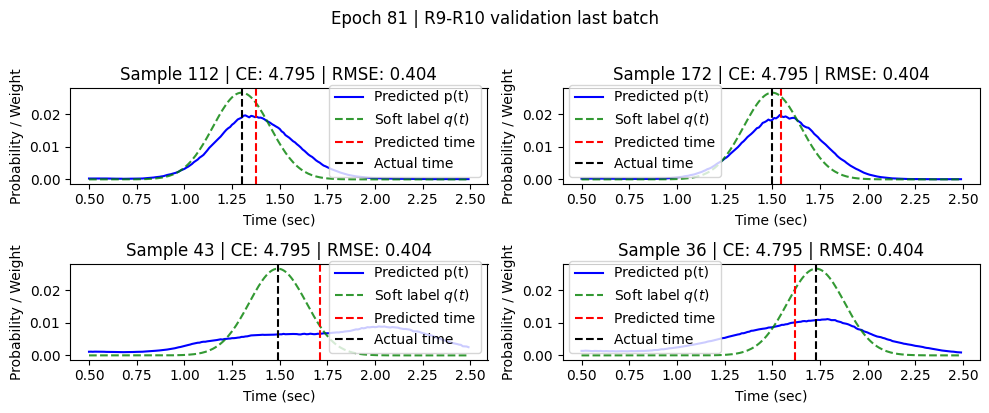

Epoch 82/120: 

Epoch 82 [147/147] Loss 6.0217 CE 4.8949 RMSE 0.3756 KL 0.0000 WASS 0.0000 NRMSE 0.8914 Entropy 4.918: 100%|██████████| 147/147 [00:12<00:00, 12.13it/s]


NRMSE: 0.8914 Total loss: 881.4648 Total CE: 721.6492 Total RMSE: 53.2719 Total KL: 0.0000 Total WASS: 0.0000


Val [70/70] Loss 5.1917 CE 4.7901 RMSE 0.4016 NRMSE 0.9397: 100%|██████████| 70/70 [00:03<00:00, 20.24it/s]


Val NRMSE: 939.672, Val Loss: 5.240284, Val CE: 4.863111, Val RMSE: 0.377173
mean bias (s): 0.08473242074251175


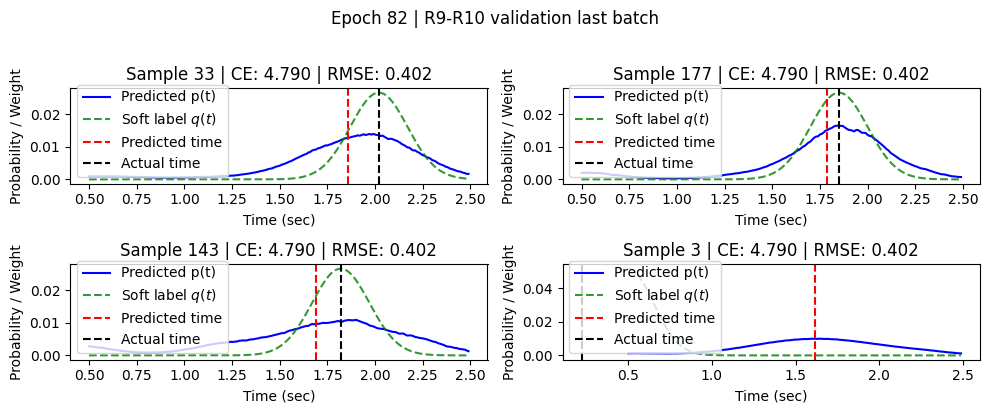

Epoch 83/120: 

Epoch 83 [147/147] Loss 6.2624 CE 5.0103 RMSE 0.4174 KL 0.0000 WASS 0.0000 NRMSE 0.8936 Entropy 4.927: 100%|██████████| 147/147 [00:12<00:00, 11.74it/s]


NRMSE: 0.8936 Total loss: 882.0514 Total CE: 721.8490 Total RMSE: 53.4008 Total KL: 0.0000 Total WASS: 0.0000


Val [70/70] Loss 5.1789 CE 4.7802 RMSE 0.3987 NRMSE 0.9417: 100%|██████████| 70/70 [00:03<00:00, 21.04it/s]


Val NRMSE: 941.692, Val Loss: 5.246200, Val CE: 4.867534, Val RMSE: 0.378666
mean bias (s): 0.07213158160448074


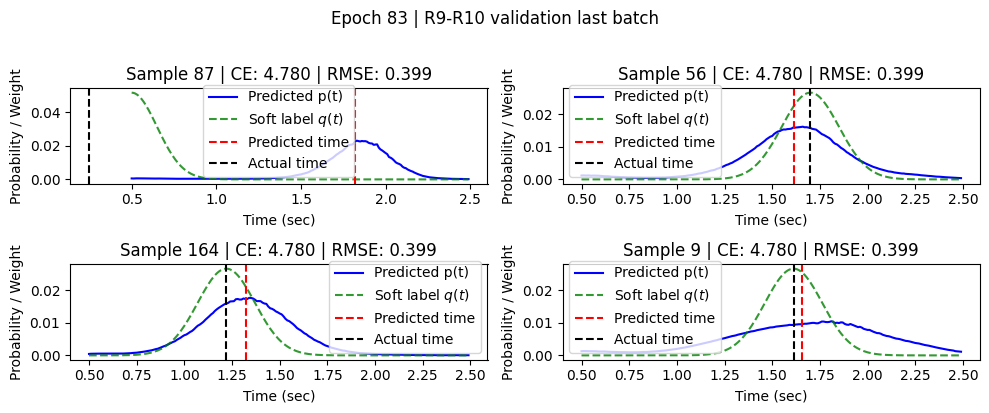

Restart from checkpoint ../../artifacts/RecurrentSneddyUnet__ch126_c32_w1p5_st3_d1-1-1_k7_bnrnn_bd2_drop0p1_dp0p0_sg0_rnngru_bi1_hm1p0_rpb1_brl1_rdrop0p05_dwpos1__bs512__lr0p001__sig0p15__tau0p65__lt3p0_ce0__20260612_185612/best_model.pth. Best Val NRMSE: 929.449144 (epoch 23)
Updating learning rate 0.000125 -> 6.25e-05
Epoch 84/120: 

Epoch 84 [147/147] Loss 6.0567 CE 4.9486 RMSE 0.3694 KL 0.0000 WASS 0.0000 NRMSE 0.9034 Entropy 4.943: 100%|██████████| 147/147 [00:12<00:00, 12.13it/s]


NRMSE: 0.9034 Total loss: 885.0457 Total CE: 723.3552 Total RMSE: 53.8968 Total KL: 0.0000 Total WASS: 0.0000


Val [70/70] Loss 5.1917 CE 4.7891 RMSE 0.4025 NRMSE 0.9345: 100%|██████████| 70/70 [00:03<00:00, 20.93it/s]


Val NRMSE: 934.488, Val Loss: 5.235979, Val CE: 4.860500, Val RMSE: 0.375479
mean bias (s): 0.07538756728172302


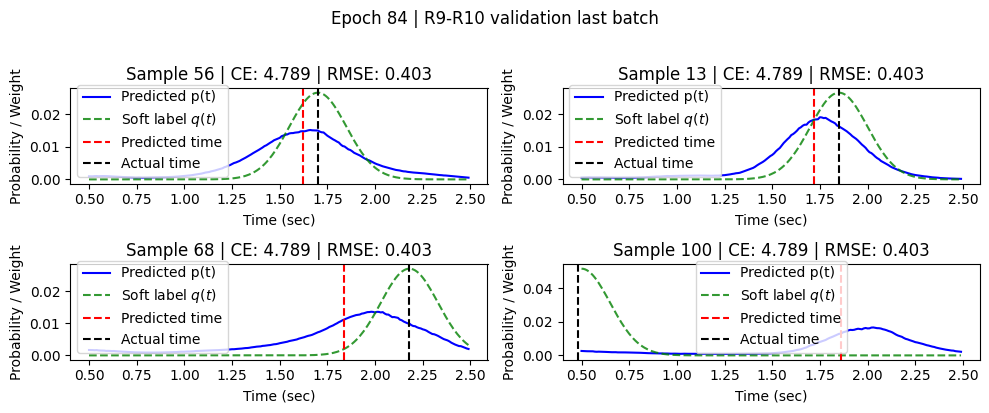

Epoch 85/120: 

Epoch 85 [147/147] Loss 6.0123 CE 4.9115 RMSE 0.3669 KL 0.0000 WASS 0.0000 NRMSE 0.8999 Entropy 4.907: 100%|██████████| 147/147 [00:12<00:00, 12.23it/s]


NRMSE: 0.8999 Total loss: 883.9752 Total CE: 722.9427 Total RMSE: 53.6775 Total KL: 0.0000 Total WASS: 0.0000


Val [70/70] Loss 5.1893 CE 4.7884 RMSE 0.4008 NRMSE 0.9355: 100%|██████████| 70/70 [00:03<00:00, 20.84it/s]


Val NRMSE: 935.483, Val Loss: 5.237573, Val CE: 4.861832, Val RMSE: 0.375741
mean bias (s): 0.07613653689622879


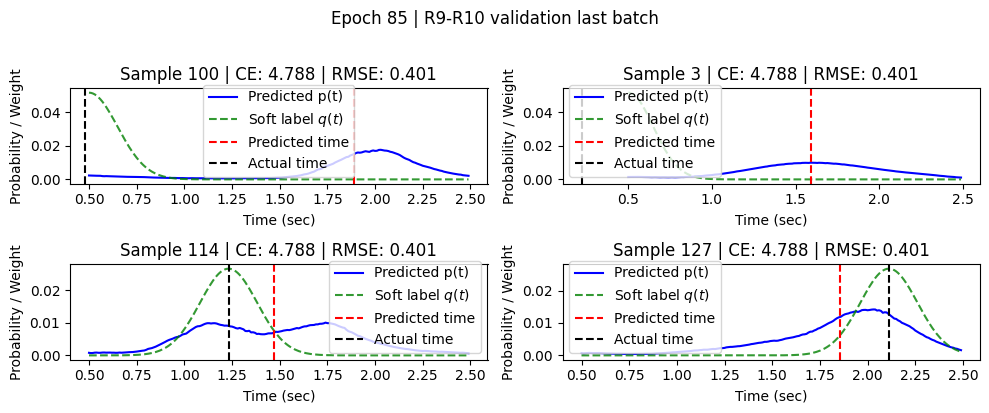

Epoch 86/120: 

Epoch 86 [147/147] Loss 5.9631 CE 4.9124 RMSE 0.3502 KL 0.0000 WASS 0.0000 NRMSE 0.8968 Entropy 4.914: 100%|██████████| 147/147 [00:11<00:00, 12.38it/s]


NRMSE: 0.8968 Total loss: 882.8541 Total CE: 722.3505 Total RMSE: 53.5012 Total KL: 0.0000 Total WASS: 0.0000


Val [70/70] Loss 5.1910 CE 4.7894 RMSE 0.4015 NRMSE 0.9376: 100%|██████████| 70/70 [00:03<00:00, 21.11it/s]


Val NRMSE: 937.622, Val Loss: 5.239196, Val CE: 4.862456, Val RMSE: 0.376740
mean bias (s): 0.07544995099306107


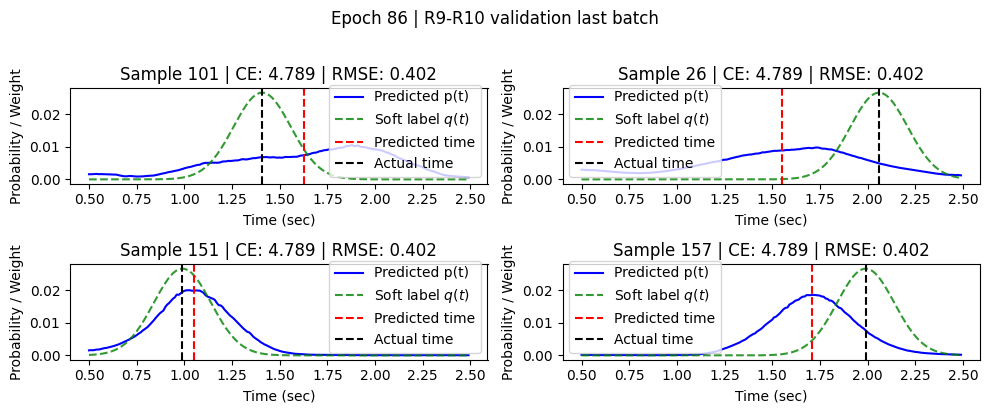

Epoch 87/120: 

Epoch 87 [147/147] Loss 5.9457 CE 4.8964 RMSE 0.3498 KL 0.0000 WASS 0.0000 NRMSE 0.8975 Entropy 4.929: 100%|██████████| 147/147 [00:12<00:00, 12.05it/s]


NRMSE: 0.8975 Total loss: 883.5908 Total CE: 722.6617 Total RMSE: 53.6430 Total KL: 0.0000 Total WASS: 0.0000


Val [70/70] Loss 5.1911 CE 4.7895 RMSE 0.4016 NRMSE 0.9363: 100%|██████████| 70/70 [00:03<00:00, 21.04it/s]


Val NRMSE: 936.287, Val Loss: 5.238264, Val CE: 4.862125, Val RMSE: 0.376139
mean bias (s): 0.0784117579460144


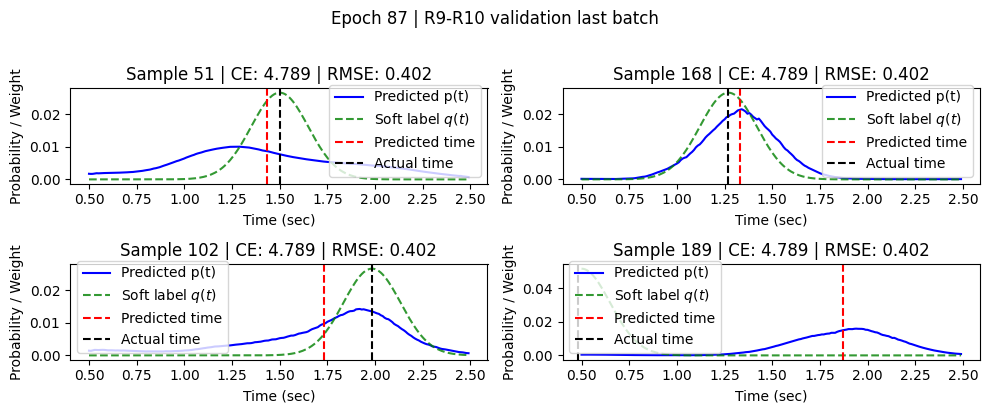

Epoch 88/120: 

Epoch 88 [147/147] Loss 5.9939 CE 4.9124 RMSE 0.3605 KL 0.0000 WASS 0.0000 NRMSE 0.8986 Entropy 4.917: 100%|██████████| 147/147 [00:11<00:00, 12.52it/s]


NRMSE: 0.8986 Total loss: 883.4660 Total CE: 722.7239 Total RMSE: 53.5807 Total KL: 0.0000 Total WASS: 0.0000


Val [70/70] Loss 5.1842 CE 4.7841 RMSE 0.4001 NRMSE 0.9364: 100%|██████████| 70/70 [00:03<00:00, 20.73it/s]


Val NRMSE: 936.403, Val Loss: 5.238046, Val CE: 4.861831, Val RMSE: 0.376215
mean bias (s): 0.07384267449378967


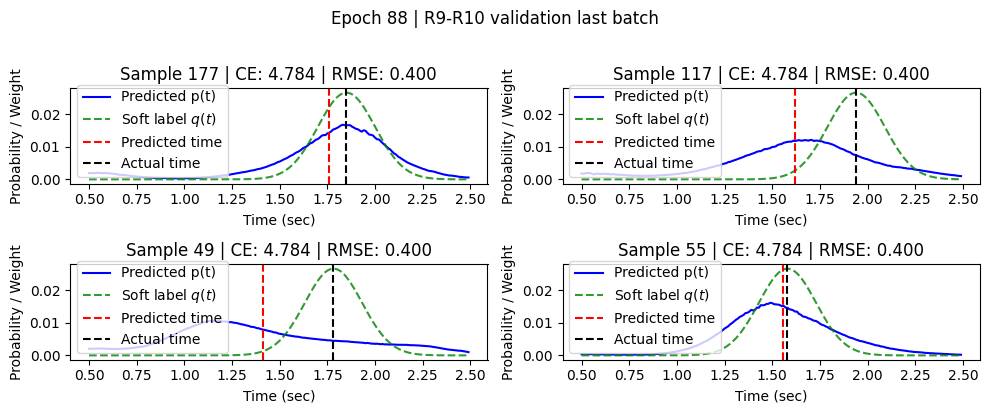

Epoch 89/120: 

Epoch 89 [147/147] Loss 5.9304 CE 4.8963 RMSE 0.3447 KL 0.0000 WASS 0.0000 NRMSE 0.8952 Entropy 4.897: 100%|██████████| 147/147 [00:11<00:00, 12.43it/s]


NRMSE: 0.8952 Total loss: 882.9493 Total CE: 722.3712 Total RMSE: 53.5261 Total KL: 0.0000 Total WASS: 0.0000


Val [70/70] Loss 5.1894 CE 4.7879 RMSE 0.4015 NRMSE 0.9357: 100%|██████████| 70/70 [00:03<00:00, 20.79it/s]


Val NRMSE: 935.677, Val Loss: 5.236378, Val CE: 4.860650, Val RMSE: 0.375727
mean bias (s): 0.08054503798484802


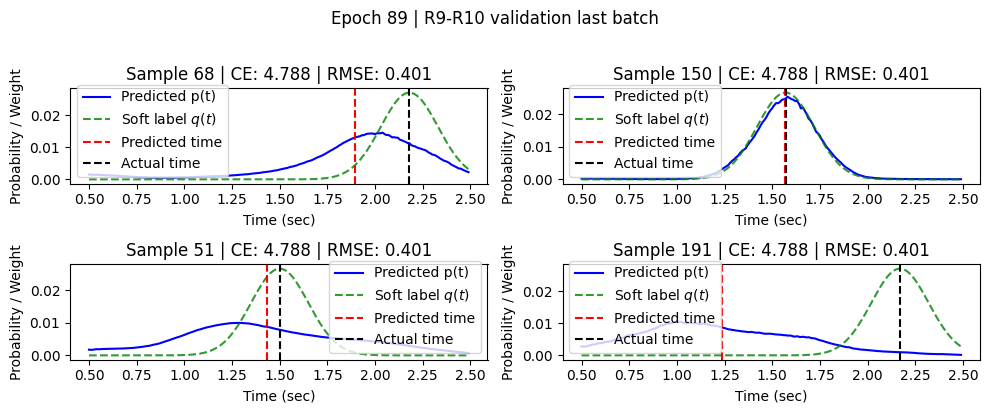

Epoch 90/120: 

Epoch 90 [147/147] Loss 5.8410 CE 4.8662 RMSE 0.3250 KL 0.0000 WASS 0.0000 NRMSE 0.8959 Entropy 4.908: 100%|██████████| 147/147 [00:12<00:00, 11.89it/s]


NRMSE: 0.8959 Total loss: 882.1947 Total CE: 721.9335 Total RMSE: 53.4204 Total KL: 0.0000 Total WASS: 0.0000


Val [70/70] Loss 5.1899 CE 4.7888 RMSE 0.4011 NRMSE 0.9361: 100%|██████████| 70/70 [00:03<00:00, 20.50it/s]


Val NRMSE: 936.127, Val Loss: 5.236981, Val CE: 4.861000, Val RMSE: 0.375981
mean bias (s): 0.08065143972635269


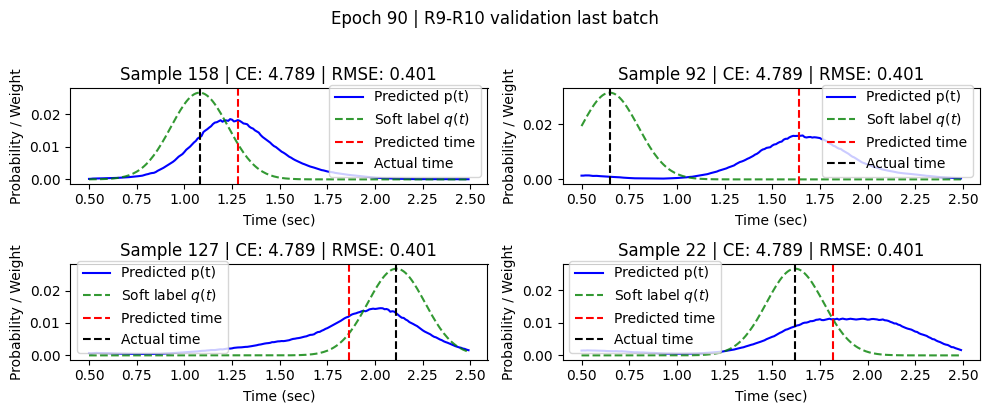

Epoch 91/120: 

Epoch 91 [147/147] Loss 5.9525 CE 4.8638 RMSE 0.3629 KL 0.0000 WASS 0.0000 NRMSE 0.8955 Entropy 4.901: 100%|██████████| 147/147 [00:11<00:00, 12.58it/s]


NRMSE: 0.8955 Total loss: 882.4680 Total CE: 722.1609 Total RMSE: 53.4357 Total KL: 0.0000 Total WASS: 0.0000


Val [70/70] Loss 5.1858 CE 4.7862 RMSE 0.3996 NRMSE 0.9370: 100%|██████████| 70/70 [00:03<00:00, 21.12it/s]


Val NRMSE: 936.959, Val Loss: 5.237650, Val CE: 4.861342, Val RMSE: 0.376308
mean bias (s): 0.07855422049760818


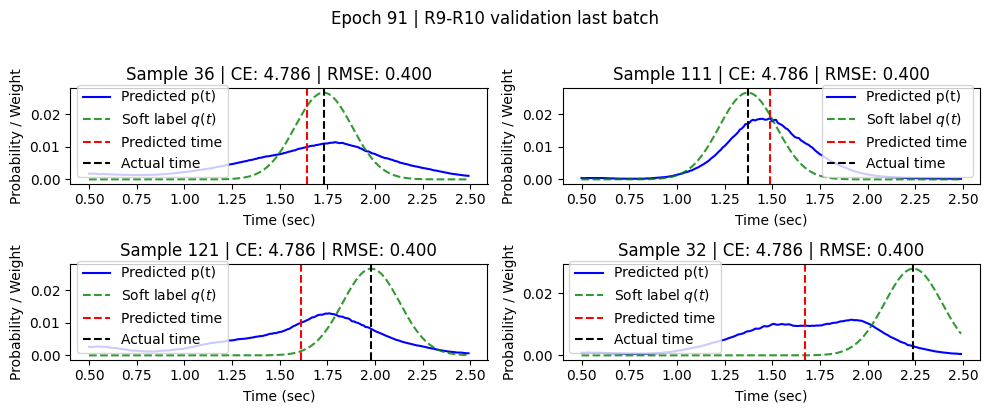

Epoch 92/120: 

Epoch 92 [147/147] Loss 6.0878 CE 4.9627 RMSE 0.3750 KL 0.0000 WASS 0.0000 NRMSE 0.8950 Entropy 4.933: 100%|██████████| 147/147 [00:11<00:00, 12.41it/s]


NRMSE: 0.8950 Total loss: 881.9044 Total CE: 722.0644 Total RMSE: 53.2800 Total KL: 0.0000 Total WASS: 0.0000


Val [70/70] Loss 5.1891 CE 4.7880 RMSE 0.4010 NRMSE 0.9364: 100%|██████████| 70/70 [00:03<00:00, 21.09it/s]


Val NRMSE: 936.352, Val Loss: 5.237445, Val CE: 4.861510, Val RMSE: 0.375935
mean bias (s): 0.08151856064796448


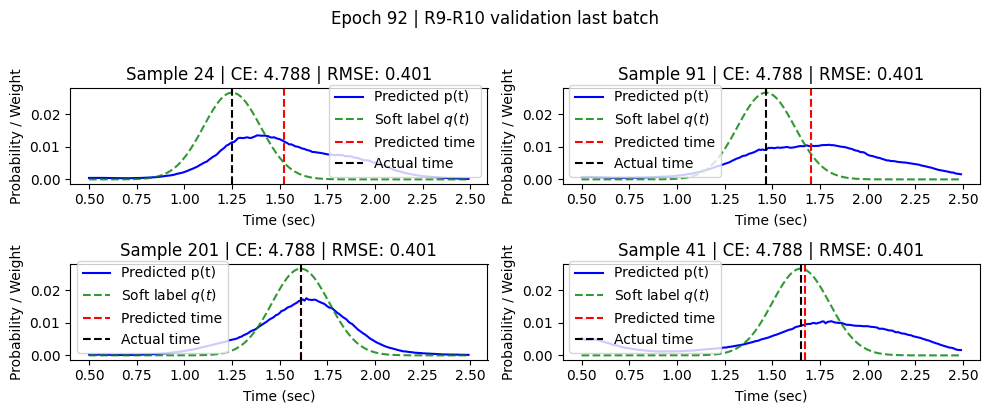

Epoch 93/120: 

Epoch 93 [147/147] Loss 5.9704 CE 4.8871 RMSE 0.3611 KL 0.0000 WASS 0.0000 NRMSE 0.8958 Entropy 4.899: 100%|██████████| 147/147 [00:11<00:00, 12.52it/s]


NRMSE: 0.8958 Total loss: 882.3360 Total CE: 722.0626 Total RMSE: 53.4245 Total KL: 0.0000 Total WASS: 0.0000


Val [70/70] Loss 5.1971 CE 4.7946 RMSE 0.4026 NRMSE 0.9362: 100%|██████████| 70/70 [00:03<00:00, 20.45it/s]


Val NRMSE: 936.158, Val Loss: 5.237842, Val CE: 4.862000, Val RMSE: 0.375842
mean bias (s): 0.08656347543001175


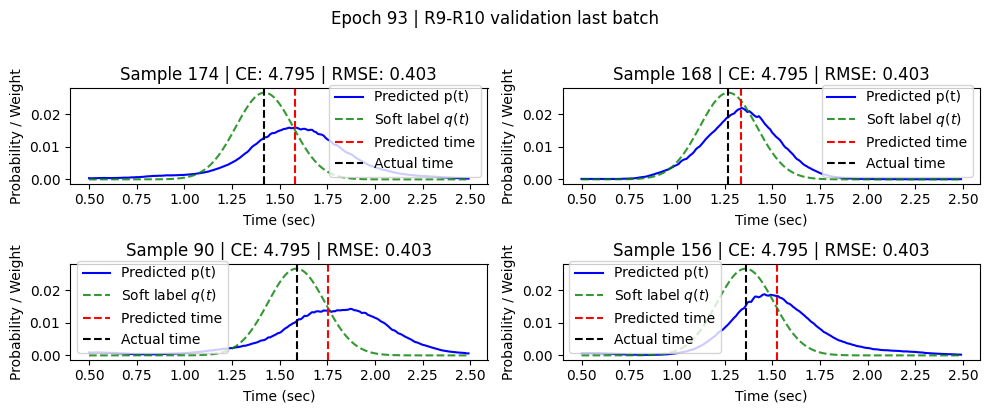

Epoch 94/120: 

Epoch 94 [147/147] Loss 6.0527 CE 4.9305 RMSE 0.3741 KL 0.0000 WASS 0.0000 NRMSE 0.8943 Entropy 4.918: 100%|██████████| 147/147 [00:12<00:00, 11.99it/s]


NRMSE: 0.8943 Total loss: 881.9413 Total CE: 721.8932 Total RMSE: 53.3494 Total KL: 0.0000 Total WASS: 0.0000


Val [70/70] Loss 5.1949 CE 4.7928 RMSE 0.4021 NRMSE 0.9355: 100%|██████████| 70/70 [00:03<00:00, 20.86it/s]


Val NRMSE: 935.531, Val Loss: 5.237524, Val CE: 4.861876, Val RMSE: 0.375648
mean bias (s): 0.07968475669622421


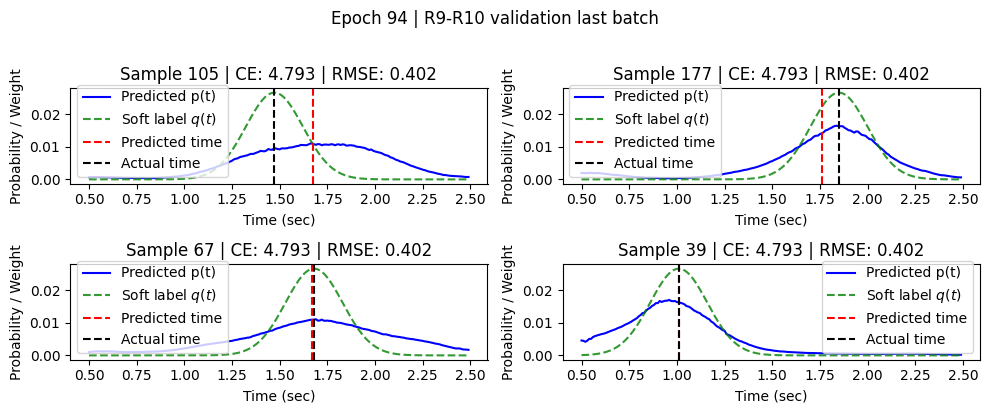

Epoch 95/120: 

Epoch 95 [147/147] Loss 5.9805 CE 4.9095 RMSE 0.3570 KL 0.0000 WASS 0.0000 NRMSE 0.8934 Entropy 4.915: 100%|██████████| 147/147 [00:11<00:00, 12.48it/s]


NRMSE: 0.8934 Total loss: 882.1617 Total CE: 721.9802 Total RMSE: 53.3938 Total KL: 0.0000 Total WASS: 0.0000


Val [70/70] Loss 5.1892 CE 4.7878 RMSE 0.4014 NRMSE 0.9405: 100%|██████████| 70/70 [00:03<00:00, 21.21it/s]


Val NRMSE: 940.543, Val Loss: 5.246622, Val CE: 4.868528, Val RMSE: 0.378094
mean bias (s): 0.07086940854787827


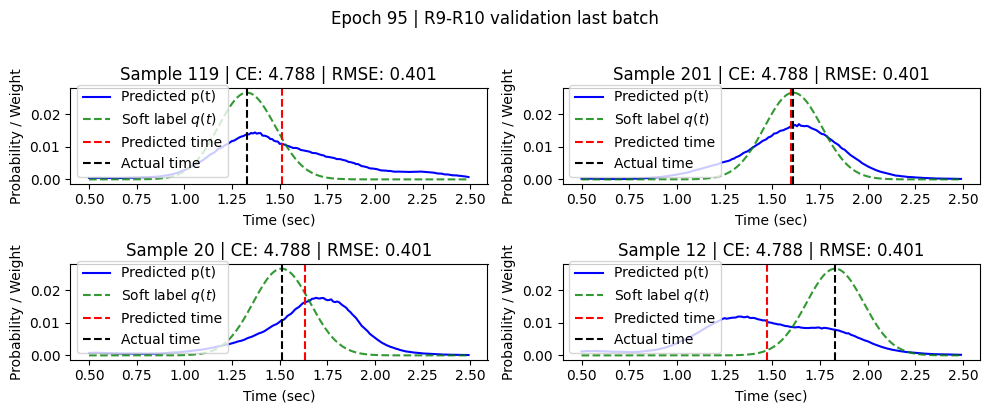

Epoch 96/120: 

Epoch 96 [147/147] Loss 6.1036 CE 4.9497 RMSE 0.3846 KL 0.0000 WASS 0.0000 NRMSE 0.8945 Entropy 4.909: 100%|██████████| 147/147 [00:11<00:00, 12.48it/s]


NRMSE: 0.8945 Total loss: 882.0890 Total CE: 721.9375 Total RMSE: 53.3838 Total KL: 0.0000 Total WASS: 0.0000


Val [70/70] Loss 5.1893 CE 4.7877 RMSE 0.4016 NRMSE 0.9391: 100%|██████████| 70/70 [00:03<00:00, 20.99it/s]


Val NRMSE: 939.115, Val Loss: 5.242921, Val CE: 4.865509, Val RMSE: 0.377412
mean bias (s): 0.07471383363008499


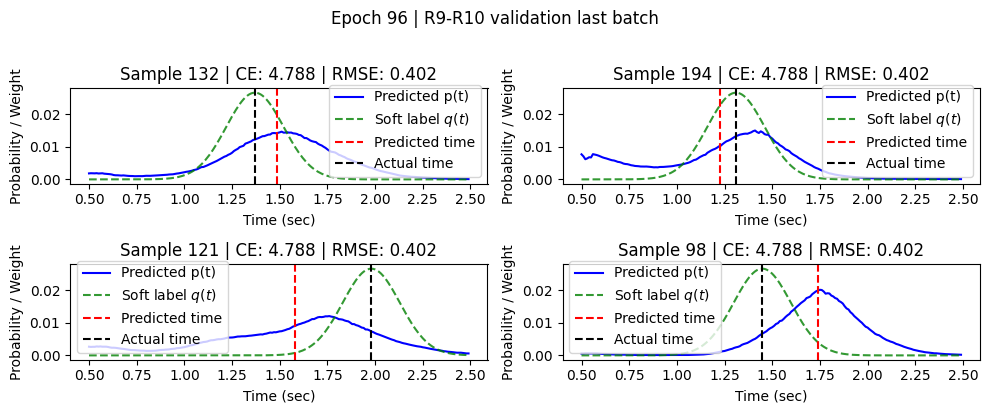

Epoch 97/120: 

Epoch 97 [147/147] Loss 6.0226 CE 4.9104 RMSE 0.3708 KL 0.0000 WASS 0.0000 NRMSE 0.8941 Entropy 4.899: 100%|██████████| 147/147 [00:11<00:00, 12.38it/s]


NRMSE: 0.8941 Total loss: 882.0538 Total CE: 721.8653 Total RMSE: 53.3962 Total KL: 0.0000 Total WASS: 0.0000


Val [70/70] Loss 5.1928 CE 4.7904 RMSE 0.4024 NRMSE 0.9373: 100%|██████████| 70/70 [00:03<00:00, 20.08it/s]


Val NRMSE: 937.264, Val Loss: 5.237850, Val CE: 4.861562, Val RMSE: 0.376288
mean bias (s): 0.08341385424137115


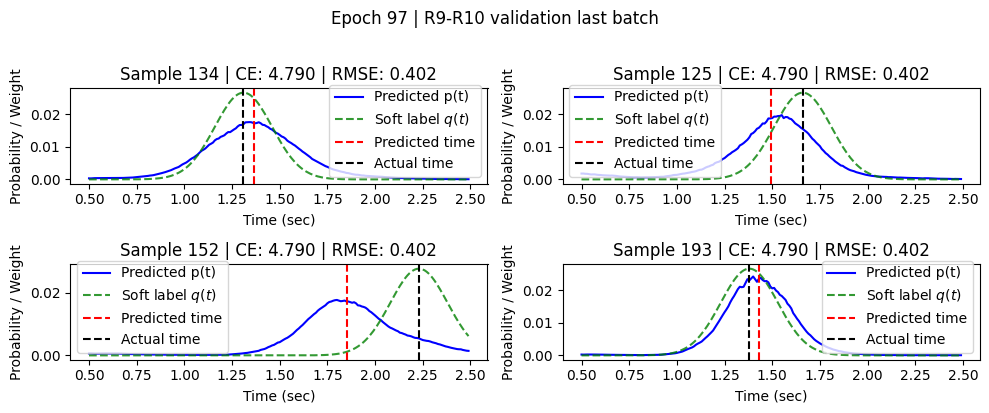

Epoch 98/120: 

Epoch 98 [147/147] Loss 5.8652 CE 4.8546 RMSE 0.3369 KL 0.0000 WASS 0.0000 NRMSE 0.8928 Entropy 4.903: 100%|██████████| 147/147 [00:11<00:00, 12.34it/s]


NRMSE: 0.8928 Total loss: 881.4520 Total CE: 721.6962 Total RMSE: 53.2519 Total KL: 0.0000 Total WASS: 0.0000


Val [70/70] Loss 5.1993 CE 4.7951 RMSE 0.4042 NRMSE 0.9345: 100%|██████████| 70/70 [00:03<00:00, 21.20it/s]


Val NRMSE: 934.465, Val Loss: 5.233931, Val CE: 4.858853, Val RMSE: 0.375077
mean bias (s): 0.08498605340719223


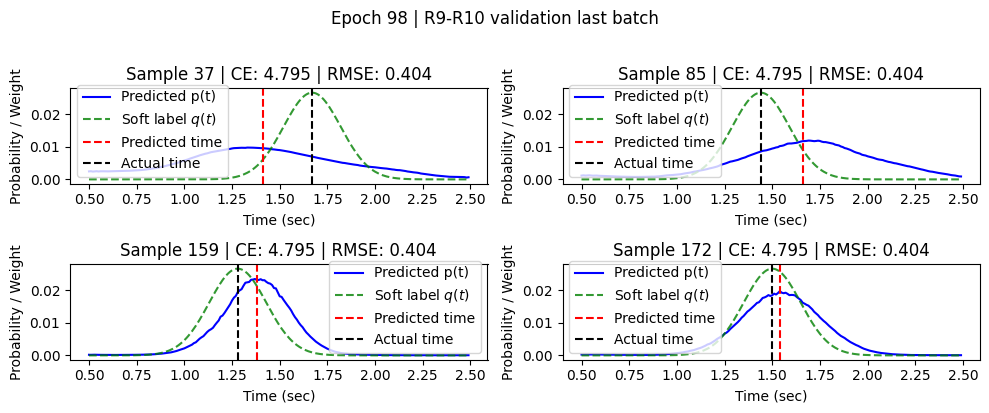

Restart from checkpoint ../../artifacts/RecurrentSneddyUnet__ch126_c32_w1p5_st3_d1-1-1_k7_bnrnn_bd2_drop0p1_dp0p0_sg0_rnngru_bi1_hm1p0_rpb1_brl1_rdrop0p05_dwpos1__bs512__lr0p001__sig0p15__tau0p65__lt3p0_ce0__20260612_185612/best_model.pth. Best Val NRMSE: 929.449144 (epoch 23)
Updating learning rate 6.25e-05 -> 3.125e-05
Epoch 99/120: 

Epoch 99 [147/147] Loss 6.0611 CE 4.9306 RMSE 0.3768 KL 0.0000 WASS 0.0000 NRMSE 0.9027 Entropy 4.887: 100%|██████████| 147/147 [00:11<00:00, 12.52it/s]


NRMSE: 0.9027 Total loss: 884.6475 Total CE: 723.2810 Total RMSE: 53.7889 Total KL: 0.0000 Total WASS: 0.0000


Val [70/70] Loss 5.1886 CE 4.7864 RMSE 0.4022 NRMSE 0.9334: 100%|██████████| 70/70 [00:03<00:00, 20.90it/s]


Val NRMSE: 933.439, Val Loss: 5.235812, Val CE: 4.860879, Val RMSE: 0.374932
mean bias (s): 0.07536868005990982


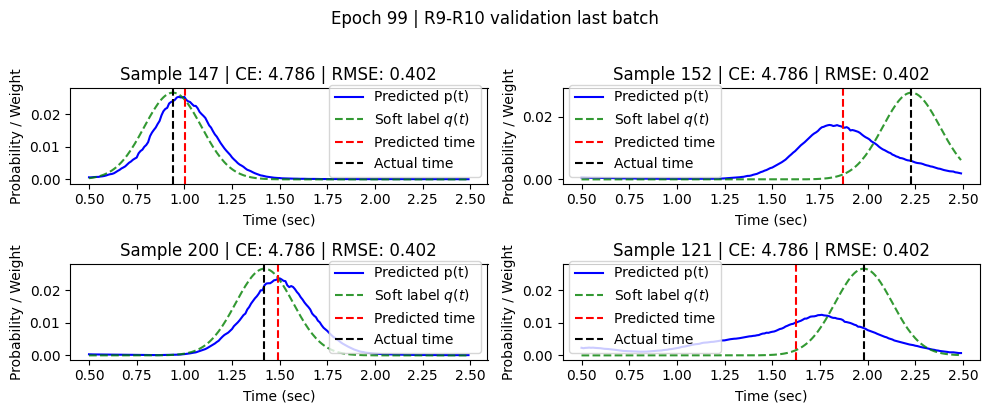

Epoch 100/120: 

Epoch 100 [147/147] Loss 6.0617 CE 4.9268 RMSE 0.3783 KL 0.0000 WASS 0.0000 NRMSE 0.9020 Entropy 4.938: 100%|██████████| 147/147 [00:11<00:00, 12.33it/s]


NRMSE: 0.9020 Total loss: 884.7106 Total CE: 723.0064 Total RMSE: 53.9014 Total KL: 0.0000 Total WASS: 0.0000


Val [70/70] Loss 5.1814 CE 4.7815 RMSE 0.3999 NRMSE 0.9350: 100%|██████████| 70/70 [00:03<00:00, 21.08it/s]


Val NRMSE: 935.044, Val Loss: 5.238171, Val CE: 4.862374, Val RMSE: 0.375797
mean bias (s): 0.07065702974796295


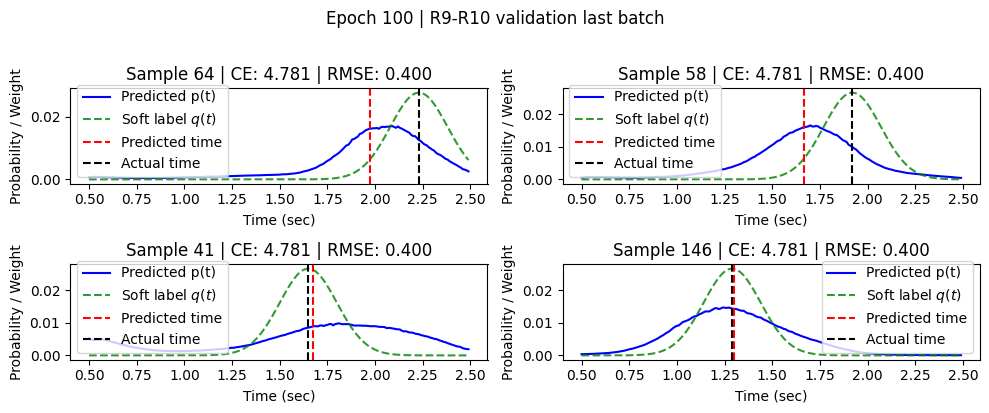

Epoch 101/120: 

Epoch 101 [147/147] Loss 6.0476 CE 4.9094 RMSE 0.3794 KL 0.0000 WASS 0.0000 NRMSE 0.8999 Entropy 4.916: 100%|██████████| 147/147 [00:12<00:00, 12.22it/s]


NRMSE: 0.8999 Total loss: 884.0346 Total CE: 722.8368 Total RMSE: 53.7326 Total KL: 0.0000 Total WASS: 0.0000


Val [70/70] Loss 5.1896 CE 4.7879 RMSE 0.4017 NRMSE 0.9349: 100%|██████████| 70/70 [00:03<00:00, 21.05it/s]


Val NRMSE: 934.855, Val Loss: 5.235882, Val CE: 4.860426, Val RMSE: 0.375456
mean bias (s): 0.0777672678232193


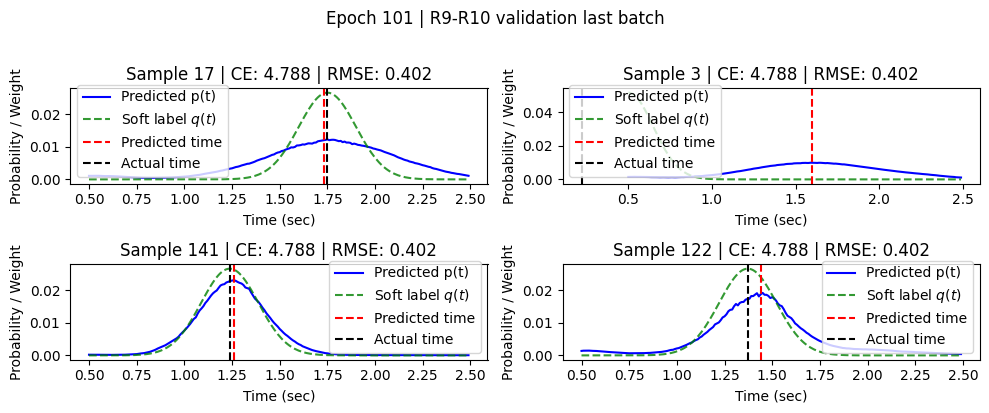

Epoch 102/120: 

Epoch 102 [147/147] Loss 5.8986 CE 4.8727 RMSE 0.3419 KL 0.0000 WASS 0.0000 NRMSE 0.8957 Entropy 4.891: 100%|██████████| 147/147 [00:15<00:00,  9.45it/s]


NRMSE: 0.8957 Total loss: 882.1924 Total CE: 722.0145 Total RMSE: 53.3926 Total KL: 0.0000 Total WASS: 0.0000


Val [70/70] Loss 5.1845 CE 4.7844 RMSE 0.4001 NRMSE 0.9370: 100%|██████████| 70/70 [00:03<00:00, 20.56it/s]


Val NRMSE: 937.046, Val Loss: 5.240372, Val CE: 4.863820, Val RMSE: 0.376552
mean bias (s): 0.07190774381160736


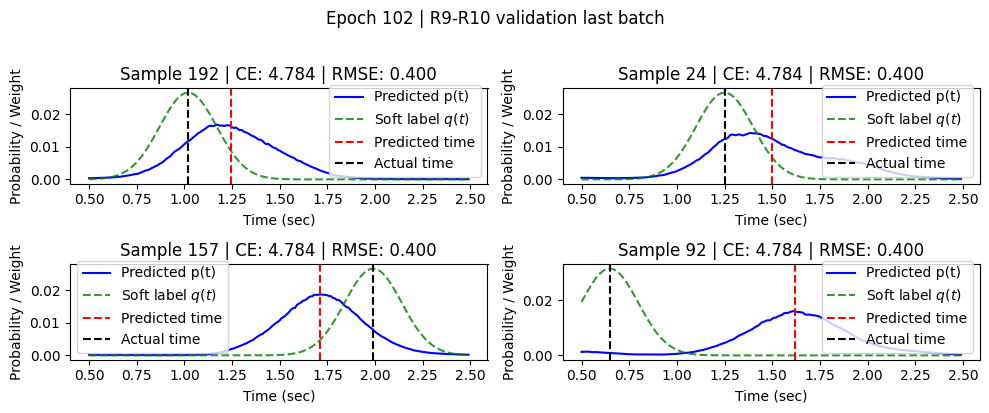

Epoch 103/120: 

Epoch 103 [147/147] Loss 5.8856 CE 4.8763 RMSE 0.3364 KL 0.0000 WASS 0.0000 NRMSE 0.8955 Entropy 4.896: 100%|██████████| 147/147 [00:12<00:00, 11.54it/s]


NRMSE: 0.8955 Total loss: 882.5040 Total CE: 722.3018 Total RMSE: 53.4008 Total KL: 0.0000 Total WASS: 0.0000


Val [70/70] Loss 5.1846 CE 4.7849 RMSE 0.3998 NRMSE 0.9389: 100%|██████████| 70/70 [00:03<00:00, 20.32it/s]


Val NRMSE: 938.924, Val Loss: 5.244007, Val CE: 4.866592, Val RMSE: 0.377415
mean bias (s): 0.06902758777141571


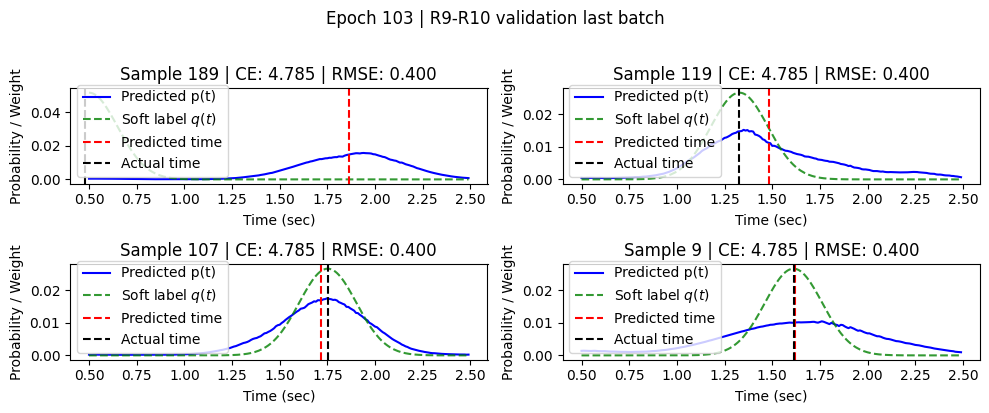

Epoch 104/120: 

Epoch 104 [147/147] Loss 5.8954 CE 4.8836 RMSE 0.3373 KL 0.0000 WASS 0.0000 NRMSE 0.8983 Entropy 4.905: 100%|██████████| 147/147 [00:12<00:00, 11.84it/s]


NRMSE: 0.8983 Total loss: 883.5696 Total CE: 722.7078 Total RMSE: 53.6206 Total KL: 0.0000 Total WASS: 0.0000


Val [70/70] Loss 5.1874 CE 4.7867 RMSE 0.4007 NRMSE 0.9360: 100%|██████████| 70/70 [00:03<00:00, 20.60it/s]


Val NRMSE: 935.969, Val Loss: 5.238487, Val CE: 4.862541, Val RMSE: 0.375947
mean bias (s): 0.07491552829742432


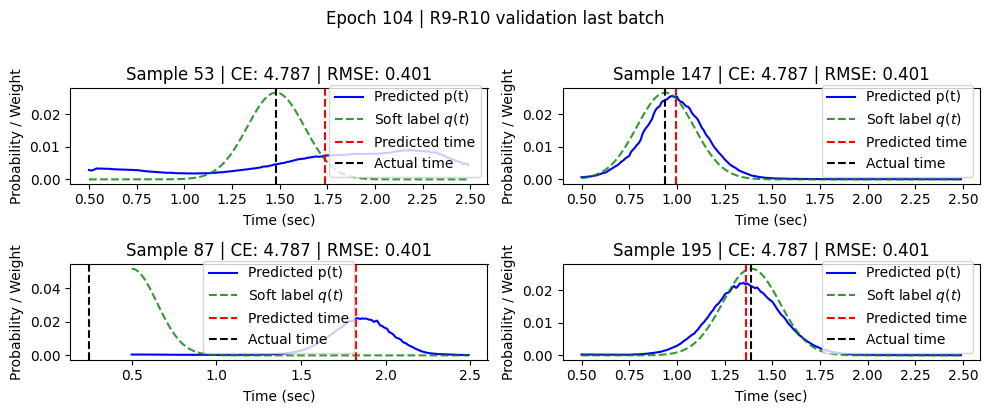

Epoch 105/120: 

Epoch 105 [147/147] Loss 6.0069 CE 4.9452 RMSE 0.3539 KL 0.0000 WASS 0.0000 NRMSE 0.8965 Entropy 4.947: 100%|██████████| 147/147 [00:12<00:00, 11.94it/s]


NRMSE: 0.8965 Total loss: 883.0998 Total CE: 722.5962 Total RMSE: 53.5012 Total KL: 0.0000 Total WASS: 0.0000


Val [70/70] Loss 5.1839 CE 4.7843 RMSE 0.3996 NRMSE 0.9352: 100%|██████████| 70/70 [00:03<00:00, 20.66it/s]


Val NRMSE: 935.192, Val Loss: 5.236926, Val CE: 4.861350, Val RMSE: 0.375577
mean bias (s): 0.07620669156312943


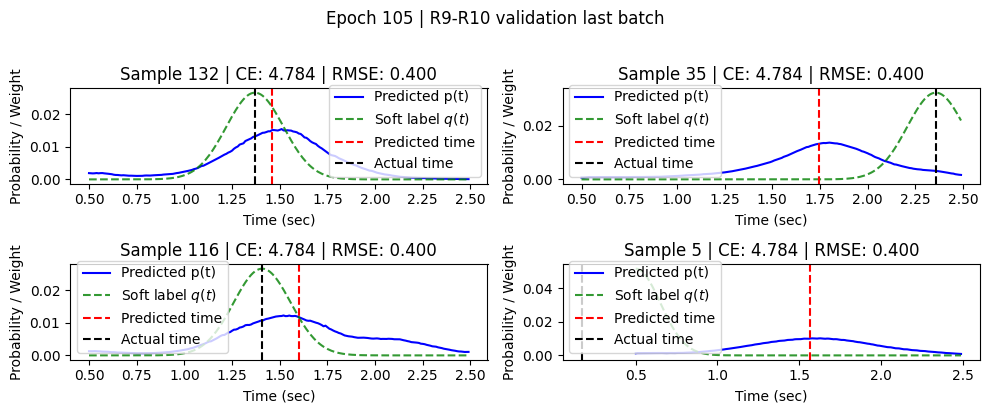

Epoch 106/120: 

Epoch 106 [147/147] Loss 6.0422 CE 4.9391 RMSE 0.3677 KL 0.0000 WASS 0.0000 NRMSE 0.8957 Entropy 4.922: 100%|██████████| 147/147 [00:12<00:00, 12.08it/s]


NRMSE: 0.8957 Total loss: 882.6014 Total CE: 722.1616 Total RMSE: 53.4799 Total KL: 0.0000 Total WASS: 0.0000


Val [70/70] Loss 5.1873 CE 4.7866 RMSE 0.4008 NRMSE 0.9357: 100%|██████████| 70/70 [00:03<00:00, 20.65it/s]


Val NRMSE: 935.714, Val Loss: 5.237005, Val CE: 4.861213, Val RMSE: 0.375792
mean bias (s): 0.07603251934051514


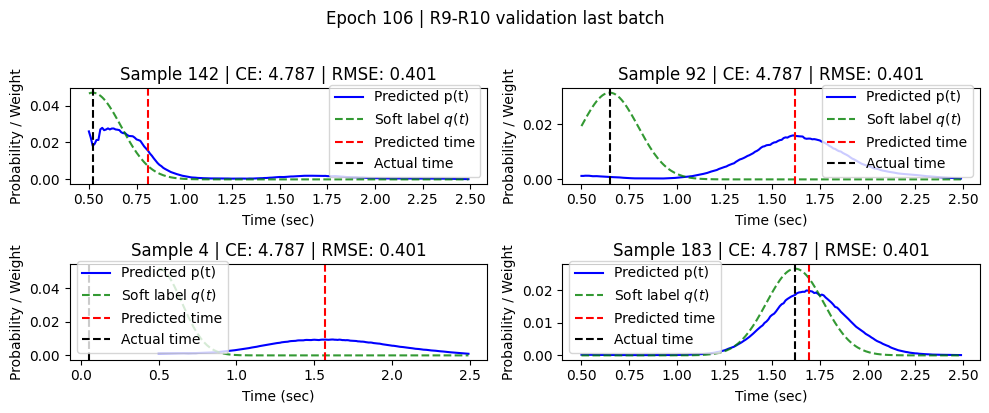

Epoch 107/120: 

Epoch 107 [147/147] Loss 6.0925 CE 4.9371 RMSE 0.3851 KL 0.0000 WASS 0.0000 NRMSE 0.8982 Entropy 4.896: 100%|██████████| 147/147 [00:12<00:00, 11.94it/s]


NRMSE: 0.8982 Total loss: 883.4342 Total CE: 722.5578 Total RMSE: 53.6255 Total KL: 0.0000 Total WASS: 0.0000


Val [70/70] Loss 5.1911 CE 4.7897 RMSE 0.4014 NRMSE 0.9361: 100%|██████████| 70/70 [00:03<00:00, 20.81it/s]


Val NRMSE: 936.089, Val Loss: 5.237116, Val CE: 4.861221, Val RMSE: 0.375895
mean bias (s): 0.07992076128721237


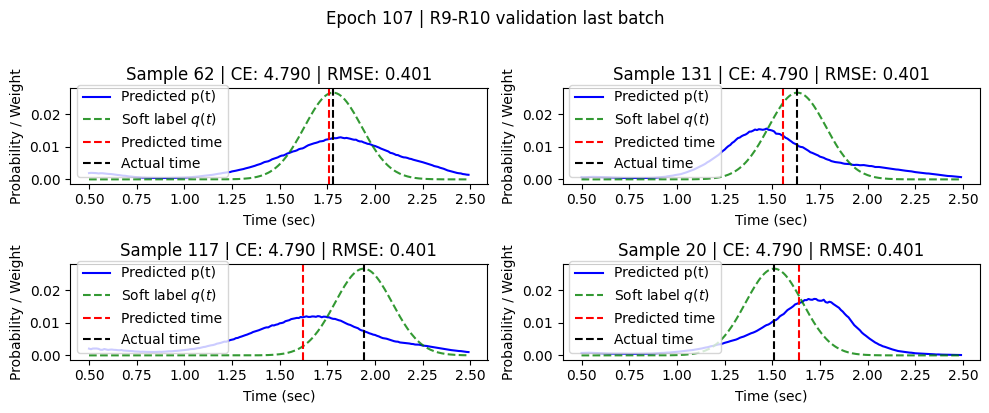

Epoch 108/120: 

Epoch 108 [147/147] Loss 5.9543 CE 4.9143 RMSE 0.3467 KL 0.0000 WASS 0.0000 NRMSE 0.8971 Entropy 4.913: 100%|██████████| 147/147 [00:12<00:00, 11.47it/s]


NRMSE: 0.8971 Total loss: 882.7700 Total CE: 722.2139 Total RMSE: 53.5187 Total KL: 0.0000 Total WASS: 0.0000


Val [70/70] Loss 5.1840 CE 4.7847 RMSE 0.3994 NRMSE 0.9363: 100%|██████████| 70/70 [00:03<00:00, 20.73it/s]


Val NRMSE: 936.251, Val Loss: 5.239233, Val CE: 4.863103, Val RMSE: 0.376131
mean bias (s): 0.0757116749882698


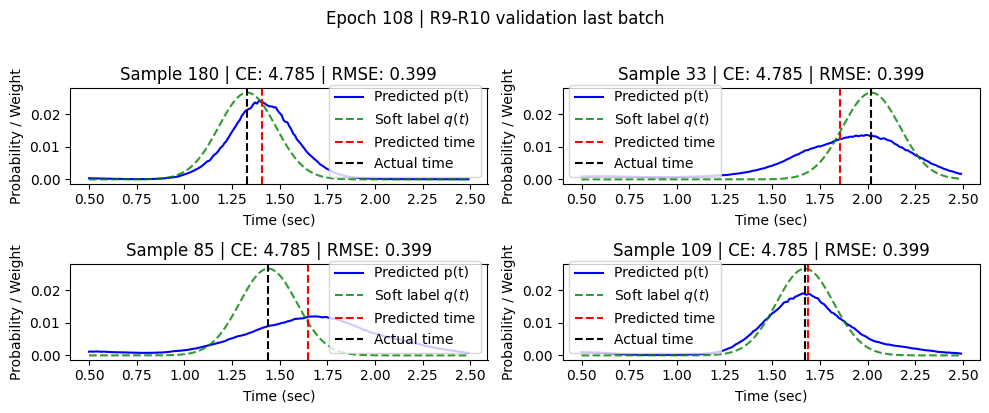

Epoch 109/120: 

Epoch 109 [147/147] Loss 6.1296 CE 4.9661 RMSE 0.3879 KL 0.0000 WASS 0.0000 NRMSE 0.8959 Entropy 4.935: 100%|██████████| 147/147 [00:12<00:00, 12.06it/s]


NRMSE: 0.8959 Total loss: 882.7659 Total CE: 722.4742 Total RMSE: 53.4306 Total KL: 0.0000 Total WASS: 0.0000


Val [70/70] Loss 5.1851 CE 4.7850 RMSE 0.4001 NRMSE 0.9378: 100%|██████████| 70/70 [00:03<00:00, 20.83it/s]


Val NRMSE: 937.767, Val Loss: 5.240908, Val CE: 4.864023, Val RMSE: 0.376884
mean bias (s): 0.07314673066139221


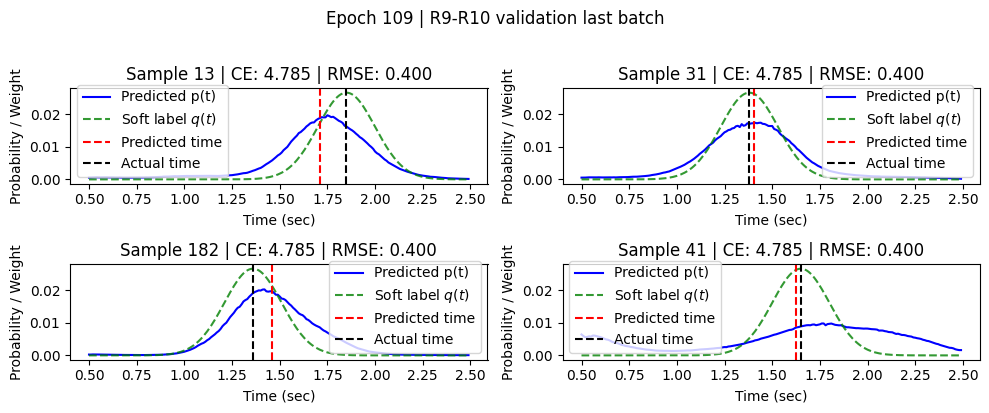

Epoch 110/120: 

Epoch 110 [147/147] Loss 5.9863 CE 4.9118 RMSE 0.3582 KL 0.0000 WASS 0.0000 NRMSE 0.8959 Entropy 4.901: 100%|██████████| 147/147 [00:12<00:00, 12.02it/s]


NRMSE: 0.8959 Total loss: 882.4745 Total CE: 722.1912 Total RMSE: 53.4278 Total KL: 0.0000 Total WASS: 0.0000


Val [70/70] Loss 5.1851 CE 4.7852 RMSE 0.4000 NRMSE 0.9376: 100%|██████████| 70/70 [00:03<00:00, 20.86it/s]


Val NRMSE: 937.609, Val Loss: 5.240607, Val CE: 4.863913, Val RMSE: 0.376694
mean bias (s): 0.07408206909894943


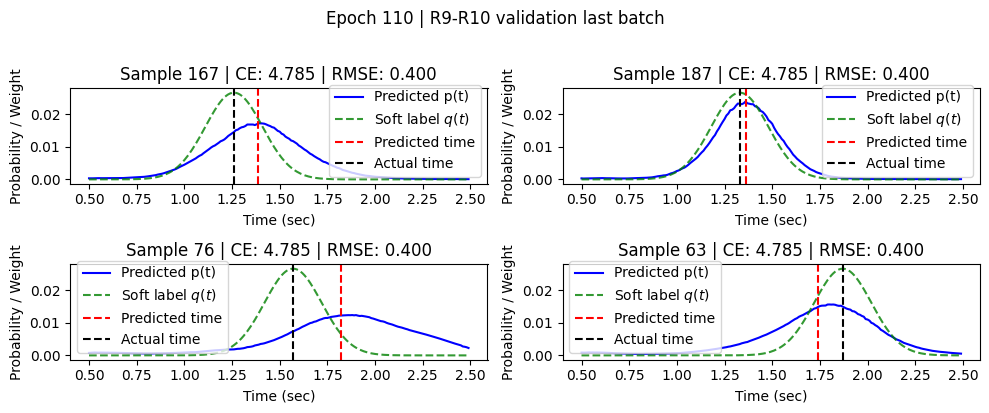

Epoch 111/120: 

Epoch 111 [147/147] Loss 6.0613 CE 4.9147 RMSE 0.3822 KL 0.0000 WASS 0.0000 NRMSE 0.8973 Entropy 4.916: 100%|██████████| 147/147 [00:12<00:00, 12.05it/s]


NRMSE: 0.8973 Total loss: 883.2516 Total CE: 722.5049 Total RMSE: 53.5822 Total KL: 0.0000 Total WASS: 0.0000


Val [70/70] Loss 5.1854 CE 4.7847 RMSE 0.4007 NRMSE 0.9372: 100%|██████████| 70/70 [00:03<00:00, 19.78it/s]


Val NRMSE: 937.200, Val Loss: 5.239795, Val CE: 4.863191, Val RMSE: 0.376604
mean bias (s): 0.07427273690700531


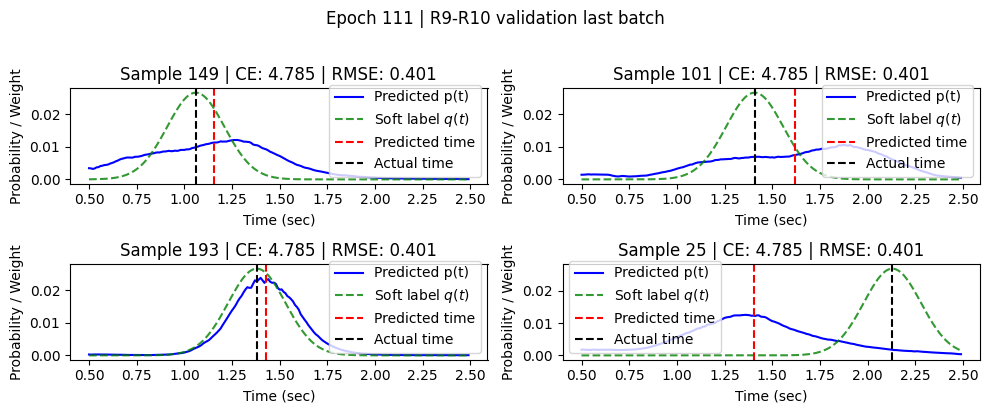

Epoch 112/120: 

Epoch 112 [147/147] Loss 5.9511 CE 4.8863 RMSE 0.3549 KL 0.0000 WASS 0.0000 NRMSE 0.8954 Entropy 4.928: 100%|██████████| 147/147 [00:12<00:00, 11.72it/s]


NRMSE: 0.8954 Total loss: 882.6681 Total CE: 722.3175 Total RMSE: 53.4502 Total KL: 0.0000 Total WASS: 0.0000


Val [70/70] Loss 5.1864 CE 4.7855 RMSE 0.4009 NRMSE 0.9357: 100%|██████████| 70/70 [00:03<00:00, 20.86it/s]


Val NRMSE: 935.673, Val Loss: 5.235656, Val CE: 4.859948, Val RMSE: 0.375709
mean bias (s): 0.07912266999483109


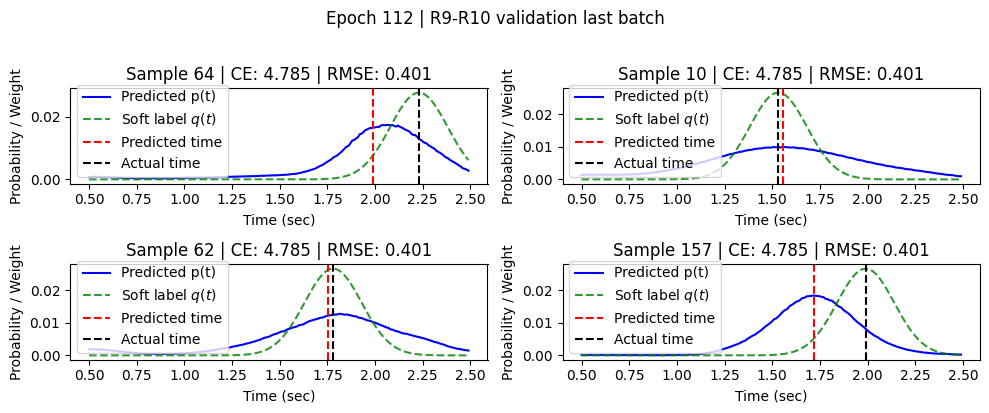

Epoch 113/120: 

Epoch 113 [147/147] Loss 5.9910 CE 4.9035 RMSE 0.3625 KL 0.0000 WASS 0.0000 NRMSE 0.8940 Entropy 4.909: 100%|██████████| 147/147 [00:12<00:00, 11.95it/s]


NRMSE: 0.8940 Total loss: 882.5745 Total CE: 722.3601 Total RMSE: 53.4048 Total KL: 0.0000 Total WASS: 0.0000


Val [70/70] Loss 5.1823 CE 4.7821 RMSE 0.4001 NRMSE 0.9385: 100%|██████████| 70/70 [00:03<00:00, 20.86it/s]


Val NRMSE: 938.516, Val Loss: 5.241435, Val CE: 4.864230, Val RMSE: 0.377205
mean bias (s): 0.07244251668453217


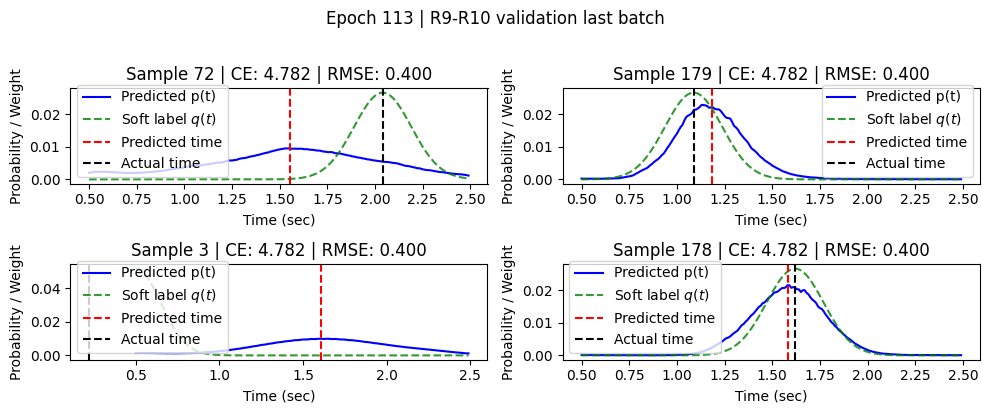

Restart from checkpoint ../../artifacts/RecurrentSneddyUnet__ch126_c32_w1p5_st3_d1-1-1_k7_bnrnn_bd2_drop0p1_dp0p0_sg0_rnngru_bi1_hm1p0_rpb1_brl1_rdrop0p05_dwpos1__bs512__lr0p001__sig0p15__tau0p65__lt3p0_ce0__20260612_185612/best_model.pth. Best Val NRMSE: 929.449144 (epoch 23)
Updating learning rate 3.125e-05 -> 1.5625e-05
Epoch 114/120: 

Epoch 114 [147/147] Loss 6.0242 CE 4.9294 RMSE 0.3649 KL 0.0000 WASS 0.0000 NRMSE 0.9036 Entropy 4.960: 100%|██████████| 147/147 [00:12<00:00, 12.06it/s]


NRMSE: 0.9036 Total loss: 885.4350 Total CE: 723.6105 Total RMSE: 53.9415 Total KL: 0.0000 Total WASS: 0.0000


Val [70/70] Loss 5.1886 CE 4.7860 RMSE 0.4026 NRMSE 0.9350: 100%|██████████| 70/70 [00:03<00:00, 20.85it/s]


Val NRMSE: 934.982, Val Loss: 5.240736, Val CE: 4.864844, Val RMSE: 0.375892
mean bias (s): 0.06909552961587906


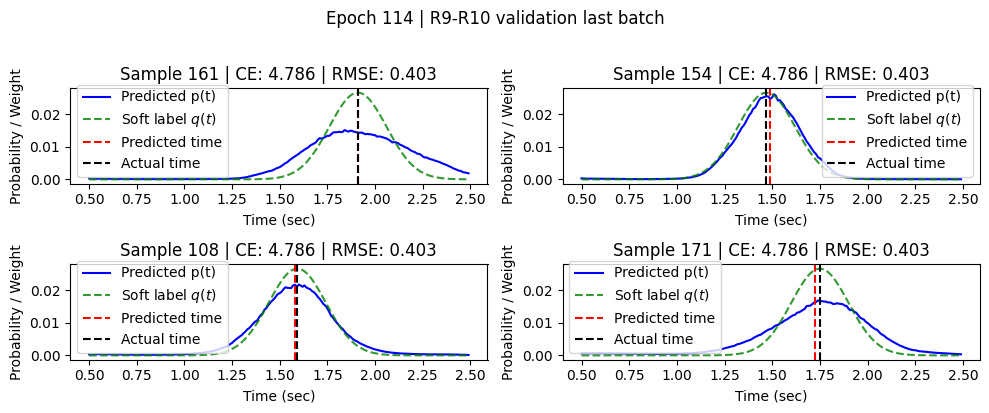

Epoch 115/120: 

Epoch 115 [147/147] Loss 5.9080 CE 4.8844 RMSE 0.3412 KL 0.0000 WASS 0.0000 NRMSE 0.9022 Entropy 4.930: 100%|██████████| 147/147 [00:12<00:00, 12.10it/s]


NRMSE: 0.9022 Total loss: 884.8263 Total CE: 723.2428 Total RMSE: 53.8612 Total KL: 0.0000 Total WASS: 0.0000


Val [70/70] Loss 5.1887 CE 4.7863 RMSE 0.4024 NRMSE 0.9345: 100%|██████████| 70/70 [00:03<00:00, 20.45it/s]


Val NRMSE: 934.502, Val Loss: 5.237366, Val CE: 4.861843, Val RMSE: 0.375524
mean bias (s): 0.07357807457447052


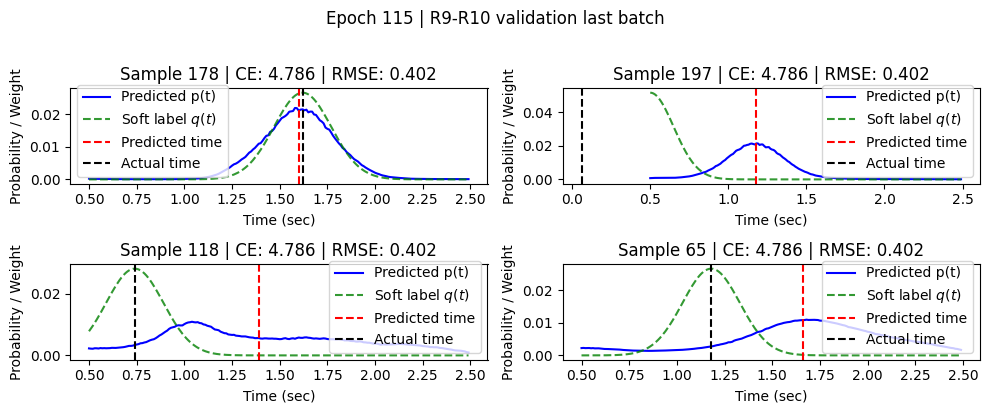

Epoch 116/120: 

Epoch 116 [147/147] Loss 6.0369 CE 4.9435 RMSE 0.3645 KL 0.0000 WASS 0.0000 NRMSE 0.8981 Entropy 4.892: 100%|██████████| 147/147 [00:12<00:00, 11.87it/s]


NRMSE: 0.8981 Total loss: 883.7511 Total CE: 722.7361 Total RMSE: 53.6716 Total KL: 0.0000 Total WASS: 0.0000


Val [70/70] Loss 5.1849 CE 4.7839 RMSE 0.4010 NRMSE 0.9362: 100%|██████████| 70/70 [00:03<00:00, 20.64it/s]


Val NRMSE: 936.215, Val Loss: 5.240779, Val CE: 4.864465, Val RMSE: 0.376314
mean bias (s): 0.0708797350525856


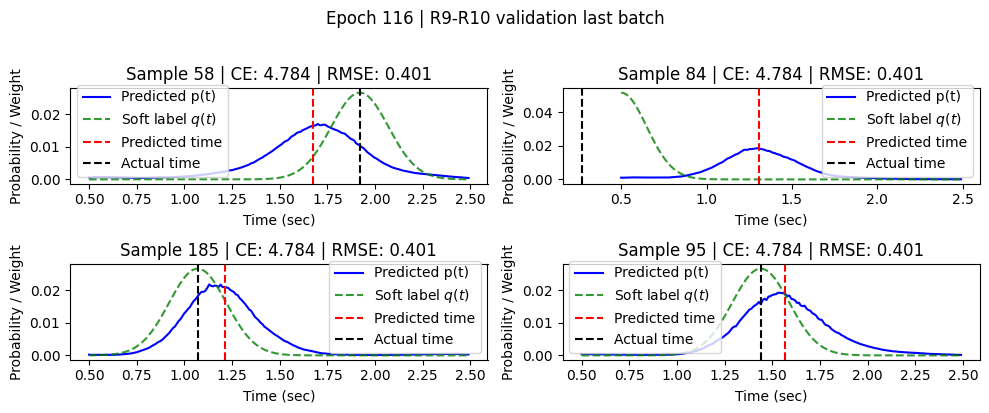

Epoch 117/120: 

Epoch 117 [147/147] Loss 6.0350 CE 4.9186 RMSE 0.3721 KL 0.0000 WASS 0.0000 NRMSE 0.9001 Entropy 4.899: 100%|██████████| 147/147 [00:11<00:00, 12.34it/s]


NRMSE: 0.9001 Total loss: 883.9476 Total CE: 722.9373 Total RMSE: 53.6701 Total KL: 0.0000 Total WASS: 0.0000


Val [70/70] Loss 5.1865 CE 4.7853 RMSE 0.4011 NRMSE 0.9346: 100%|██████████| 70/70 [00:03<00:00, 20.58it/s]


Val NRMSE: 934.578, Val Loss: 5.236896, Val CE: 4.861492, Val RMSE: 0.375404
mean bias (s): 0.07529965788125992


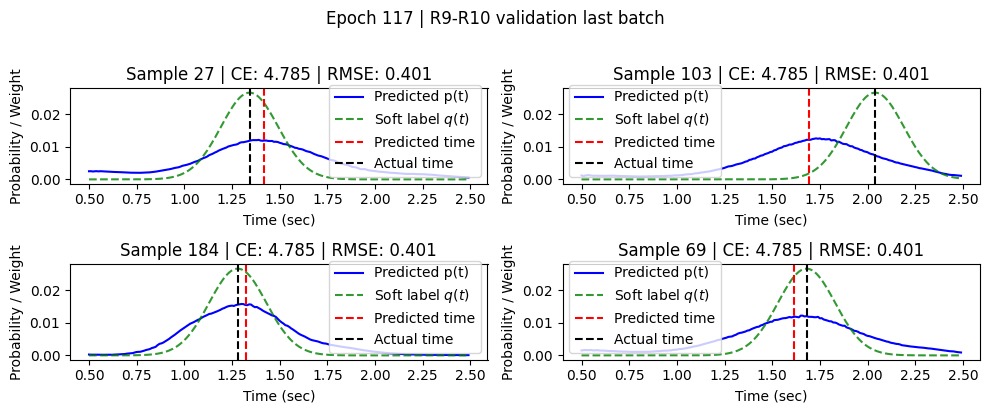

Epoch 118/120: 

Epoch 118 [147/147] Loss 6.0307 CE 4.9223 RMSE 0.3695 KL 0.0000 WASS 0.0000 NRMSE 0.8989 Entropy 4.897: 100%|██████████| 147/147 [00:12<00:00, 12.02it/s]


NRMSE: 0.8989 Total loss: 883.3498 Total CE: 722.3683 Total RMSE: 53.6605 Total KL: 0.0000 Total WASS: 0.0000


Val [70/70] Loss 5.1860 CE 4.7850 RMSE 0.4009 NRMSE 0.9359: 100%|██████████| 70/70 [00:03<00:00, 20.83it/s]


Val NRMSE: 935.853, Val Loss: 5.239093, Val CE: 4.863032, Val RMSE: 0.376061
mean bias (s): 0.07198438793420792


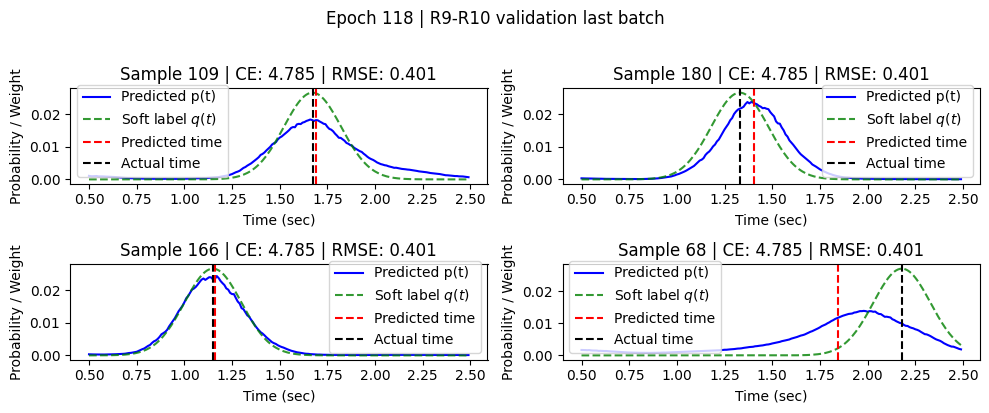

Epoch 119/120: 

Epoch 119 [147/147] Loss 6.0182 CE 4.9402 RMSE 0.3593 KL 0.0000 WASS 0.0000 NRMSE 0.8976 Entropy 4.921: 100%|██████████| 147/147 [00:11<00:00, 12.28it/s]


NRMSE: 0.8976 Total loss: 883.5415 Total CE: 722.7276 Total RMSE: 53.6046 Total KL: 0.0000 Total WASS: 0.0000


Val [70/70] Loss 5.1889 CE 4.7871 RMSE 0.4017 NRMSE 0.9342: 100%|██████████| 70/70 [00:03<00:00, 21.08it/s]


Val NRMSE: 934.182, Val Loss: 5.234892, Val CE: 4.859687, Val RMSE: 0.375205
mean bias (s): 0.07726836204528809


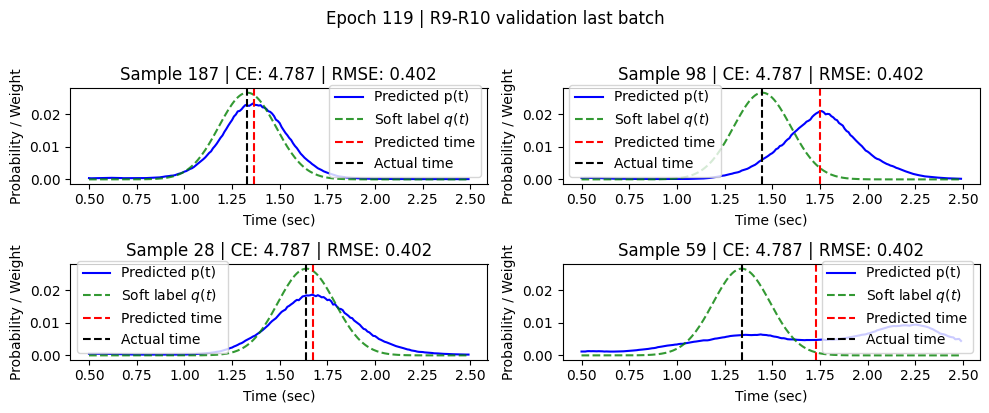

Epoch 120/120: 

Epoch 120 [147/147] Loss 6.0420 CE 4.9356 RMSE 0.3688 KL 0.0000 WASS 0.0000 NRMSE 0.8990 Entropy 4.930: 100%|██████████| 147/147 [00:11<00:00, 12.30it/s]


NRMSE: 0.8990 Total loss: 884.1786 Total CE: 722.9914 Total RMSE: 53.7291 Total KL: 0.0000 Total WASS: 0.0000


Val [70/70] Loss 5.1877 CE 4.7866 RMSE 0.4011 NRMSE 0.9359: 100%|██████████| 70/70 [00:03<00:00, 21.15it/s]


Val NRMSE: 935.897, Val Loss: 5.238289, Val CE: 4.862213, Val RMSE: 0.376076
mean bias (s): 0.07327252626419067


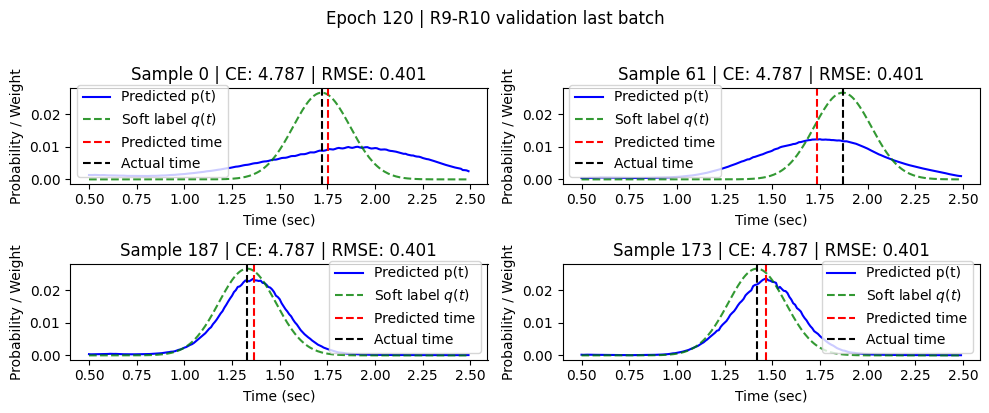

Training finished. Artifacts saved in: ../../artifacts/RecurrentSneddyUnet__ch126_c32_w1p5_st3_d1-1-1_k7_bnrnn_bd2_drop0p1_dp0p0_sg0_rnngru_bi1_hm1p0_rpb1_brl1_rdrop0p05_dwpos1__bs512__lr0p001__sig0p15__tau0p65__lt3p0_ce0__20260612_185612
Training wall time: 1971.7s (16.4s/epoch avg)


In [11]:
import copy
import json
import time
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from datetime import datetime, timezone

finetune_mode = False
# CPU fallback is for smoke tests only. Full scratch training needs CUDA.
demonstration_mode = device.type == "cpu"

if device.type == "cpu":
    print("CUDA is unavailable: using a 1-epoch CPU smoke test config. Fix GPU before real training.")

n_epochs = 1 if demonstration_mode else 120
early_stopping_patience = 1 if demonstration_mode else 15
use_augmentation = True if finetune_mode else True
initial_lr = 1E-4 if finetune_mode else 0.001
weight_decay = 0 if finetune_mode else 0
optimizer_module = torch.optim.SGD if finetune_mode else torch.optim.Adam
TRAIN_BATCH_SIZE_OVERRIDES = {
    "AttentionSneddyUnet": 128,
}
batch_size = 16 if device.type == "cpu" else TRAIN_BATCH_SIZE_OVERRIDES.get(MODEL_NAME, 512)
sigma = 0.15 if finetune_mode else 0.15 # 0.13
cropping_offset = 0.2 if finetune_mode else 0.25
crop_proba = 0.1 if finetune_mode else 0.3
dropout_proba = 0.3 if finetune_mode else 0.25
dropout_range = 0.2 if finetune_mode else 0.8
mixup_p = 0.5 if finetune_mode else 0.1 #0.8
temperature = 0.75 if finetune_mode else 0.65 # 0.7
lambda_time = 0 if finetune_mode else 3. # 5
lambda_ce = 1.0 if finetune_mode else 0 # 1
lambda_wass = 0.0 if finetune_mode else 0. # 0.001
lambda_kl = 0. if finetune_mode else 0
lambda_entropy = -0.0 if finetune_mode else 0
lambda_focal = 0.
lambda_hazard = 0.0
grad_accum = 1
save_epoch_plots = True
show_train_epoch_plots = False
show_val_epoch_plots = True

ARTIFACTS_DIR = Path("../../artifacts")
SUMMARY_MD_PATH = ARTIFACTS_DIR / "summary.md"
SUMMARY_JSONL_PATH = ARTIFACTS_DIR / "summary.jsonl"
ARTIFACTS_DIR.mkdir(parents=True, exist_ok=True)


def _slug_value(value):
    text = str(value)
    return (
        text.replace("-", "m")
        .replace(".", "p")
        .replace("+", "p")
        .replace("/", "_")
        .replace(" ", "")
    )


def _json_default(value):
    if isinstance(value, Path):
        return str(value)
    if isinstance(value, (np.integer, np.floating)):
        return value.item()
    return str(value)


def _now_utc_iso():
    return datetime.now(timezone.utc).strftime("%Y-%m-%dT%H:%M:%SZ")


def _sync_if_cuda(device):
    if getattr(device, "type", str(device)) == "cuda" and torch.cuda.is_available():
        torch.cuda.synchronize(device)


TRAINING_CONFIG = {
    "finetune_mode": finetune_mode,
    "demonstration_mode": demonstration_mode,
    "n_epochs": n_epochs,
    "early_stopping_patience": early_stopping_patience,
    "use_augmentation": use_augmentation,
    "initial_lr": initial_lr,
    "weight_decay": weight_decay,
    "optimizer": optimizer_module.__name__,
    "batch_size": batch_size,
    "sigma": sigma,
    "cropping_offset": cropping_offset,
    "crop_proba": crop_proba,
    "dropout_proba": dropout_proba,
    "dropout_range": dropout_range,
    "mixup_p": mixup_p,
    "temperature": temperature,
    "lambda_time": lambda_time,
    "lambda_ce": lambda_ce,
    "lambda_wass": lambda_wass,
    "lambda_kl": lambda_kl,
    "lambda_entropy": lambda_entropy,
    "lambda_focal": lambda_focal,
    "lambda_hazard": lambda_hazard,
    "grad_accum": grad_accum,
    "save_epoch_plots": save_epoch_plots,
    "show_train_epoch_plots": show_train_epoch_plots,
    "show_val_epoch_plots": show_val_epoch_plots,
}

DATA_CONFIG = {
    "train_5sec": str(TRAIN_5SEC_PATH),
    "train_2sec": str(TRAIN_2SEC_PATH),
    "valid_2sec": str(VALID_2SEC_PATH),
    "valid_5sec": str(VALID_5SEC_PATH),
    "test_2sec": str(TEST_2SEC_PATH),
    "split": "R1-R8 train, R9-R10 validation, R11 holdout",
}

def _model_config_slug(model_config):
    if "bottleneck_type" in model_config or "drop_path" in model_config:
        depth = model_config.get("depth_per_stage")
        if isinstance(depth, (list, tuple)):
            depth = "-".join(_slug_value(value) for value in depth)
        else:
            depth = _slug_value(depth)
        parts = [
            f"ch{model_config.get('n_chans')}",
            f"c{model_config.get('c0')}",
            f"w{_slug_value(model_config.get('widen'))}",
            f"st{model_config.get('num_stages')}",
            f"d{depth}",
            f"k{model_config.get('k')}",
            f"bn{model_config.get('bottleneck_type')}",
            f"bd{model_config.get('bottleneck_depth')}",
            f"drop{_slug_value(model_config.get('dropout'))}",
            f"dp{_slug_value(model_config.get('drop_path'))}",
            f"sg{int(bool(model_config.get('skip_gating')))}",
        ]
        if "rnn_type" in model_config:
            parts.extend(
                [
                    f"rnn{model_config.get('rnn_type')}",
                    f"bi{int(bool(model_config.get('bidirectional')))}",
                    f"hm{_slug_value(model_config.get('rnn_hidden_mult'))}",
                    f"rpb{model_config.get('rnn_layers_per_block')}",
                    f"brl{model_config.get('bottleneck_rnn_layers')}",
                    f"rdrop{_slug_value(model_config.get('rnn_dropout'))}",
                    f"dwpos{int(bool(model_config.get('use_dwpos')))}",
                ]
            )
        return "_".join(parts)
    if "fm_factors_front" in model_config or "use_stage_fm" in model_config:
        return "_".join(
            [
                f"c{model_config.get('c0')}",
                f"w{model_config.get('widen')}",
                f"st{model_config.get('n_stages')}",
                f"d{model_config.get('depth_per_stage')}",
                f"k{model_config.get('k')}",
                f"drop{_slug_value(model_config.get('dropout'))}",
                f"fmfront{model_config.get('fm_factors_front')}",
                f"stagefm{int(bool(model_config.get('use_stage_fm')))}",
                f"fmstage{model_config.get('fm_factors_stage')}",
            ]
        )
    if {"c0", "widen", "depth_per_stage"}.issubset(model_config):
        return f"c{model_config.get('c0')}_w{model_config.get('widen')}_d{model_config.get('depth_per_stage')}"
    if "branch_out" in model_config:
        scales = "-".join(_slug_value(value) for value in model_config.get("scales_samples_s", ()))
        pools = "-".join(_slug_value(value) for value in model_config.get("pooling_sizes", ()))
        return "_".join(
            [
                f"br{model_config.get('branch_out')}",
                f"scales{scales}",
                f"pool{pools}",
                f"drop{_slug_value(model_config.get('dropout'))}",
            ]
        )
    keys = ["n_chans", "n_times", "sfreq", "dropout", "out_channels"]
    return "_".join(f"{key}{_slug_value(model_config[key])}" for key in keys if key in model_config)


created_at = _now_utc_iso()
timestamp = datetime.now(timezone.utc).strftime("%Y%m%d_%H%M%S")
MODEL_CONFIG_SLUG = _model_config_slug(MODEL_CONFIG)
RUN_NAME = "__".join(
    [
        MODEL_NAME,
        MODEL_CONFIG_SLUG,
        f"bs{batch_size}",
        f"lr{_slug_value(initial_lr)}",
        f"sig{_slug_value(sigma)}",
        f"tau{_slug_value(temperature)}",
        f"lt{_slug_value(lambda_time)}_ce{_slug_value(lambda_ce)}",
        timestamp,
    ]
)
RUN_DIR = ARTIFACTS_DIR / RUN_NAME
if RUN_DIR.exists():
    raise FileExistsError(f"Run artifact directory already exists: {RUN_DIR}")
RUN_DIR.mkdir(parents=False, exist_ok=False)

RUN_IMG_DIR = RUN_DIR / "img"
TRAIN_IMG_DIR = RUN_IMG_DIR / "train"
VAL_IMG_DIR = RUN_IMG_DIR / "val"
for image_dir in (TRAIN_IMG_DIR, VAL_IMG_DIR):
    image_dir.mkdir(parents=True, exist_ok=True)

output_checkpoint_path = RUN_DIR / "best_model.pth"
config_path = RUN_DIR / "config.json"
metrics_path = RUN_DIR / "metrics.csv"
model_summary_path = RUN_DIR / "model.txt"
best_val_predictions_path = RUN_DIR / "best_val_predictions.csv"
holdout_predictions_path = RUN_DIR / "holdout_predictions.csv"

RUN_CONFIG = {
    "run_name": RUN_NAME,
    "created_at": created_at,
    "device": str(device),
    "model_name": MODEL_NAME,
    "model_config": MODEL_CONFIG,
    "training_config": TRAINING_CONFIG,
    "data_config": DATA_CONFIG,
    "load_initial_checkpoint": LOAD_INITIAL_CHECKPOINT,
    "input_checkpoint_path": input_checkpoint_path,
    "output_checkpoint_path": output_checkpoint_path,
    "image_dirs": {"train": TRAIN_IMG_DIR, "val": VAL_IMG_DIR},
    "timing": {"run_created_at": created_at},
    "notebook": "notebooks/challenge_1/3_segmentation_new.ipynb",
}

with config_path.open("w") as f:
    json.dump(RUN_CONFIG, f, indent=2, default=_json_default)

with model_summary_path.open("w") as f:
    f.write(str(model))
    f.write("\n")
    f.write(f"\nTotal parameters: {sum(p.numel() for p in model.parameters()):,}\n")


def _format_md_value(value):
    if value is None:
        return ""
    if isinstance(value, float):
        if np.isnan(value):
            return ""
        return f"{value:.6f}"
    text = str(value)
    return text.replace("|", "\\|").replace("\n", " ")


def update_summary_md(row):
    records = []
    if SUMMARY_JSONL_PATH.exists():
        with SUMMARY_JSONL_PATH.open("r") as f:
            for line in f:
                line = line.strip()
                if line:
                    records.append(json.loads(line))

    records = [record for record in records if record.get("run_name") != row.get("run_name")]
    records.append(row)
    records = sorted(records, key=lambda record: record.get("created_at", ""), reverse=True)

    with SUMMARY_JSONL_PATH.open("w") as f:
        for record in records:
            f.write(json.dumps(record, default=_json_default) + "\n")

    columns = [
        "created_at",
        "run_name",
        "model",
        "batch_size",
        "lr",
        "sigma",
        "temperature",
        "lambda_time",
        "lambda_ce",
        "best_epoch",
        "best_val_nrmse",
        "holdout_nrmse",
        "training_wall_seconds",
        "avg_epoch_seconds",
        "time_to_best_seconds",
        "holdout_seconds",
        "status",
        "run_dir",
    ]
    lines = [
        "# Segmentation Runs Summary",
        "",
        "| " + " | ".join(columns) + " |",
        "| " + " | ".join(["---"] * len(columns)) + " |",
    ]
    for record in records:
        lines.append("| " + " | ".join(_format_md_value(record.get(column)) for column in columns) + " |")
    SUMMARY_MD_PATH.write_text("\n".join(lines) + "\n")


run_summary = {
    "created_at": created_at,
    "run_name": RUN_NAME,
    "model": MODEL_NAME,
    "batch_size": batch_size,
    "lr": initial_lr,
    "sigma": sigma,
    "temperature": temperature,
    "lambda_time": lambda_time,
    "lambda_ce": lambda_ce,
    "best_epoch": None,
    "best_val_nrmse": None,
    "holdout_nrmse": None,
    "training_started_at": None,
    "training_finished_at": None,
    "training_wall_seconds": None,
    "avg_epoch_seconds": None,
    "time_to_best_seconds": None,
    "holdout_seconds": None,
    "status": "started",
    "run_dir": str(RUN_DIR.relative_to(ARTIFACTS_DIR.parent)),
}
update_summary_md(run_summary)

print(f"Artifacts for this run: {RUN_DIR}")
print(f"Best checkpoint path: {output_checkpoint_path}")



train_cropping_dataset = TrainCroppingDataset(
    train_dataset, sfreq=100, crop_sec=2.0, sigma=sigma, use_channels=channels_list, end_time=3,
    use_augmentation=use_augmentation, cropping_offset=cropping_offset, crop_proba=crop_proba,
    dropout_proba=dropout_proba, dropout_range=dropout_range
)
train_loader = DataLoader(
    train_cropping_dataset, batch_size=batch_size, shuffle=True, num_workers=(0 if device.type == "cpu" else 8),
    # pin_memory=True, persistent_workers=True, prefetch_factor=4
)
current_lr = initial_lr
optimizer = optimizer_module(model.parameters(), lr=current_lr, weight_decay=weight_decay)
epoch_history = []

training_started_at = _now_utc_iso()
_sync_if_cuda(device)
training_start_perf = time.perf_counter()
run_summary.update(
    {
        "training_started_at": training_started_at,
        "status": "training_started",
    }
)
RUN_CONFIG["timing"].update({"training_started_at": training_started_at})
with config_path.open("w") as f:
    json.dump(RUN_CONFIG, f, indent=2, default=_json_default)
update_summary_md(run_summary)

for epoch in range(1, n_epochs + 1):
    print(f"Epoch {epoch}/{n_epochs}: ", end="")
    epoch_started_at = _now_utc_iso()
    epoch_start_perf = time.perf_counter()

    _sync_if_cuda(device)
    train_start_perf = time.perf_counter()
    train_loss, train_nrmse, train_loss_dict = train_one_epoch(
        train_loader, model, optimizer, epoch, device,
        mixup_p=mixup_p,
        # lambda_time=time_lambda, lambda_kl=0.5, lambda_wass=0.5,
        lambda_time=lambda_time, lambda_kl=lambda_kl, lambda_wass=lambda_wass,
        lambda_entropy = lambda_entropy, lambda_focal=lambda_focal,
        lambda_hazard=lambda_hazard,
        temperature=temperature, grad_accum=grad_accum,
        plot_last_batch=save_epoch_plots,
        plot_save_path=TRAIN_IMG_DIR / f"epoch_{epoch:04d}_train_batch.png",
        plot_title_prefix=f"Epoch {epoch} | train last batch",
        plot_show=show_train_epoch_plots,
    )
    _sync_if_cuda(device)
    train_seconds = time.perf_counter() - train_start_perf

    _sync_if_cuda(device)
    valid_start_perf = time.perf_counter()
    val_preds, val_loss, val_nrmse, val_ce, val_mse = valid_model(
        valid_loader, model, device, sigma=sigma,
        lambda_time=1., temperature=temperature,
        channels_list=channels_list, default_rmse=default_rmse_valid,
        plot_last_batch=save_epoch_plots,
        use_soft_argmax=True,
        plot_save_path=TRAIN_IMG_DIR / f"epoch_{epoch:04d}_r9_r10_val_batch.png",
        plot_title_prefix=f"Epoch {epoch} | R9-R10 validation last batch",
        plot_show=show_val_epoch_plots,
    )
    _sync_if_cuda(device)
    valid_seconds = time.perf_counter() - valid_start_perf
    epoch_seconds = time.perf_counter() - epoch_start_perf
    cumulative_training_seconds = time.perf_counter() - training_start_perf
    epoch_finished_at = _now_utc_iso()

    epoch_row = {
        "epoch": epoch,
        "epoch_started_at": epoch_started_at,
        "epoch_finished_at": epoch_finished_at,
        "lr": current_lr,
        "train_seconds": train_seconds,
        "valid_seconds": valid_seconds,
        "epoch_seconds": epoch_seconds,
        "cumulative_training_seconds": cumulative_training_seconds,
        "train_loss": train_loss,
        "train_nrmse": train_nrmse,
        "val_loss": val_loss,
        "val_nrmse": val_nrmse,
        "val_ce": val_ce,
        "val_rmse": val_mse,
        **{f"train_{key}": value for key, value in train_loss_dict.items()},
    }
    epoch_history.append(epoch_row)
    pd.DataFrame(epoch_history).to_csv(metrics_path, index=False)

    if val_nrmse < best_rmse:
        print(f"New best validation NRMSE: {val_nrmse:.6f} at epoch {epoch}")
        best_rmse = val_nrmse
        best_state = copy.deepcopy(model.state_dict())
        best_epoch = epoch
        epochs_no_improve = 0
        torch.save(model.state_dict(), output_checkpoint_path)

        if len(val_preds) == len(meta_information_valid):
            pd.DataFrame(
                {
                    "prediction": val_preds,
                    "target": meta_information_valid["target"].to_numpy(),
                    "subject": meta_information_valid["subject"].to_numpy() if "subject" in meta_information_valid else None,
                }
            ).to_csv(best_val_predictions_path, index=False)
        else:
            np.save(RUN_DIR / "best_val_predictions.npy", val_preds)

        run_summary.update(
            {
                "best_epoch": best_epoch,
                "best_val_nrmse": float(best_rmse),
                "time_to_best_seconds": cumulative_training_seconds,
                "best_epoch_finished_at": epoch_finished_at,
                "status": "training_best_updated",
            }
        )
        update_summary_md(run_summary)
    else:
        epochs_no_improve += 1
        if epochs_no_improve >= early_stopping_patience:
            if not output_checkpoint_path.exists():
                raise FileNotFoundError(f"No checkpoint from this run exists yet: {output_checkpoint_path}")
            current_checkpoint_path = output_checkpoint_path
            print(f"Restart from checkpoint {current_checkpoint_path}. Best Val NRMSE: {best_rmse:.6f} (epoch {best_epoch})")
            print(f"Updating learning rate {current_lr} -> {current_lr * 0.5}")
            model.load_state_dict(torch.load(current_checkpoint_path, map_location=device))
            current_lr = current_lr * 0.5
            optimizer = optimizer_module(model.parameters(), lr=current_lr, weight_decay=weight_decay)
            epochs_no_improve = 0

_sync_if_cuda(device)
training_wall_seconds = time.perf_counter() - training_start_perf
training_finished_at = _now_utc_iso()
avg_epoch_seconds = training_wall_seconds / len(epoch_history) if epoch_history else None

RUN_CONFIG["timing"].update(
    {
        "training_finished_at": training_finished_at,
        "training_wall_seconds": training_wall_seconds,
        "avg_epoch_seconds": avg_epoch_seconds,
        "best_epoch_finished_at": run_summary.get("best_epoch_finished_at"),
        "time_to_best_seconds": run_summary.get("time_to_best_seconds"),
    }
)
with config_path.open("w") as f:
    json.dump(RUN_CONFIG, f, indent=2, default=_json_default)

run_summary.update(
    {
        "best_epoch": best_epoch,
        "best_val_nrmse": float(best_rmse) if best_rmse < float("inf") else None,
        "training_finished_at": training_finished_at,
        "training_wall_seconds": training_wall_seconds,
        "avg_epoch_seconds": avg_epoch_seconds,
        "status": "training_finished",
    }
)
update_summary_md(run_summary)
print(f"Training finished. Artifacts saved in: {RUN_DIR}")
print(f"Training wall time: {training_wall_seconds:.1f}s ({avg_epoch_seconds:.1f}s/epoch avg)")


## After finishing training you can simply switch to finetune_mode and continue the training process until best convergance

## Holdout evaluation on R11

Run this after training/model selection. The holdout set is not used for early stopping; it is evaluated once from the best checkpoint saved on the `R9-R10` validation split.


Loading best checkpoint for holdout test: ../../artifacts/RecurrentSneddyUnet__ch126_c32_w1p5_st3_d1-1-1_k7_bnrnn_bd2_drop0p1_dp0p0_sg0_rnngru_bi1_hm1p0_rpb1_brl1_rdrop0p05_dwpos1__bs512__lr0p001__sig0p15__tau0p65__lt3p0_ce0__20260612_185612/best_model.pth


Val [62/62] Loss 4.9301 CE 4.6957 RMSE 0.2344 NRMSE 0.9454: 100%|██████████| 62/62 [00:02<00:00, 21.11it/s]


Val NRMSE: 945.369, Val Loss: 5.270047, Val CE: 4.878987, Val RMSE: 0.391061
mean bias (s): 0.030857283622026443


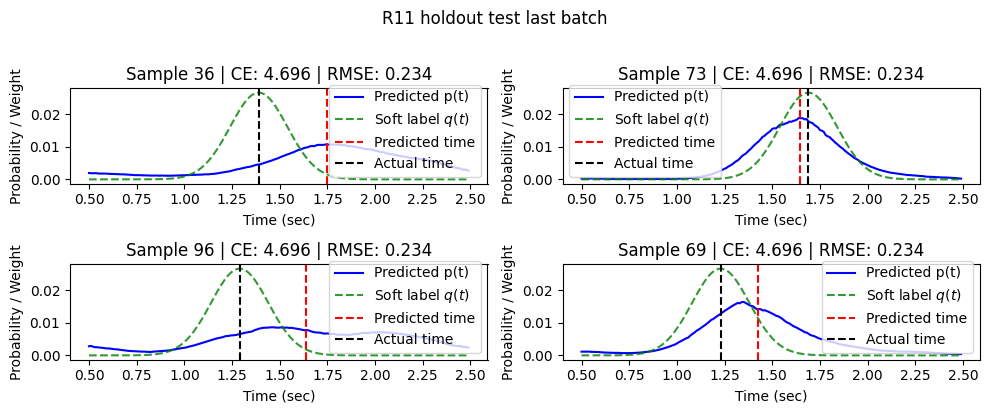

Holdout R11 NRMSE: 945.369224
Holdout predictions saved to: ../../artifacts/RecurrentSneddyUnet__ch126_c32_w1p5_st3_d1-1-1_k7_bnrnn_bd2_drop0p1_dp0p0_sg0_rnngru_bi1_hm1p0_rpb1_brl1_rdrop0p05_dwpos1__bs512__lr0p001__sig0p15__tau0p65__lt3p0_ce0__20260612_185612/holdout_predictions.csv
Holdout visualization saved to: ../../artifacts/RecurrentSneddyUnet__ch126_c32_w1p5_st3_d1-1-1_k7_bnrnn_bd2_drop0p1_dp0p0_sg0_rnngru_bi1_hm1p0_rpb1_brl1_rdrop0p05_dwpos1__bs512__lr0p001__sig0p15__tau0p65__lt3p0_ce0__20260612_185612/img/val/r11_holdout_batch.png
Holdout wall time: 3.4s


In [12]:
import json
import time
from datetime import datetime, timezone

RUN_HOLDOUT_TEST = True

# Allows running this cell after an older training run where image dirs were not yet defined.
if "VAL_IMG_DIR" not in globals():
    VAL_IMG_DIR = RUN_DIR / "img" / "val"
VAL_IMG_DIR.mkdir(parents=True, exist_ok=True)

if "_now_utc_iso" not in globals():
    def _now_utc_iso():
        return datetime.now(timezone.utc).strftime("%Y-%m-%dT%H:%M:%SZ")

if "_sync_if_cuda" not in globals():
    def _sync_if_cuda(device):
        if getattr(device, "type", str(device)) == "cuda" and torch.cuda.is_available():
            torch.cuda.synchronize(device)

if RUN_HOLDOUT_TEST:
    checkpoint_for_test = output_checkpoint_path if output_checkpoint_path.exists() else None
    if checkpoint_for_test is None:
        raise FileNotFoundError(f"No checkpoint from this run is available for holdout evaluation: {output_checkpoint_path}")

    print(f"Loading best checkpoint for holdout test: {checkpoint_for_test}")
    model.load_state_dict(torch.load(checkpoint_for_test, map_location=device))

    holdout_started_at = _now_utc_iso()
    _sync_if_cuda(device)
    holdout_start_perf = time.perf_counter()
    test_preds, test_loss, test_nrmse, test_ce, test_rmse = valid_model(
        test_loader,
        model,
        device,
        sigma=sigma,
        lambda_time=1.0,
        temperature=temperature,
        channels_list=channels_list,
        default_rmse=default_rmse_test,
        plot_last_batch=True,
        use_soft_argmax=True,
        plot_save_path=VAL_IMG_DIR / "r11_holdout_batch.png",
        plot_title_prefix="R11 holdout test last batch",
        plot_show=True,
    )
    _sync_if_cuda(device)
    holdout_seconds = time.perf_counter() - holdout_start_perf
    holdout_finished_at = _now_utc_iso()

    if len(test_preds) == len(meta_information_test):
        pd.DataFrame(
            {
                "prediction": test_preds,
                "target": meta_information_test["target"].to_numpy(),
                "subject": meta_information_test["subject"].to_numpy() if "subject" in meta_information_test else None,
            }
        ).to_csv(holdout_predictions_path, index=False)
    else:
        np.save(RUN_DIR / "holdout_predictions.npy", test_preds)

    run_summary.update(
        {
            "holdout_nrmse": float(test_nrmse),
            "holdout_loss": float(test_loss),
            "holdout_ce": float(test_ce),
            "holdout_rmse": float(test_rmse),
            "holdout_started_at": holdout_started_at,
            "holdout_finished_at": holdout_finished_at,
            "holdout_seconds": holdout_seconds,
            "status": "holdout_evaluated",
        }
    )
    if "RUN_CONFIG" in globals():
        RUN_CONFIG.setdefault("timing", {}).update(
            {
                "holdout_started_at": holdout_started_at,
                "holdout_finished_at": holdout_finished_at,
                "holdout_seconds": holdout_seconds,
            }
        )
        if "config_path" in globals():
            with config_path.open("w") as f:
                json.dump(RUN_CONFIG, f, indent=2, default=_json_default)
    update_summary_md(run_summary)

    print(f"Holdout R11 NRMSE: {test_nrmse:.6f}")
    print(f"Holdout predictions saved to: {holdout_predictions_path}")
    print(f"Holdout visualization saved to: {VAL_IMG_DIR / 'r11_holdout_batch.png'}")
    print(f"Holdout wall time: {holdout_seconds:.1f}s")
else:
    print("RUN_HOLDOUT_TEST is False; holdout test was not evaluated.")
